In [1]:
import tonic

In [2]:
import torch

In [3]:
import numpy as np

In [4]:
train_dataset = tonic.datasets.NMNIST(save_to="/data/sweta_das/CV_data/nmnist", train=True)
test_dataset = tonic.datasets.NMNIST(save_to="/data/sweta_das/CV_data/nmnist", train=False)

In [5]:
import tonic.transforms as transforms

sensor_size = tonic.datasets.NMNIST.sensor_size

In [6]:
frame_transform = transforms.ToFrame(sensor_size=(34,34,2), n_time_bins=16)
denoise_transform = tonic.transforms.Denoise(filter_time=10000)

In [7]:

class MergePolarity:
    def __init__(self):
        pass

    def __call__(Self, x):
        return x[:, 0, :, :]

In [8]:
class PermuteChannels:
    def __call__(self, x):
        # If input is a NumPy array: (C, H, W)
        if isinstance(x, np.ndarray):
            x = torch.from_numpy(x)  # Convert to tensor
        return x.permute(1, 2, 0)  # (C, H, W) → (H, W, C)

In [9]:
transform = transforms.Compose([denoise_transform, frame_transform, MergePolarity(), PermuteChannels()])

train_dataset = tonic.datasets.NMNIST(
    save_to="../tutorials/data", train=True, transform=transform
)

test_dataset  = tonic.datasets.NMNIST(
    save_to="../tutorials/data", train=False, transform=transform
)

In [10]:
def compute_global_min_max(dataset):
    min_val, max_val = float('inf'), float('-inf')
    for i in range(len(dataset)):
        data, _ = dataset[i]
        data_min, data_max = data.min(), data.max()
        min_val = min(min_val, data_min)
        max_val = max(max_val, data_max)
    return min_val, max_val

global_min, global_max = compute_global_min_max(train_dataset)



In [11]:
global_min_int = int(global_min)
global_max_int = int(global_max)

In [12]:
global_min, global_max

(tensor(0, dtype=torch.int16), tensor(13, dtype=torch.int16))

In [13]:
global_min_int, global_max_int

(0, 13)

In [14]:
class NormalizeToMinusOneToOne:
    def __init__(self, min_val, max_val):
        self.min = min_val
        self.max = max_val

    def __call__(self, x):
        x = x.astype(np.float32)
        x = (x - self.min) / (self.max - self.min)  # [0, 1]
        # x = 2 * x - 1  # [-1, 1]
        return x

In [15]:
normalize_transform = NormalizeToMinusOneToOne(global_min_int, global_max_int)
mergePolarity_transform = MergePolarity()

transform = transforms.Compose([
    denoise_transform,
    frame_transform,
    mergePolarity_transform,
    normalize_transform,
    PermuteChannels()
])

In [16]:
train_dataset = tonic.datasets.NMNIST(
    save_to="/data/sweta_das/CV_data/nmnist", train=True, transform=transform
)

test_dataset  = tonic.datasets.NMNIST(
    save_to="/data/sweta_das/CV_data/nmnist", train=False, transform=transform
)

In [17]:
train_dataset[0][0].shape

torch.Size([34, 34, 16])

In [18]:
train_dataset[7899][1]

1

In [19]:
%matplotlib inline
import matplotlib.pyplot as plt
import torch
import numpy as np

def plot_frames_without_polarity_permuted(data_tensor):
    """
    Plots individual image frames from a 3D tensor where the last dimension
    represents timesteps.

    Args:
        data_tensor (torch.Tensor or np.ndarray): A tensor/array of shape
                                                  [x_dim, y_dim, num_timesteps],
                                                  e.g., [34, 34, 16].
    """
    # Ensure the input is a NumPy array for Matplotlib
    if isinstance(data_tensor, torch.Tensor):
        # Move to CPU if it's on GPU, then convert to NumPy
        data_np = data_tensor.cpu().numpy()
    elif isinstance(data_tensor, np.ndarray):
        data_np = data_tensor
    else:
        raise TypeError("Input data_tensor must be a torch.Tensor or numpy.ndarray")

    # The number of timesteps is the size of the last dimension
    num_timesteps = data_np.shape[2]

    # Determine optimal subplot grid (e.g., 4 columns)
    n_cols = 4
    n_rows = (num_timesteps + n_cols - 1) // n_cols

    # Create the figure and a grid of subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 3))

    # Flatten the axes array for easier iteration, handling cases with 1 row/col
    if n_rows == 1 and n_cols == 1:
        axes = np.array([axes]) # Ensure it's an iterable array even for a single plot
    else:
        axes = axes.flatten()

    for i in range(num_timesteps):
        ax = axes[i]
        # Extract the 2D image for the current timestep (slice along the last dimension)
        frame = data_np[:, :, i]

        ax.imshow(frame) # Use 'gray' colormap for single-channel data
        ax.set_title(f'Timestep {i+1}') # Add title for each frame
        ax.axis("off") # Hide axis ticks and labels

    # Hide any unused subplots if the number of timesteps doesn't perfectly fill the grid
    for i in range(num_timesteps, len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout() # Adjust subplot parameters for a tight layout
    plt.suptitle('Image at Each Timestep', y=1.02, fontsize=16) # Add a main title
    plt.show() # Display the plot

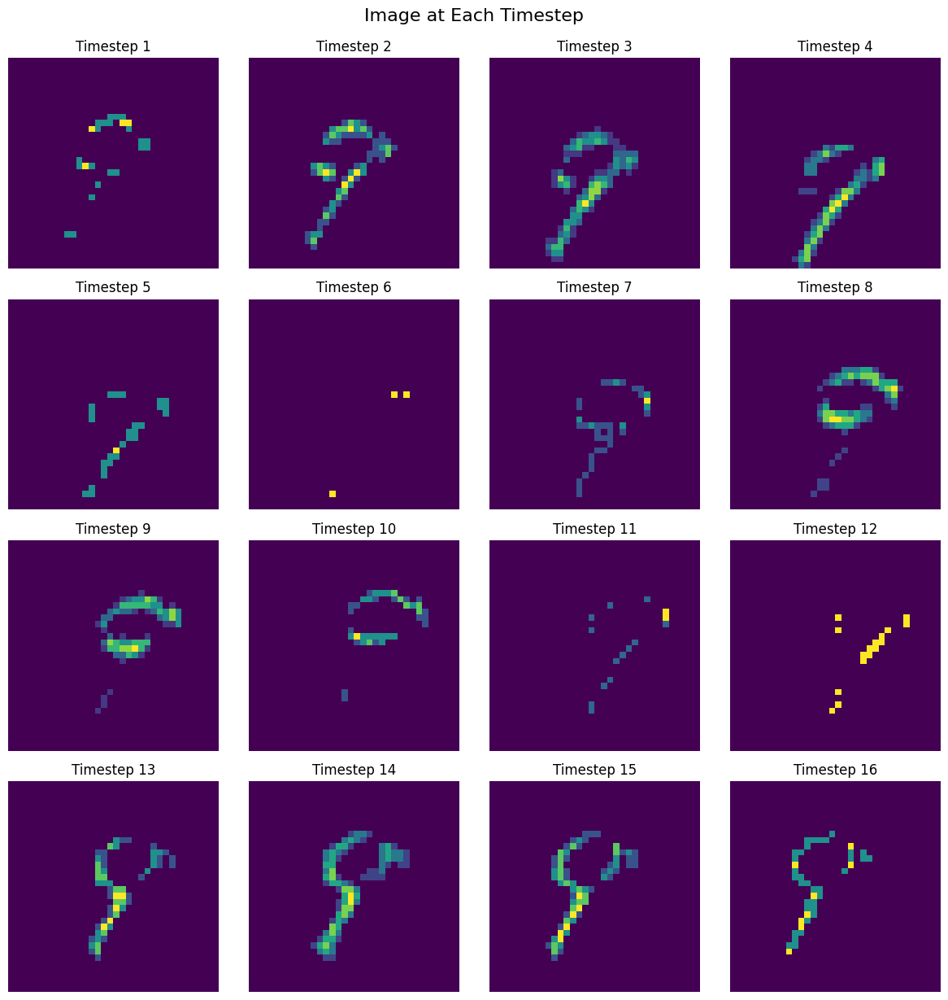

In [20]:
plot_frames_without_polarity_permuted(train_dataset[55143][0])

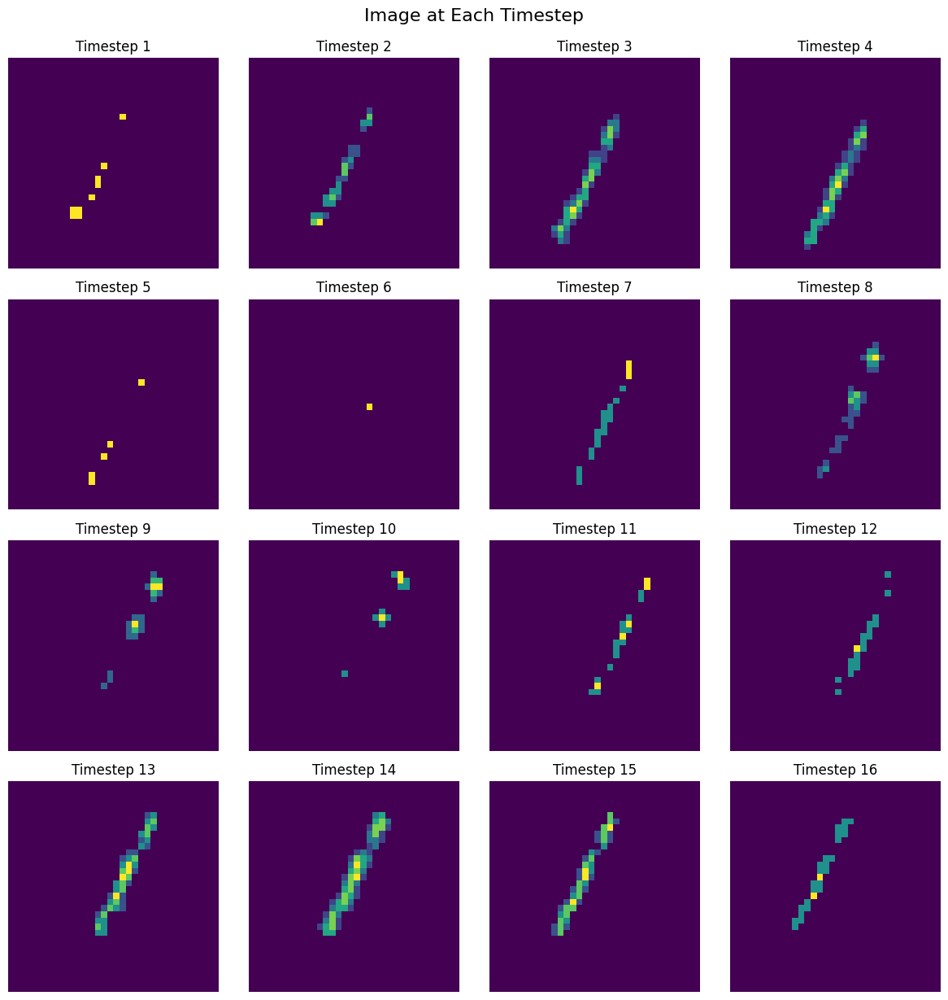

In [21]:
plot_frames_without_polarity_permuted(train_dataset[12345][0])

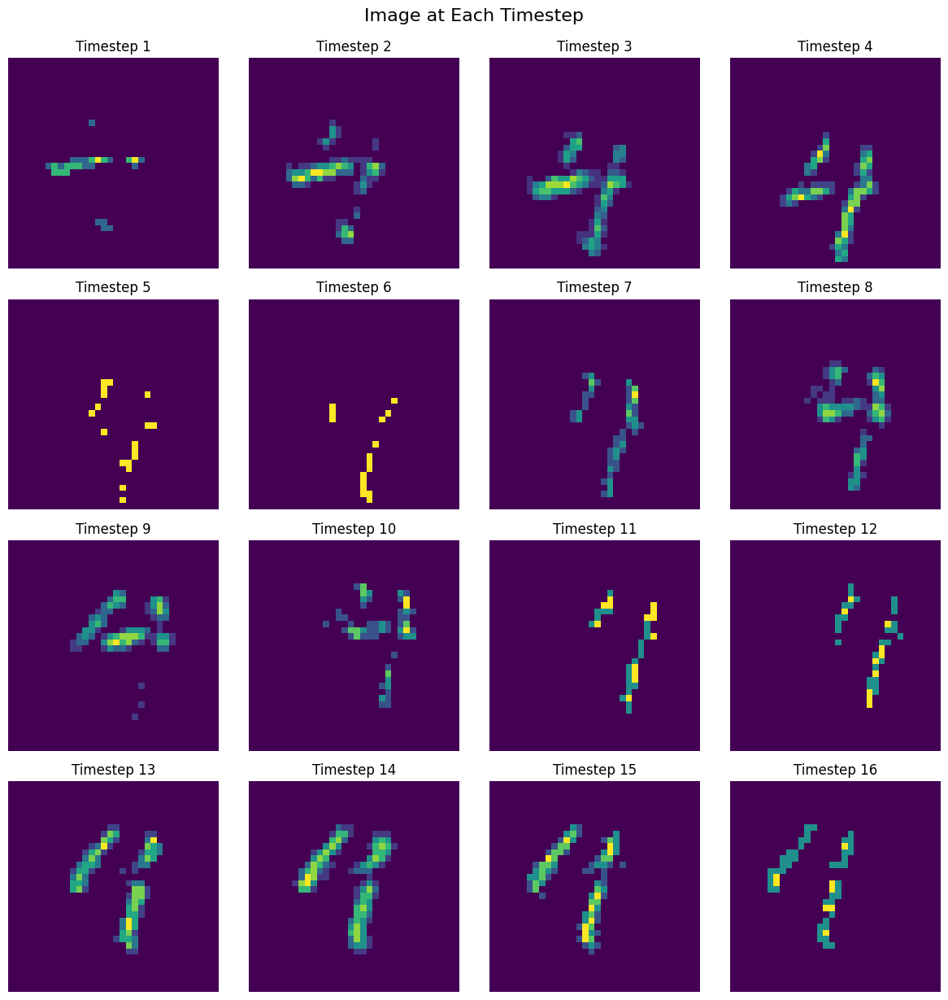

In [22]:
plot_frames_without_polarity_permuted(train_dataset[25143][0])

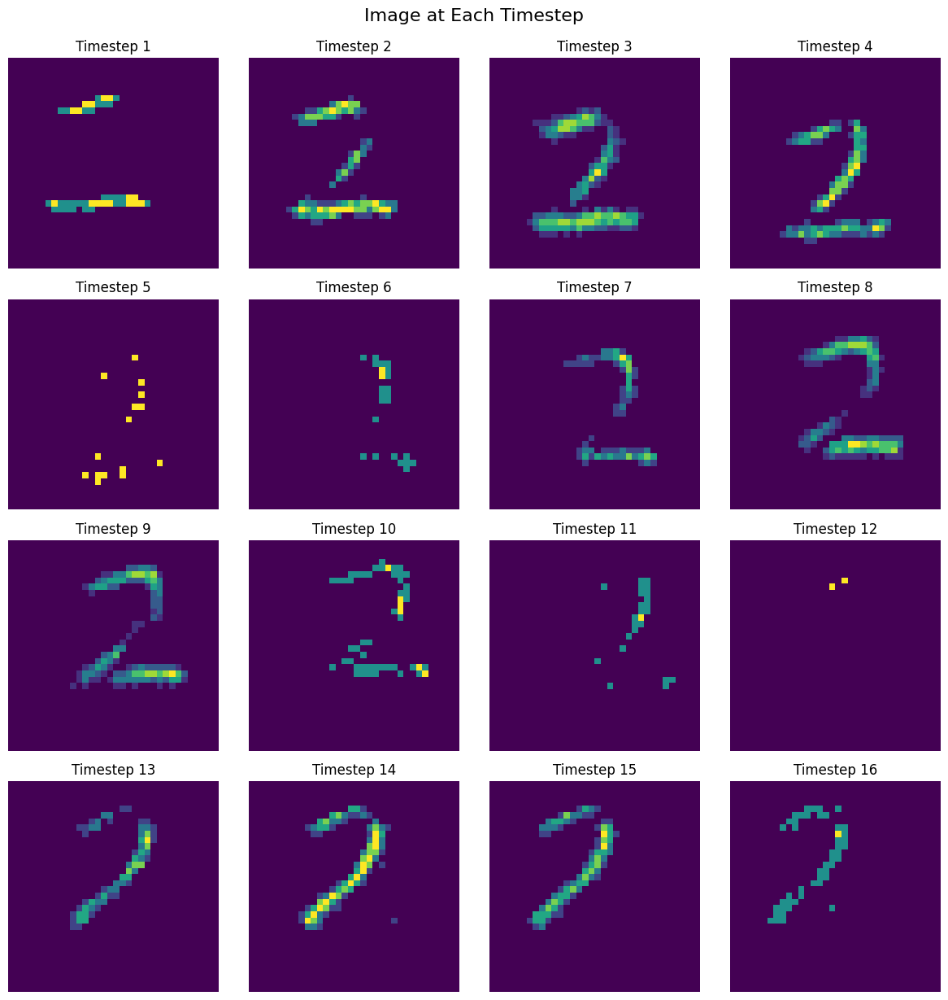

In [23]:
plot_frames_without_polarity_permuted(train_dataset[15143][0])

<h3>Data Loader</h3>

In [24]:
from torch.utils.data import DataLoader

batch_size = 32

trainloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0, pin_memory=True)
testloader = DataLoader(test_dataset, batch_size=batch_size*2, shuffle=False, num_workers=0, pin_memory=True)


In [25]:
data_iter = iter(trainloader)
images, labels = next(data_iter)

print("Train batch - images shape:", images.shape)
print("Train batch - labels shape:", labels.shape)

Train batch - images shape: torch.Size([32, 34, 34, 16])
Train batch - labels shape: torch.Size([32])


In [26]:
data_iter = iter(testloader)
images, labels = next(data_iter)

print("Train batch - images shape:", images.shape)
print("Train batch - labels shape:", labels.shape)

Train batch - images shape: torch.Size([64, 34, 34, 16])
Train batch - labels shape: torch.Size([64])


In [27]:
print("Number of training batches:", len(trainloader))
print("Number of test batches:", len(testloader))

print("Total training samples:", len(train_dataset))
print("Total test samples:", len(test_dataset))

Number of training batches: 1875
Number of test batches: 157
Total training samples: 60000
Total test samples: 10000


----------------------------------------------------------------------------------------------------
tensor(3)
-----------SPIKE INPUT-------------


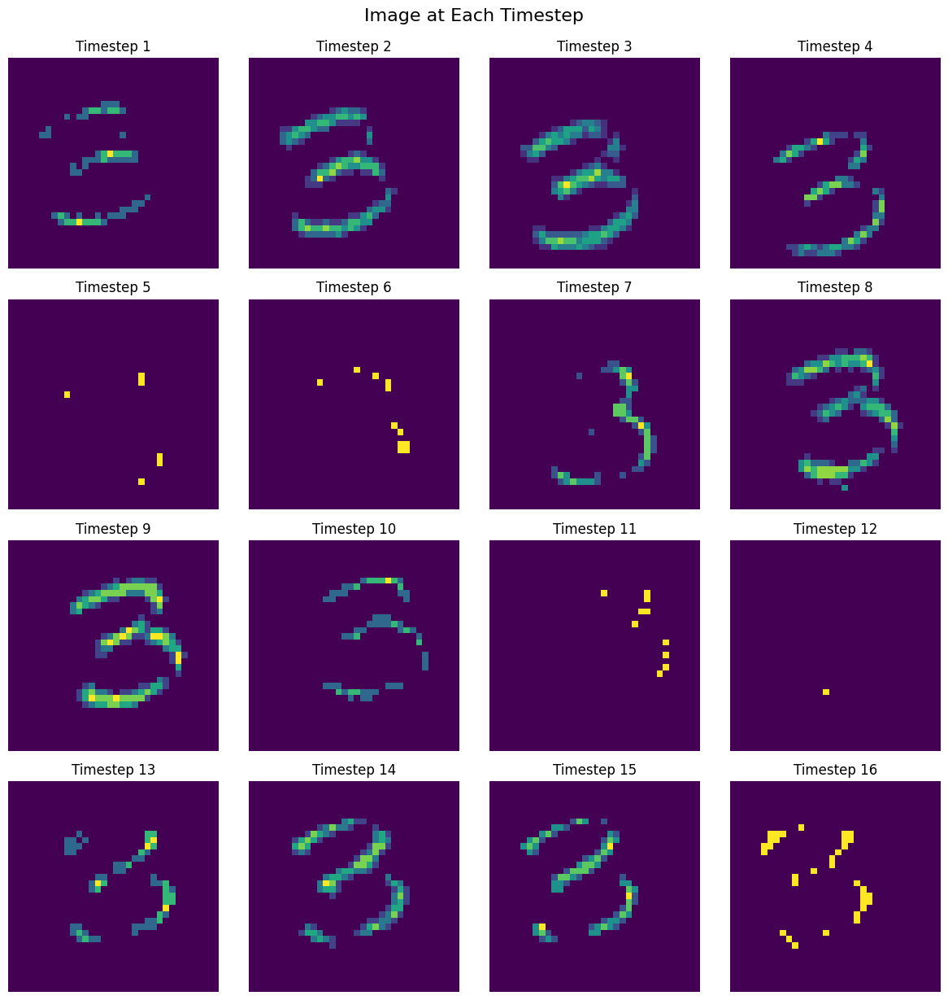

----------------------------------------------------------------------------------------------------
tensor(9)
-----------SPIKE INPUT-------------


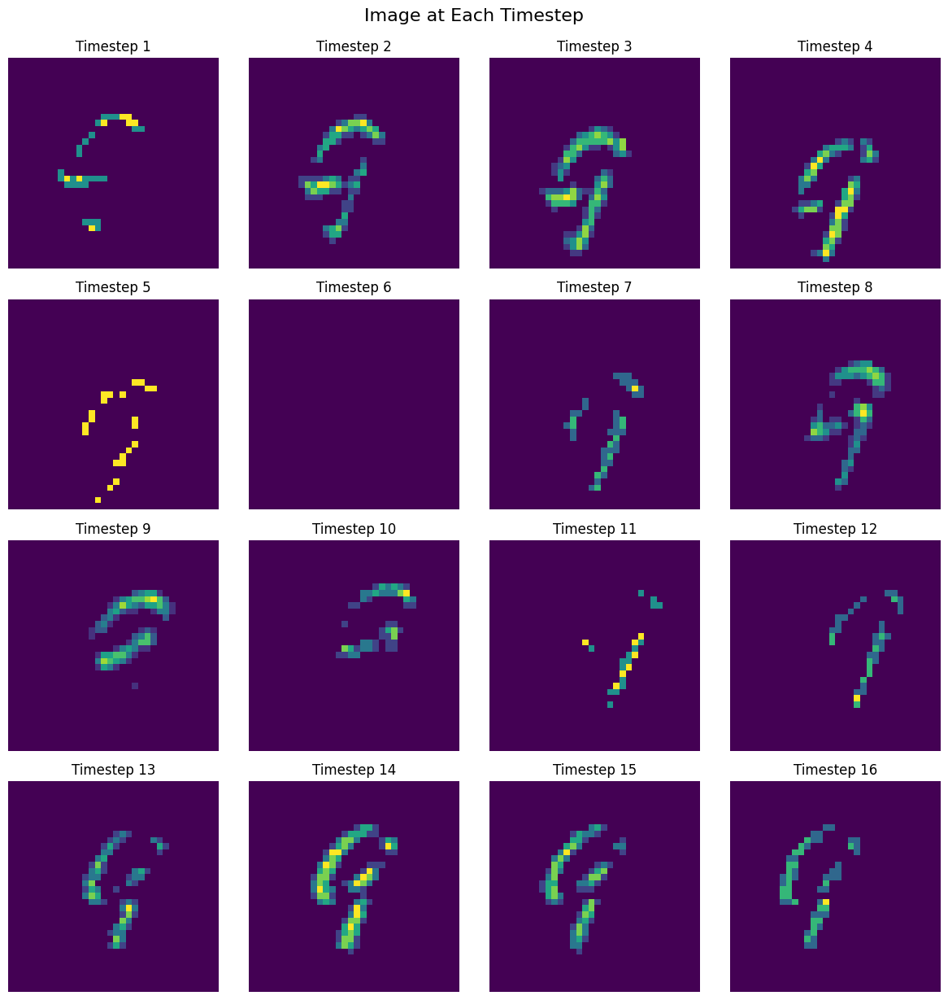

In [28]:
i = 2
for batch_idx, (frame_img, labels) in enumerate(trainloader):
            frame_img = frame_img.to('cpu', non_blocking=True)
            labels = labels.to('cpu', non_blocking=True)
            spike_input = frame_img.unsqueeze(1)        # [256, 1, 34, 34, 16]
            print("-"*100)
            print(labels[31])
            print("-----------SPIKE INPUT-------------")
            plot_frames_without_polarity_permuted(spike_input[31][0])
            i = i-1
            if i == 0:
                break

<h3>MODEL</h3>

<h4> LAYERS </h4>

In [29]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [30]:
dt = 5
a = 0.25
aa = 0.5  
Vth = 0.2
tau = 0.35

In [31]:
class SpikeAct(torch.autograd.Function):
    """ 
        Implementation of the spiking activation function with an approximation of gradient.
    """
    @staticmethod
    def forward(ctx, input):
        ctx.save_for_backward(input)
        # if input = u > Vth then output = 1
        output = torch.gt(input, Vth) 
        return output.float()

    @staticmethod
    def backward(ctx, grad_output):
        input, = ctx.saved_tensors 
        grad_input = grad_output.clone()
        # hu is an approximate func of df/du
        hu = abs(input) < aa
        hu = hu.float() / (2 * aa)
        return grad_input * hu

class LIFSpike(nn.Module):
    """
        Generates spikes based on LIF module. It can be considered as an activation function and is used similar to ReLU. The input tensor needs to have an additional time dimension, which in this case is on the last dimension of the data.
    """
    def __init__(self):
        super(LIFSpike, self).__init__()

    def forward(self, x):
        nsteps = x.shape[-1]
        u   = torch.zeros(x.shape[:-1] , device=x.device)
        out = torch.zeros(x.shape, device=x.device)
        for step in range(nsteps):
            u, out[..., step] = self.state_update(u, out[..., max(step-1, 0)], x[..., step])
        return out
    
    def state_update(self, u_t_n1, o_t_n1, W_mul_o_t1_n, tau=tau):
        u_t1_n1 = tau * u_t_n1 * (1 - o_t_n1) + W_mul_o_t1_n
        o_t1_n1 = SpikeAct.apply(u_t1_n1)
        return u_t1_n1, o_t1_n1

class MySpikeAct(SpikeAct):
    """
        Implementation of the spiking activation function with an approximation of gradient.
    """
    @staticmethod
    def forward(ctx, input):
        data, Vth = input
        ctx.save_for_backward(input)
        # if input = u > Vth then output = 1
        output = torch.gt(data, Vth)
        return output.float()

    @staticmethod
    def backward(ctx, grad_output):
        data, Vth, = ctx.saved_tensors
        grad_input = grad_output.clone()
        # hu is an approximate func of df/du
        hu = abs(data) < aa
        hu = hu.float() / (2 * aa)
        return grad_input * hu


class MyLIFSpike(LIFSpike):
    """
        Generates spikes based on LIF module. It can be considered as an activation function and is used similar to ReLU. The input tensor needs to have an additional time dimension, which in this case is on the last dimension of the data.
    """

    def __init__(self):
        super(MyLIFSpike, self).__init__()

    def forward(self, input):
        x, Vth = input
        nsteps = x.shape[-1]
        u   = torch.zeros(x.shape[:-1] , device=x.device)
        out = torch.zeros(x.shape, device=x.device)
        for step in range(nsteps):
            u, out[..., step] = self.state_update(u, out[..., max(step-1, 0)], x[..., step], Vth)
        return out

    def state_update(self, u_t_n1, o_t_n1, W_mul_o_t1_n, Vth, tau=tau):
        u_t1_n1 = tau * u_t_n1 * (1 - o_t_n1) + W_mul_o_t1_n
        o_t1_n1 = MySpikeAct.apply([u_t1_n1, Vth])
        return u_t1_n1, o_t1_n1


In [32]:
class tdLinear(nn.Linear):
    def __init__(self, 
                in_features,
                out_features,
                bias=True,
                bn=None,
                spike=None):
        assert type(in_features) == int, 'inFeatures should not be more than 1 dimesnion. It was: {}'.format(in_features.shape)
        assert type(out_features) == int, 'outFeatures should not be more than 1 dimesnion. It was: {}'.format(out_features.shape)

        super(tdLinear, self).__init__(in_features, out_features, bias=bias)

        self.bn = bn
        self.spike = spike
        

    def forward(self, x):
        """
        x : (N,C,T)
        """        
        x = x.transpose(1, 2) # (N, T, C)
        y = F.linear(x, self.weight, self.bias)
        y = y.transpose(1, 2)# (N, C, T)
        
        if self.bn is not None:
            y = y[:,:,None,None,:]
            y = self.bn(y)
            y = y[:,:,0,0,:]
        if self.spike is not None:
            y = self.spike(y)
        return y


In [33]:
class tdConv(nn.Conv3d):
    def __init__(self, 
                in_channels, 
                out_channels,  
                kernel_size,
                stride=1,
                padding=0,
                dilation=1,
                groups=1,
                bias=True,
                bn=None,
                spike=None,
                is_first_conv=False):

        # kernel
        if type(kernel_size) == int:
            kernel = (kernel_size, kernel_size, 1)
        elif len(kernel_size) == 2:
            kernel = (kernel_size[0], kernel_size[1], 1)
        else:
            raise Exception('kernelSize can only be of 1 or 2 dimension. It was: {}'.format(kernel_size.shape))

        # stride
        if type(stride) == int:
            stride = (stride, stride, 1)
        elif len(stride) == 2:
            stride = (stride[0], stride[1], 1)
        else:
            raise Exception('stride can be either int or tuple of size 2. It was: {}'.format(stride.shape))

        # padding
        if type(padding) == int:
            padding = (padding, padding, 0)
        elif len(padding) == 2:
            padding = (padding[0], padding[1], 0)
        else:
            raise Exception('padding can be either int or tuple of size 2. It was: {}'.format(padding.shape))

        # dilation
        if type(dilation) == int:
            dilation = (dilation, dilation, 1)
        elif len(dilation) == 2:
            dilation = (dilation[0], dilation[1], 1)
        else:
            raise Exception('dilation can be either int or tuple of size 2. It was: {}'.format(dilation.shape))

        super(tdConv, self).__init__(in_channels, out_channels, kernel, stride, padding, dilation, groups,
                                        bias=bias)
        self.bn = bn
        self.spike = spike
        self.is_first_conv = is_first_conv

    def forward(self, x):
        x = F.conv3d(x, self.weight, self.bias,
                        self.stride, self.padding, self.dilation, self.groups)
        if self.bn is not None:
            x = self.bn(x)
        if self.spike is not None:
            x = self.spike(x)
        return x

In [34]:
class tdConvTranspose(nn.ConvTranspose3d):
    def __init__(self, 
                in_channels, 
                out_channels,  
                kernel_size,
                stride=1,
                padding=0,
                output_padding=0,
                dilation=1,
                groups=1,
                bias=True,
                bn=None,
                spike=None):

        # kernel
        if type(kernel_size) == int:
            kernel = (kernel_size, kernel_size, 1)
        elif len(kernel_size) == 2:
            kernel = (kernel_size[0], kernel_size[1], 1)
        else:
            raise Exception('kernelSize can only be of 1 or 2 dimension. It was: {}'.format(kernel_size.shape))

        # stride
        if type(stride) == int:
            stride = (stride, stride, 1)
        elif len(stride) == 2:
            stride = (stride[0], stride[1], 1)
        else:
            raise Exception('stride can be either int or tuple of size 2. It was: {}'.format(stride.shape))

        # padding
        if type(padding) == int:
            padding = (padding, padding, 0)
        elif len(padding) == 2:
            padding = (padding[0], padding[1], 0)
        else:
            raise Exception('padding can be either int or tuple of size 2. It was: {}'.format(padding.shape))

        # dilation
        if type(dilation) == int:
            dilation = (dilation, dilation, 1)
        elif len(dilation) == 2:
            dilation = (dilation[0], dilation[1], 1)
        else:
            raise Exception('dilation can be either int or tuple of size 2. It was: {}'.format(dilation.shape))


        # output padding
        if type(output_padding) == int:
            output_padding = (output_padding, output_padding, 0)
        elif len(output_padding) == 2:
            output_padding = (output_padding[0], output_padding[1], 0)
        elif len(output_padding) == 3:
            output_padding = output_padding
        else:
            raise Exception('output_padding can be either int or tuple of size 2 or tuple of size 3. It was: {}'.format(padding.shape))

        super().__init__(in_channels, out_channels, kernel, stride, padding, output_padding, groups,
                                        bias=bias, dilation=dilation)

        self.bn = bn
        self.spike = spike

    def forward(self, x):
        x = F.conv_transpose3d(x, self.weight, self.bias,
                        self.stride, self.padding, 
                        self.output_padding, self.groups, self.dilation)

        if self.bn is not None:
            x = self.bn(x)
        if self.spike is not None:
            x = self.spike(x)
        return x

In [35]:
class tdBatchNorm(nn.BatchNorm2d):
    """
        Implementation of tdBN. Link to related paper: https://arxiv.org/pdf/2011.05280. In short it is averaged over the time domain as well when doing BN.
    Args:
        num_features (int): same with nn.BatchNorm2d
        eps (float): same with nn.BatchNorm2d
        momentum (float): same with nn.BatchNorm2d
        alpha (float): an addtional parameter which may change in resblock.
        affine (bool): same with nn.BatchNorm2d
        track_running_stats (bool): same with nn.BatchNorm2d
    """
    def __init__(self, num_features, eps=1e-05, momentum=0.2, alpha=0.9, affine=True, track_running_stats=True):
        super(tdBatchNorm, self).__init__(
            num_features, eps, momentum, affine, track_running_stats)
        self.alpha = alpha

    def forward(self, input):
        exponential_average_factor = 0.0

        if self.training and self.track_running_stats:
            if self.num_batches_tracked is not None:
                self.num_batches_tracked += 1
                if self.momentum is None:  # use cumulative moving average
                    exponential_average_factor = 1.0 / float(self.num_batches_tracked)
                else:  # use exponential moving average
                    exponential_average_factor = self.momentum

        # calculate running estimates
        if self.training:
            mean = input.mean([0, 2, 3, 4])
            # use biased var in train
            var = input.var([0, 2, 3, 4], unbiased=False)
            n = input.numel() / input.size(1)
            with torch.no_grad():
                self.running_mean = exponential_average_factor * mean\
                    + (1 - exponential_average_factor) * self.running_mean
                # update running_var with unbiased var
                self.running_var = exponential_average_factor * var * n / (n - 1)\
                    + (1 - exponential_average_factor) * self.running_var
        else:
            mean = self.running_mean
            var = self.running_var

        input = self.alpha * Vth * (input - mean[None, :, None, None, None]) / (torch.sqrt(var[None, :, None, None, None] + self.eps))
        if self.affine:
            input = input * self.weight[None, :, None, None, None] + self.bias[None, :, None, None, None]
        
        return input


In [36]:
class PSP(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.tau_s = 2

    def forward(self, inputs):
        """
        inputs: (N, C, T)
        """
        syns = None
        syn = 0
        n_steps = inputs.shape[-1]
        for t in range(n_steps):
            syn = syn + (inputs[...,t] - syn) / self.tau_s
            if syns is None:
                syns = syn.unsqueeze(-1)
            else:
                syns = torch.cat([syns, syn.unsqueeze(-1)], dim=-1)

        return syns


In [37]:
class MembraneOutputLayer(nn.Module):
    """
    outputs the last time membrane potential of the LIF neuron with V_th=infty
    """
    def __init__(self, n_steps=None) -> None:
        super().__init__()
        if n_steps is None:
            n_steps = 16

        arr = torch.arange(n_steps-1,-1,-1)
        self.register_buffer("coef", torch.pow(0.8, arr)[None,None,None,None,:]) # (1,1,1,1,T)

    def forward(self, x):
        """
        x : (N,C,H,W,T)
        """
        out = torch.sum(x*self.coef, dim=-1)
        return out

In [38]:
class PosteriorBernoulliSTBP(nn.Module):
    def __init__(self, k=20) -> None:
        """
        modeling of q(z_t | x_<=t, z_<t)
        """
        super().__init__()
        self.channels = 32
        self.k = k
        self.n_steps = 16

        self.layers = nn.Sequential(
            tdLinear(self.channels*2,
                    self.channels*2,
                    bias=True,
                    bn=tdBatchNorm(self.channels*2, alpha=2), 
                    spike=LIFSpike()),
            tdLinear(self.channels*2,
                    self.channels*4,
                    bias=True,
                    bn=tdBatchNorm(self.channels*4, alpha=2),
                    spike=LIFSpike()),
            tdLinear(self.channels*4,
                    self.channels*k,
                    bias=True,
                    bn=tdBatchNorm(self.channels*k, alpha=2),
                    spike=LIFSpike())
        )
        self.register_buffer('initial_input', torch.zeros(1, self.channels, 1))# (1,C,1)

        self.is_true_scheduled_sampling = True

    def forward(self, x):
        """
        input: 
            x:(B,C,T)
        returns: 
            sampled_z:(B,C,T)
            q_z: (B,C,k,T) # indicates q(z_t | x_<=t, z_<t) (t=1,...,T)
        """
        x_shape = x.shape # (B,C,T)
        batch_size=x_shape[0]
        random_indices = []
        # sample z inadvance without gradient
        with torch.no_grad():
            z_t_minus = self.initial_input.repeat(x_shape[0],1,1) # z_<t z0=zeros:(B,C,1)
            for t in range(self.n_steps-1):
                inputs = torch.cat([x[...,:t+1].detach(), z_t_minus.detach()], dim=1) # (B,C+C,t+1) x_<=t and z_<t
                outputs = self.layers(inputs) #(B, C*k, t+1) 
                q_z_t = outputs[...,-1] # (B, C*k, 1) q(z_t | x_<=t, z_<t) 
                
                # sampling from q(z_t | x_<=t, z_<t)
                random_index = torch.randint(0, self.k, (batch_size*self.channels,)) \
                            + torch.arange(start=0, end=batch_size*self.channels*self.k, step=self.k) #(B*C,) select 1 from every k value
                random_index = random_index.to(x.device)
                random_indices.append(random_index)

                z_t = q_z_t.view(batch_size*self.channels*self.k)[random_index] # (B*C,)
                z_t = z_t.view(batch_size, self.channels, 1) #(B,C,1)

                z_t_minus = torch.cat([z_t_minus, z_t], dim=-1) # (B,C,t+2)

        z_t_minus = z_t_minus.detach() # (B,C,T) z_0,...,z_{T-1}
        q_z = self.layers(torch.cat([x, z_t_minus], dim=1)) # (B,C*k,T)
        
        # input z_t_minus again to calculate tdBN
        sampled_z = None
        for t in range(self.n_steps):
            
            if t == self.n_steps-1:
                # when t=T
                random_index = torch.randint(0, self.k, (batch_size*self.channels,)) \
                            + torch.arange(start=0, end=batch_size*self.channels*self.k, step=self.k)
                random_indices.append(random_index)
            else:
                # when t<=T-1
                random_index = random_indices[t]

            # sampling
            sampled_z_t = q_z[...,t].view(batch_size*self.channels*self.k)[random_index] # (B*C,)
            sampled_z_t = sampled_z_t.view(batch_size, self.channels, 1) #(B,C,1)
            if t==0:
                sampled_z = sampled_z_t
            else:
                sampled_z = torch.cat([sampled_z, sampled_z_t], dim=-1)
                
        q_z = q_z.view(batch_size, self.channels, self.k, self.n_steps)# (B,C,k,T)

        return sampled_z, q_z

In [39]:
class PriorBernoulliSTBP(nn.Module):
    def __init__(self, k=20) -> None:
        """
        modeling of p(z_t|z_<t)
        """
        super().__init__()
        self.channels = 32
        self.k = k
        self.n_steps = 16

        self.layers = nn.Sequential(
            tdLinear(self.channels,
                    self.channels*2,
                    bias=True,
                    bn=tdBatchNorm(self.channels*2, alpha=2), 
                    spike=LIFSpike()),
            tdLinear(self.channels*2,
                    self.channels*4,
                    bias=True,
                    bn=tdBatchNorm(self.channels*4, alpha=2),
                    spike=LIFSpike()),
            tdLinear(self.channels*4,
                    self.channels*k,
                    bias=True,
                    bn=tdBatchNorm(self.channels*k, alpha=2),
                    spike=LIFSpike())
        )
        self.register_buffer('initial_input', torch.zeros(1, self.channels, 1))# (1,C,1)


    def forward(self, z, scheduled=False, p=None):
        if scheduled:
            return self._forward_scheduled_sampling(z, p)
        else:
            return self._forward(z)
    
    def _forward(self, z):
        """
        input z: (B,C,T) # latent spike sampled from posterior
        output : (B,C,k,T) # indicates p(z_t|z_<t) (t=1,...,T)
        """
        z_shape = z.shape # (B,C,T)
        batch_size = z_shape[0]
        z = z.detach()

        z0 = self.initial_input.repeat(batch_size, 1, 1) # (B,C,1)
        inputs = torch.cat([z0, z[...,:-1]], dim=-1) # (B,C,T)
        outputs = self.layers(inputs) # (B,C*k,T)
        
        p_z = outputs.view(batch_size, self.channels, self.k, self.n_steps) # (B,C,k,T)
        return p_z

    def _forward_scheduled_sampling(self, z, p):
        """
        use scheduled sampling
        input 
            z: (B,C,T) # latent spike sampled from posterior
            p: float # prob of scheduled sampling
        output : (B,C,k,T) # indicates p(z_t|z_<t) (t=1,...,T)
        """
        z_shape = z.shape # (B,C,T)
        batch_size = z_shape[0]
        z = z.detach()

        z_t_minus = self.initial_input.repeat(batch_size,1,1) # z_<t, z0=zeros:(B,C,1)
        if self.training:
            with torch.no_grad():
                for t in range(self.n_steps-1):
                    if t>=5 and random.random() < p: # scheduled sampling                    
                        outputs = self.layers(z_t_minus.detach()) #binary (B, C*k, t+1) z_<=t
                        p_z_t = outputs[...,-1] # (B, C*k, 1)
                        # sampling from p(z_t | z_<t)
                        prob1 = p_z_t.view(batch_size, self.channels, self.k).mean(-1) # (B,C)
                        prob1 = prob1 + 1e-3 * torch.randn_like(prob1) 
                        z_t = (prob1>0.5).float() # (B,C)
                        z_t = z_t.view(batch_size, self.channels, 1) #(B,C,1)
                        z_t_minus = torch.cat([z_t_minus, z_t], dim=-1) # (B,C,t+2)
                    else:
                        z_t_minus = torch.cat([z_t_minus, z[...,t].unsqueeze(-1)], dim=-1) # (B,C,t+2)
        else: # for test time
            z_t_minus = torch.cat([z_t_minus, z[:,:,:-1]], dim=-1) # (B,C,T)

        z_t_minus = z_t_minus.detach() # (B,C,T) z_{<=T-1} 
        p_z = self.layers(z_t_minus) # (B,C*k,T)
        p_z = p_z.view(batch_size, self.channels, self.k, self.n_steps)# (B,C,k,T)
        return p_z

    def sample(self, batch_size=32):
        z_minus_t = self.initial_input.repeat(batch_size, 1, 1) # (B, C, 1)
        for t in range(self.n_steps):
            outputs = self.layers(z_minus_t) # (B, C*k, t+1)
            p_z_t = outputs[...,-1] # (B, C*k, 1)

            random_index = torch.randint(0, self.k, (batch_size*self.channels,)) \
                            + torch.arange(start=0, end=batch_size*self.channels*self.k, step=self.k) #(B*C,) pick one from k
            random_index = random_index.to(z_minus_t.device)

            z_t = p_z_t.view(batch_size*self.channels*self.k)[random_index] # (B*C,)
            z_t = z_t.view(batch_size, self.channels, 1) #(B,C,1)
            z_minus_t = torch.cat([z_minus_t, z_t], dim=-1) # (B,C,t+2)

        
        sampled_z = z_minus_t[...,1:] # (B,C,T)

        return sampled_z


<h4>ESVAE</h4>

In [40]:
class MMD_loss(nn.Module):
    def __init__(self, kernel_type='linear', kernel_mul=2.0, kernel_num=5):
        super(MMD_loss, self).__init__()
        self.kernel_num = kernel_num
        self.kernel_mul = kernel_mul
        self.fix_sigma = None
        self.kernel_type = kernel_type

    def guassian_kernel(self, source, target, kernel_mul=2.0, kernel_num=5, fix_sigma=None):
        n_samples = int(source.size()[0]) + int(target.size()[0])
        total = torch.cat([source, target], dim=0)
        total0 = total.unsqueeze(0).expand(
            int(total.size(0)), int(total.size(0)), int(total.size(1)))
        total1 = total.unsqueeze(1).expand(
            int(total.size(0)), int(total.size(0)), int(total.size(1)))
        L2_distance = ((total0-total1)**2).sum(2)
        if fix_sigma:
            bandwidth = fix_sigma
        else:
            bandwidth = torch.sum(L2_distance.data) / (n_samples**2-n_samples)
        bandwidth /= kernel_mul ** (kernel_num // 2)
        bandwidth_list = [bandwidth * (kernel_mul**i)
                          for i in range(kernel_num)]
        kernel_val = [torch.exp(-L2_distance / bandwidth_temp)
                      for bandwidth_temp in bandwidth_list]
        return sum(kernel_val)

    def linear_mmd2(self, f_of_X, f_of_Y):
        loss = 0.0
        delta = f_of_X.float().mean(0) - f_of_Y.float().mean(0)
        loss = delta.dot(delta.T)
        return loss

    def forward(self, source, target):
        if self.kernel_type == 'linear':
            return self.linear_mmd2(source, target)
        elif self.kernel_type == 'rbf':
            batch_size = int(source.size()[0])
            kernels = self.guassian_kernel(
                source, target, kernel_mul=self.kernel_mul, kernel_num=self.kernel_num, fix_sigma=self.fix_sigma)
            XX = torch.mean(kernels[:batch_size, :batch_size])
            YY = torch.mean(kernels[batch_size:, batch_size:])
            XY = torch.mean(kernels[:batch_size, batch_size:])
            YX = torch.mean(kernels[batch_size:, :batch_size])
            loss = torch.mean(XX + YY - XY - YX)
            return loss

In [41]:
class SampledSpikeAct(torch.autograd.Function):
    """
        Implementation of the spiking activation function with an approximation of gradient.
    """

    @staticmethod
    def forward(ctx, input):
        random_sign = torch.rand_like(input, dtype=input.dtype).to(input.device)
        ctx.save_for_backward(input, random_sign)
        # if input = u > Vth then output = 1
        output = torch.gt(input, random_sign)
        return output.float()

    @staticmethod
    def backward(ctx, grad_output):
        input, random_sign = ctx.saved_tensors
        grad_input = grad_output.clone()
        # hu is an approximate func of df/du
        hu = abs(input - random_sign) < aa
        hu = hu.float() / (2 * aa)
        return grad_input * hu

In [42]:
class ESVAE(nn.Module):
    def __init__(self, device='cuda:0', distance_lambda=0.001, mmd_type='rbf'):
        super().__init__()

        in_channels = 1
        latent_dim = 64
        self.latent_dim = latent_dim
        self.n_steps = 16

        self.device = device
        self.distance_lambda = distance_lambda
        self.mmd_type = mmd_type

        self.k = 20

        hidden_dims = [32, 64, 128, 256, 512]
        self.hidden_dims = hidden_dims.copy()

        # Build Encoder
        modules = []
        is_first_conv = True
        for h_dim in hidden_dims:
            modules.append(
                tdConv(in_channels,
                       out_channels=h_dim,
                       kernel_size=3,
                       stride=2,
                       padding=1,
                       bias=True,
                       bn=tdBatchNorm(h_dim),
                       spike=LIFSpike(),
                       is_first_conv=is_first_conv)
            )
            in_channels = h_dim
            is_first_conv = False

        self.encoder = nn.Sequential(*modules)
        self.before_latent_layer = tdLinear(hidden_dims[-1] * 4,
                                            latent_dim,
                                            bias=True,
                                            bn=tdBatchNorm(latent_dim),
                                            spike=LIFSpike())

        self.prior = PriorBernoulliSTBP(self.k)

        self.posterior = PosteriorBernoulliSTBP(self.k)

        # Build Decoder
        modules = []

        self.decoder_input = tdLinear(latent_dim,
                                      hidden_dims[-1] * 4,
                                      bias=True,
                                      bn=tdBatchNorm(hidden_dims[-1] * 4),
                                      spike=LIFSpike())

        hidden_dims.reverse()

        for i in range(len(hidden_dims) - 1):
            modules.append(
                tdConvTranspose(hidden_dims[i],
                                hidden_dims[i + 1],
                                kernel_size=3,
                                stride=2,
                                padding=1,
                                output_padding=0,
                                bias=True,
                                bn=tdBatchNorm(hidden_dims[i + 1]),
                                spike=LIFSpike())
            )
        self.decoder = nn.Sequential(*modules)

        self.final_layer = nn.Sequential(
            # tdConvTranspose(hidden_dims[-1],
            #                 hidden_dims[-1],
            #                 kernel_size=3,
            #                 stride=2,
            #                 padding=1,
            #                 output_padding=1,
            #                 bias=True,
            #                 bn=tdBatchNorm(hidden_dims[-1]),
            #                 spike=LIFSpike()),
            tdConvTranspose(hidden_dims[-1],
                            out_channels=1,
                            kernel_size=3,
                            stride=2,
                            padding=1,
                            output_padding=(1,1,0),
                            bias=True,
                            bn=None,
                            spike=None)
        )

        self.p = 0

        self.membrane_output_layer = MembraneOutputLayer()

        self.psp = PSP()

        self.sample_layer = nn.Sequential(
            nn.Linear(latent_dim, latent_dim),
            nn.Sigmoid()
        )

        self.mmd_loss = MMD_loss(kernel_type=self.mmd_type)

    def forward(self, x, scheduled=False):
        sampled_z_q, r_q, r_p = self.encode(x, scheduled)
        x_recon = self.decode(sampled_z_q)
        return x_recon, r_q, r_p, sampled_z_q

    def encode(self, x, scheduled=False, return_firing_rate=False):
        x = self.encoder(x)  # (N,C,H,W,T)
        x = torch.flatten(x, start_dim=1, end_dim=3)  # (N,C*H*W,T)
        latent_x = self.before_latent_layer(x)  # (N,latent_dim,T)

        sampled_z_q, r_q, r_p = self.gaussian_sample(latent_x, latent_x.shape[0])
        return sampled_z_q, r_q, r_p

    def decode(self, z):
        result = self.decoder_input(z)  # (N,C*H*W,T)
        result = result.view(result.shape[0], self.hidden_dims[-1], 2, 2, self.n_steps)  # (N,C,H,W,T)
        result = self.decoder(result)  # (N,C,H,W,T)
        result = self.final_layer(result)  # (N,C,H,W,T)
        out = result
        # out = torch.tanh(self.membrane_output_layer(result))
        return out

    def sample(self, batch_size=32):
        sampled_z_p, _, _ = self.gaussian_sample(batch_size=batch_size)
        sampled_x = self.decode(sampled_z_p)
        return sampled_x, sampled_z_p

    def gaussian_sample(self, latent_x=None, batch_size=None, mu=None, var=None):
        if latent_x is not None:
            sampled_z_n = torch.randn((batch_size, self.latent_dim)).to(self.device)  # (N, latent_dim)
            r_p = self.sample_layer(sampled_z_n)

            r_q = latent_x.mean(-1, keepdim=True).repeat((1, 1, self.n_steps))
            sampled_z_q = SampledSpikeAct.apply(r_q)

            r_q = latent_x.mean(-1)   # (N, latent_dim)

            return sampled_z_q, r_q, r_p
        else:
            sampled_z_n = torch.randn((batch_size, self.latent_dim)).to(self.device)
            # if mu is None and var is None:
            #     mu = self.mu
            #     var = self.var
            # var = var * torch.ones_like(sampled_p).to(self.device)  # (N, latent_dim)
            # mu = mu * torch.ones_like(sampled_p).to(self.device)  # (N, latent_dim)
            # sampled_p = mu + sampled_z_n * var
            r_p = self.sample_layer(sampled_z_n)
            r_p = r_p.unsqueeze(dim=-1).repeat((1, 1, self.n_steps))
            sampled_z_q = SampledSpikeAct.apply(r_p)
            return sampled_z_q, None, None

    def loss_function_mmd(self, input_img, recons_img, r_q, r_p):
        """
        r_q is q(z|x): (N,latent_dim)
        r_p is p(z): (N,latent_dim)
        """
        recons_loss = F.mse_loss(recons_img, input_img)
        mmd_loss = self.mmd_loss(r_q, r_p)
        loss = recons_loss + self.distance_lambda * mmd_loss
        return {'loss': loss, 'Reconstruction_Loss': recons_loss, 'Distance_Loss': mmd_loss}

    def weight_clipper(self):
        with torch.no_grad():
            for p in self.parameters():
                p.data.clamp_(-4, 4)

    def update_p(self, epoch, max_epoch):
        init_p = 0.1
        last_p = 0.3
        self.p = (last_p - init_p) * epoch / max_epoch + init_p


In [43]:
n = ESVAE()
n = n.to('cuda:0')

In [44]:
a, b, c, d = n(spike_input.to('cuda:0'))

In [45]:
a.shape

torch.Size([32, 1, 34, 34, 16])

In [46]:
b.shape

torch.Size([32, 64])

In [47]:
c.shape

torch.Size([32, 64])

In [48]:
d.shape

torch.Size([32, 64, 16])

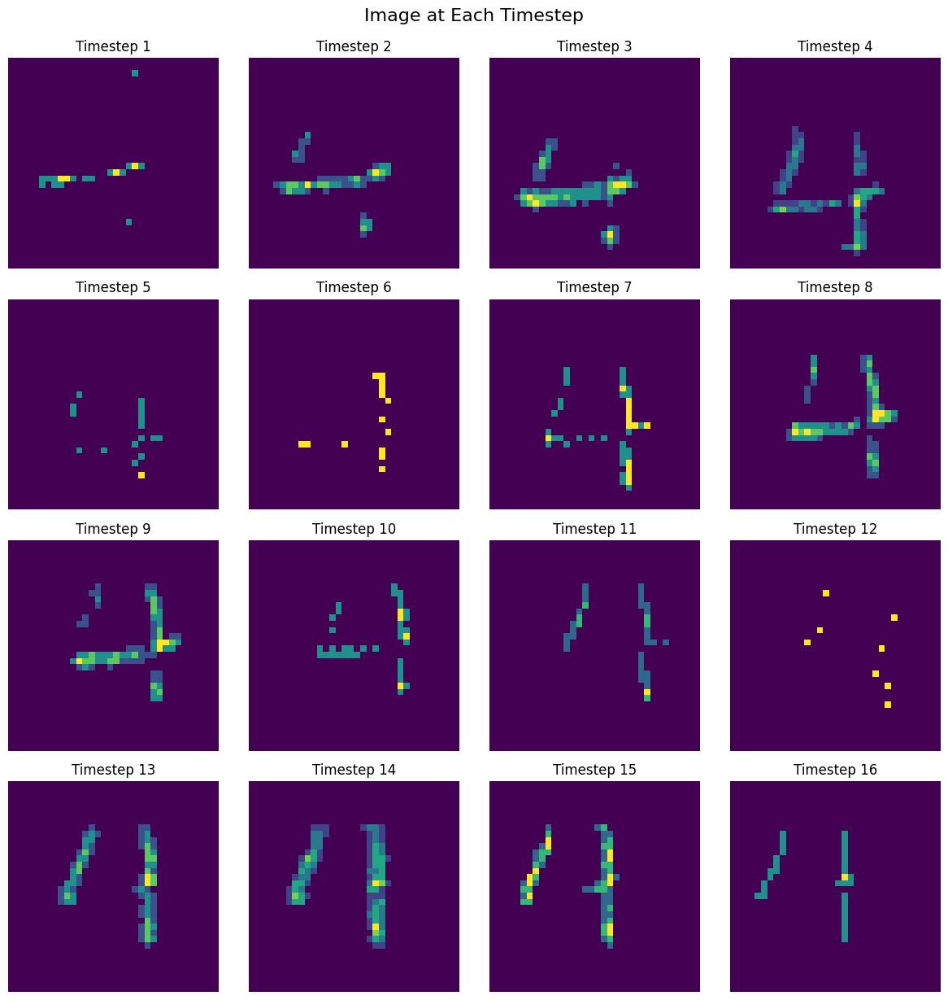

In [49]:
plot_frames_without_polarity_permuted(spike_input[18][0])

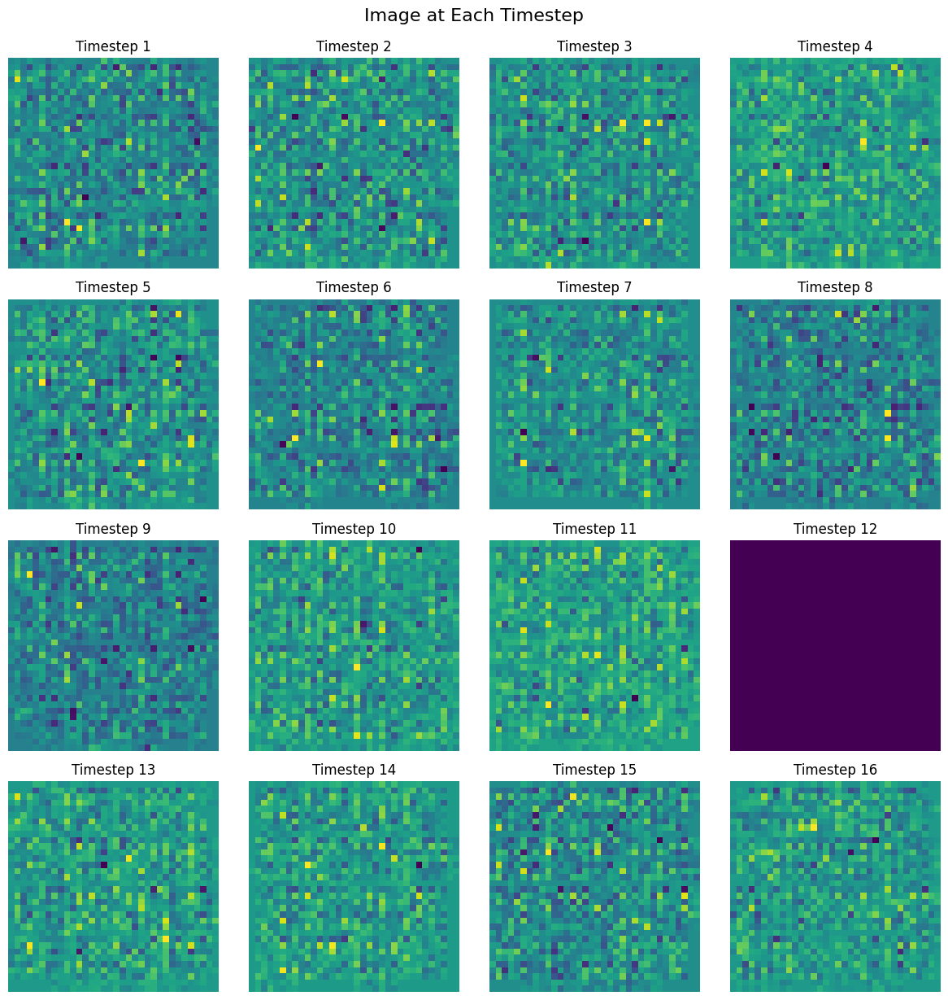

In [50]:
plot_frames_without_polarity_permuted(a[18][0].detach())

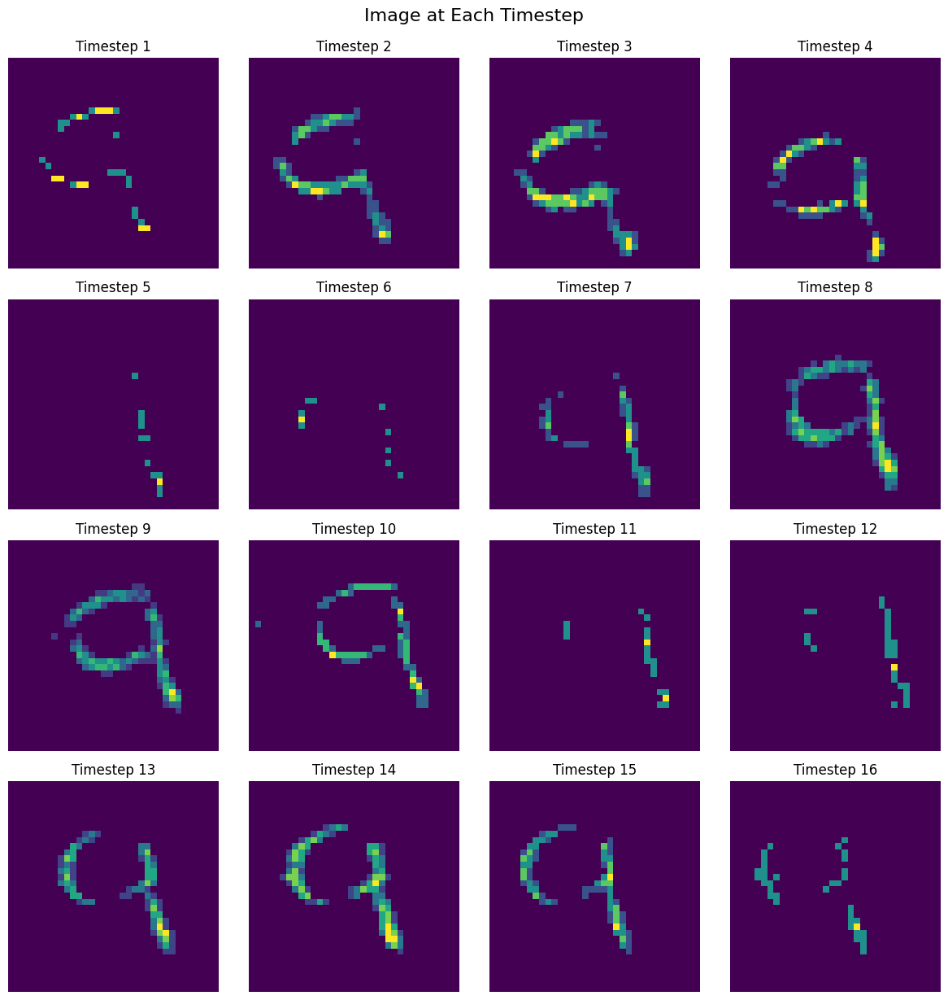

In [51]:
plot_frames_without_polarity_permuted(spike_input[6][0])

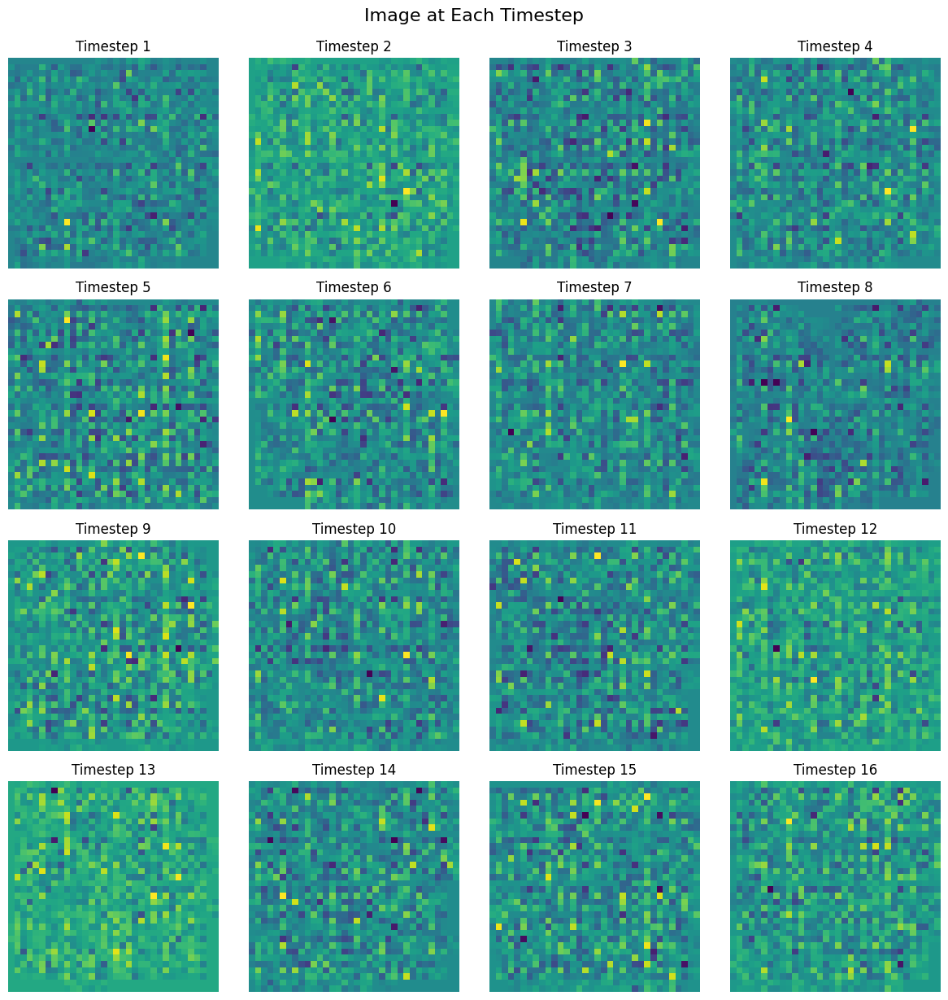

In [52]:
plot_frames_without_polarity_permuted(a[6][0].detach())

In [53]:
F.mse_loss(a, spike_input.to('cuda:0'))

tensor(0.3685, device='cuda:0', grad_fn=<MseLossBackward0>)

In [54]:
mmd_loss = MMD_loss(kernel_type='rbf')

In [55]:
mmd_loss(b,c) + F.mse_loss(a, spike_input.to('cuda:0')) + 0.0001

tensor(5.1156, device='cuda:0', grad_fn=<AddBackward0>)

<h3>UTIL</h3>

In [56]:
class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count


<H3>MAIN</H3>

In [57]:
import os
import os.path
import random
import numpy as np
import logging
import argparse

In [58]:
import torchvision


In [59]:
from torch.utils.tensorboard import SummaryWriter

In [60]:
os.makedirs(f'esvae_v6/checkpoint/nmnist/temp', exist_ok=True)
writer = SummaryWriter(log_dir=f'esvae_v6/checkpoint/nmnist/temp/tb')

In [61]:
def train(network, trainloader, opti, epoch):
    n_steps = 16
    max_epoch = 15

    loss_meter = AverageMeter()
    recons_meter = AverageMeter()
    dist_meter = AverageMeter()

    mean_r_q = 0
    mean_r_p = 0
    mean_sampled_z_q = 0

    network = network.train()

    for batch_idx, (real_img, labels) in enumerate(trainloader):
        opti.zero_grad()
        real_img = real_img.to('cuda:0', non_blocking=True)
        labels = labels.to('cuda:0', non_blocking=True)
        # direct spike input
        spike_input = real_img.unsqueeze(1)
        x_recon, r_q, r_p, sampled_z_q = network(spike_input,
                                                  scheduled=True)  # sampled_z (N, latent_dim, T)

        losses = network.loss_function_mmd(spike_input, x_recon, r_q, r_p)

        losses['loss'].backward()

        opti.step()

        loss_meter.update(losses['loss'].detach().cpu().item())
        recons_meter.update(losses['Reconstruction_Loss'].detach().cpu().item())
        dist_meter.update(losses['Distance_Loss'].detach().cpu().item())

        mean_r_q = (r_q.mean(0).detach().cpu() + batch_idx * mean_r_q) / (batch_idx + 1)  # (latent_dim)
        mean_r_p = (r_p.mean(0).detach().cpu() + batch_idx * mean_r_p) / (batch_idx + 1)  # (latent_dim)
        mean_sampled_z_q = (sampled_z_q.mean(0).detach().cpu() + batch_idx * mean_sampled_z_q) / (batch_idx + 1)  # (C,T)

        print(
            f'Train[{epoch}/{max_epoch}] [{batch_idx}/{len(trainloader)}] Loss: {loss_meter.avg}, RECONS: {recons_meter.avg}, DISTANCE: {dist_meter.avg}')

        if batch_idx == len(trainloader) - 1:
            os.makedirs(f'esvae_v5/checkpoint/nmnist/temp/imgs/train/', exist_ok=True)
            # torchvision.utils.save_image((real_img + 1) / 2,
            #                              f'esvae_v5/checkpoint/nmnist/temp/imgs/train/epoch{epoch}_input.png')
            # torchvision.utils.save_image((x_recon + 1) / 2,
            #                              f'esvae_v5/checkpoint/nmnist/temp/imgs/train/epoch{epoch}_recons.png')
            # writer.add_images('Train/input_img', (real_img + 1) / 2, epoch)
            # writer.add_images('Train/recons_img', (x_recon + 1) / 2, epoch)

        # break

    logging.info(f"Train [{epoch}] Loss: {loss_meter.avg} ReconsLoss: {recons_meter.avg} DISTANCE: {dist_meter.avg}")
    writer.add_scalar('Train/loss', loss_meter.avg, epoch)
    writer.add_scalar('Train/recons_loss', recons_meter.avg, epoch)
    writer.add_scalar('Train/distance', dist_meter.avg, epoch)
    writer.add_scalar('Train/mean_r_q', mean_r_q.mean().item(), epoch)
    writer.add_scalar('Train/mean_r_p', mean_r_p.mean().item(), epoch)

    writer.add_image('Train/mean_sampled_z_q', mean_sampled_z_q.unsqueeze(0), epoch)
    writer.add_histogram(f'Train/mean_sampled_z_q_distribution', mean_sampled_z_q.sum(-1), epoch)

    return loss_meter.avg


In [62]:
def test(network, testloader, epoch):
    n_steps = 16
    max_epoch = 15

    loss_meter = AverageMeter()
    recons_meter = AverageMeter()
    dist_meter = AverageMeter()

    mean_r_q = 0
    mean_r_p = 0
    mean_sampled_z_q = 0

    # count_mul_add, hook_handles = add_hook(net)

    network = network.eval()
    with torch.no_grad():
        for batch_idx, (real_img, labels) in enumerate(testloader):
            real_img = real_img.to('cuda:0', non_blocking=True)
            labels = labels.to('cuda:0', non_blocking=True)
            # direct spike input
            spike_input = real_img.unsqueeze(1)
            x_recon, r_q, r_p, sampled_z_q = network(spike_input,
                                                  scheduled=True)  # sampled_z (N, latent_dim, T)

            losses = network.loss_function_mmd(spike_input, x_recon, r_q, r_p)

            mean_r_q = (r_q.mean(0).detach().cpu() + batch_idx * mean_r_q) / (batch_idx + 1)  # (latent_dim)
            mean_r_p = (r_p.mean(0).detach().cpu() + batch_idx * mean_r_p) / (batch_idx + 1)  # (latent_dim)
            mean_sampled_z_q = (sampled_z_q.mean(0).detach().cpu() + batch_idx * mean_sampled_z_q) / (batch_idx + 1)  # (C,T)

            loss_meter.update(losses['loss'].detach().cpu().item())
            recons_meter.update(losses['Reconstruction_Loss'].detach().cpu().item())
            dist_meter.update(losses['Distance_Loss'].detach().cpu().item())

            print(
                f'Test[{epoch}/{max_epoch}] [{batch_idx}/{len(testloader)}] Loss: {loss_meter.avg}, RECONS: {recons_meter.avg}, DISTANCE: {dist_meter.avg}')

            if batch_idx == len(testloader) - 1:
                os.makedirs(f'esvae_v5/checkpoint/nmnist/temp/imgs/test/', exist_ok=True)
                # torchvision.utils.save_image((real_img + 1) / 2,
                #                              f'esvae_v5/checkpoint/nmnist/temp/imgs/test/epoch{epoch}_input.png')
                # torchvision.utils.save_image((x_recon + 1) / 2,
                #                              f'esvae_v5/checkpoint/nmnist/temp/imgs/test/epoch{epoch}_recons.png')
                # writer.add_images('Test/input_img', (real_img + 1) / 2, epoch)
                # writer.add_images('Test/recons_img', (x_recon + 1) / 2, epoch)

            # break

    # logging.info(f"Test [{epoch}] Loss: {loss_meter.avg} ReconsLoss: {recons_meter.avg} DISTANCE: {dist_meter.avg}")
    # writer.add_scalar('Test/loss', loss_meter.avg, epoch)
    # writer.add_scalar('Test/recons_loss', recons_meter.avg, epoch)
    # writer.add_scalar('Test/distance', dist_meter.avg, epoch)
    # writer.add_scalar('Test/mean_r_q', mean_r_q.mean().item(), epoch)
    # writer.add_scalar('Test/mean_r_p', mean_r_p.mean().item(), epoch)
    # writer.add_scalar('Test/mul', count_mul_add.mul_sum.item() / len(testloader), epoch)
    # writer.add_scalar('Test/add', count_mul_add.add_sum.item() / len(testloader), epoch)

    # for handle in hook_handles:
    #     handle.remove()

    # writer.add_image('Test/mean_sampled_z_q', mean_sampled_z_q.unsqueeze(0), epoch)
    # writer.add_histogram('Test/mean_sampled_z_q_distribution', mean_sampled_z_q.sum(-1), epoch)

    return loss_meter.avg


In [63]:
lr = 0.0003
sample_layer_lr_times = 10
distance_lambda = 0.001
loss_func = 'mmd'
mmd_type = 'rbf'
latent_dim = 64

In [64]:
scheduled = True

In [65]:
net = ESVAE()
net = net.to('cuda:0')

In [66]:

    params = list(net.named_parameters())
    param_group = [
        {'params': [p for n, p in params if 'sample_layer' in n], 'weight_decay': 0.001, 'lr': lr * sample_layer_lr_times},
        {'params': [p for n, p in params if 'sample_layer' not in n], 'weight_decay': 0.001, 'lr': lr},
    ]

    optimizer = torch.optim.AdamW(param_group,
                                  lr=lr,
                                  betas=(0.9, 0.999),
                                  weight_decay=0.001)

In [67]:
def write_weight_hist(net, index):
    for n, m in net.named_parameters():
        root, name = os.path.splitext(n)
        writer.add_histogram(root + '/' + name, m, index)

In [ ]:
    for e in range(15):

        write_weight_hist(net, e)
        if scheduled:
            net.update_p(e, 15)
            print("update p")
        train_loss = train(net, trainloader, optimizer, e)
        test_loss = test(net, testloader, e)

update p
Train[0/15] [0/1875] Loss: 0.3079575002193451, RECONS: 0.3031792640686035, DISTANCE: 4.778230667114258
Train[0/15] [1/1875] Loss: 0.29682308435440063, RECONS: 0.29209138453006744, DISTANCE: 4.7316954135894775
Train[0/15] [2/1875] Loss: 0.28869712352752686, RECONS: 0.2840452194213867, DISTANCE: 4.651904265085856
Train[0/15] [3/1875] Loss: 0.28218016028404236, RECONS: 0.2776063531637192, DISTANCE: 4.573804020881653
Train[0/15] [4/1875] Loss: 0.2759935736656189, RECONS: 0.2714935511350632, DISTANCE: 4.50001859664917
Train[0/15] [5/1875] Loss: 0.2695930873354276, RECONS: 0.26519068082173664, DISTANCE: 4.402402838071187
Train[0/15] [6/1875] Loss: 0.2636616336447852, RECONS: 0.25934307277202606, DISTANCE: 4.318556955882481
Train[0/15] [7/1875] Loss: 0.25788495503365993, RECONS: 0.2536442279815674, DISTANCE: 4.240723937749863
Train[0/15] [8/1875] Loss: 0.2521663374370999, RECONS: 0.24801885584990183, DISTANCE: 4.1474789248572455
Train[0/15] [9/1875] Loss: 0.24646582305431367, RECONS:

In [116]:
    for e in range(10, 15):

        write_weight_hist(net, e)
        if scheduled:
            net.update_p(e, 15)
            print("update p")
        train_loss = train(net, trainloader, optimizer, e)
        test_loss = test(net, testloader, e)

update p
Train[10/15] [0/1875] Loss: 0.006997063290327787, RECONS: 0.006833793595433235, DISTANCE: 0.1632695198059082
Train[10/15] [1/1875] Loss: 0.006512956926599145, RECONS: 0.006331430282443762, DISTANCE: 0.18152666091918945
Train[10/15] [2/1875] Loss: 0.006603159165630738, RECONS: 0.0064313725257913274, DISTANCE: 0.17178662618001303
Train[10/15] [3/1875] Loss: 0.006666302098892629, RECONS: 0.0064945637714117765, DISTANCE: 0.17173832654953003
Train[10/15] [4/1875] Loss: 0.006757219135761261, RECONS: 0.006591712590306997, DISTANCE: 0.16550650596618652
Train[10/15] [5/1875] Loss: 0.006654786101231973, RECONS: 0.006488877581432462, DISTANCE: 0.16590845584869385
Train[10/15] [6/1875] Loss: 0.006708297811980758, RECONS: 0.006542976945638657, DISTANCE: 0.16532083920070104
Train[10/15] [7/1875] Loss: 0.006737006828188896, RECONS: 0.006568787794094533, DISTANCE: 0.16821900010108948
Train[10/15] [8/1875] Loss: 0.0067992655870815115, RECONS: 0.006625996436923742, DISTANCE: 0.17326913939581978

In [117]:
def test2(network, testloader, epoch):
    n_steps = 16
    max_epoch = 1

    loss_meter = AverageMeter()
    recons_meter = AverageMeter()
    dist_meter = AverageMeter()

    mean_r_q = 0
    mean_r_p = 0
    mean_sampled_z_q = 0

    # count_mul_add, hook_handles = add_hook(net)

    network = network.eval()
    with torch.no_grad():
        for batch_idx, (real_img, labels) in enumerate(testloader):
            real_img = real_img.to('cuda:0', non_blocking=True)
            labels = labels.to('cuda:0', non_blocking=True)
            # direct spike input
            spike_input = real_img.unsqueeze(1)
            x_recon, r_q, r_p, sampled_z_q = network(spike_input,
                                                  scheduled=True)  # sampled_z (N, latent_dim, T)

            losses = network.loss_function_mmd(spike_input, x_recon, r_q, r_p)

            mean_r_q = (r_q.mean(0).detach().cpu() + batch_idx * mean_r_q) / (batch_idx + 1)  # (latent_dim)
            mean_r_p = (r_p.mean(0).detach().cpu() + batch_idx * mean_r_p) / (batch_idx + 1)  # (latent_dim)
            mean_sampled_z_q = (sampled_z_q.mean(0).detach().cpu() + batch_idx * mean_sampled_z_q) / (batch_idx + 1)  # (C,T)

            loss_meter.update(losses['loss'].detach().cpu().item())
            recons_meter.update(losses['Reconstruction_Loss'].detach().cpu().item())
            dist_meter.update(losses['Distance_Loss'].detach().cpu().item())

            print(
                f'Test[{epoch}/{max_epoch}] [{batch_idx}/{len(testloader)}] Loss: {loss_meter.avg}, RECONS: {recons_meter.avg}, DISTANCE: {dist_meter.avg}')

            if batch_idx == len(testloader) - 1:
                os.makedirs(f'esvae_v1/checkpoint/nmnist/temp/imgs/test/', exist_ok=True)
                # torchvision.utils.save_image((real_img + 1) / 2,
                #                              f'esvae_v1/checkpoint/nmnist/temp/imgs/test/epoch{epoch}_input.png')
                # torchvision.utils.save_image((x_recon + 1) / 2,
                #                              f'esvae_v1/checkpoint/nmnist/temp/imgs/test/epoch{epoch}_recons.png')
                # writer.add_images('Test/input_img', (real_img + 1) / 2, epoch)
                # writer.add_images('Test/recons_img', (x_recon + 1) / 2, epoch)

            # break

    # logging.info(f"Test [{epoch}] Loss: {loss_meter.avg} ReconsLoss: {recons_meter.avg} DISTANCE: {dist_meter.avg}")
    # writer.add_scalar('Test/loss', loss_meter.avg, epoch)
    # writer.add_scalar('Test/recons_loss', recons_meter.avg, epoch)
    # writer.add_scalar('Test/distance', dist_meter.avg, epoch)
    # writer.add_scalar('Test/mean_r_q', mean_r_q.mean().item(), epoch)
    # writer.add_scalar('Test/mean_r_p', mean_r_p.mean().item(), epoch)
    # writer.add_scalar('Test/mul', count_mul_add.mul_sum.item() / len(testloader), epoch)
    # writer.add_scalar('Test/add', count_mul_add.add_sum.item() / len(testloader), epoch)

    # for handle in hook_handles:
    #     handle.remove()

    # writer.add_image('Test/mean_sampled_z_q', mean_sampled_z_q.unsqueeze(0), epoch)
    # writer.add_histogram('Test/mean_sampled_z_q_distribution', mean_sampled_z_q.sum(-1), epoch)

    return loss_meter.avg, spike_input, x_recon


In [118]:
    for e in range(1):

        write_weight_hist(net, e)
        if scheduled:
            net.update_p(e, 1)
            print("update p")
        test_loss, s, xr = test2(net, testloader, e)

update p
Test[0/1] [0/157] Loss: 0.008477052673697472, RECONS: 0.007494472898542881, DISTANCE: 0.9825795888900757
Test[0/1] [1/157] Loss: 0.00858345441520214, RECONS: 0.007643411168828607, DISTANCE: 0.9400431513786316
Test[0/1] [2/157] Loss: 0.008535531039039293, RECONS: 0.0076233201349775, DISTANCE: 0.9122109015782675
Test[0/1] [3/157] Loss: 0.008451617090031505, RECONS: 0.007535305572673678, DISTANCE: 0.9163114726543427
Test[0/1] [4/157] Loss: 0.008413421548902988, RECONS: 0.007506880909204483, DISTANCE: 0.9065406560897827
Test[0/1] [5/157] Loss: 0.008399520845462879, RECONS: 0.00750072222823898, DISTANCE: 0.8987986445426941
Test[0/1] [6/157] Loss: 0.008439324929245881, RECONS: 0.007523338376943555, DISTANCE: 0.9159865549632481
Test[0/1] [7/157] Loss: 0.008586219977587461, RECONS: 0.007657300739083439, DISTANCE: 0.9289192706346512
Test[0/1] [8/157] Loss: 0.008800701134734683, RECONS: 0.00782875463159548, DISTANCE: 0.9719465176264445
Test[0/1] [9/157] Loss: 0.008914531581103802, RECON

In [119]:
s.shape

torch.Size([16, 1, 34, 34, 16])

In [120]:
xr.shape

torch.Size([16, 1, 34, 34, 16])

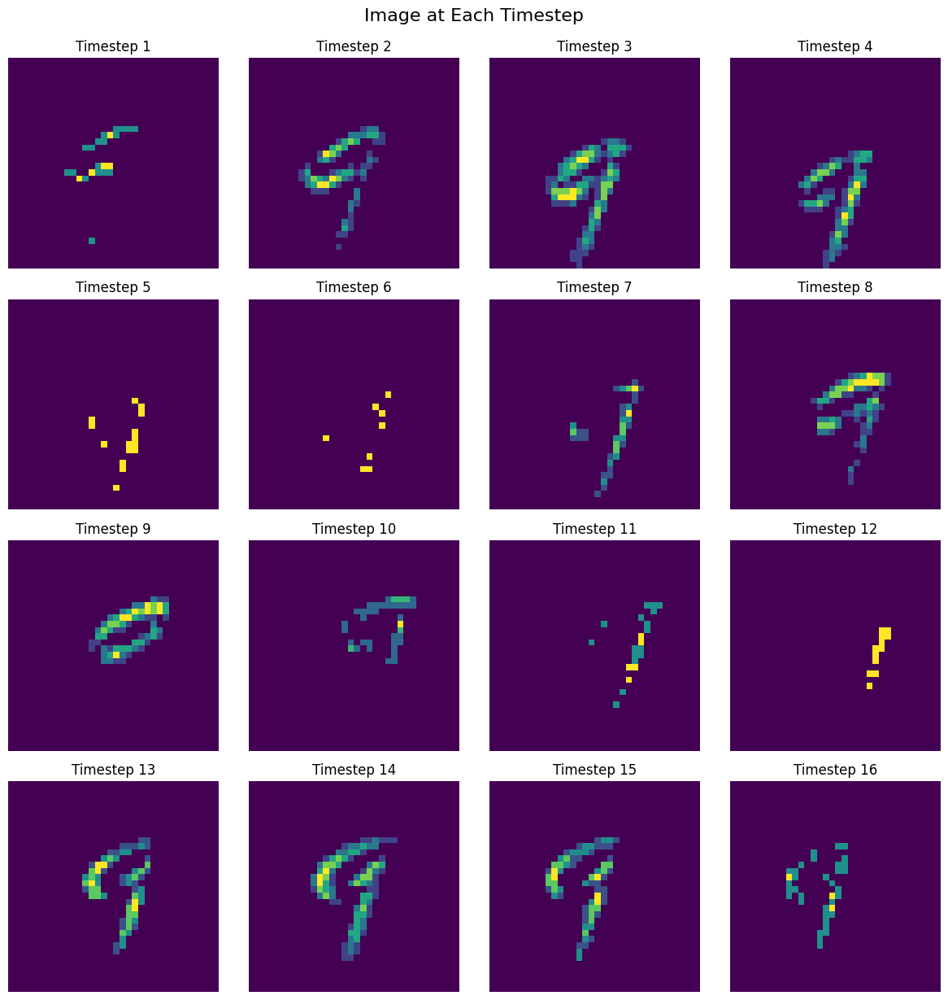

In [121]:
plot_frames_without_polarity_permuted(s[2][0])

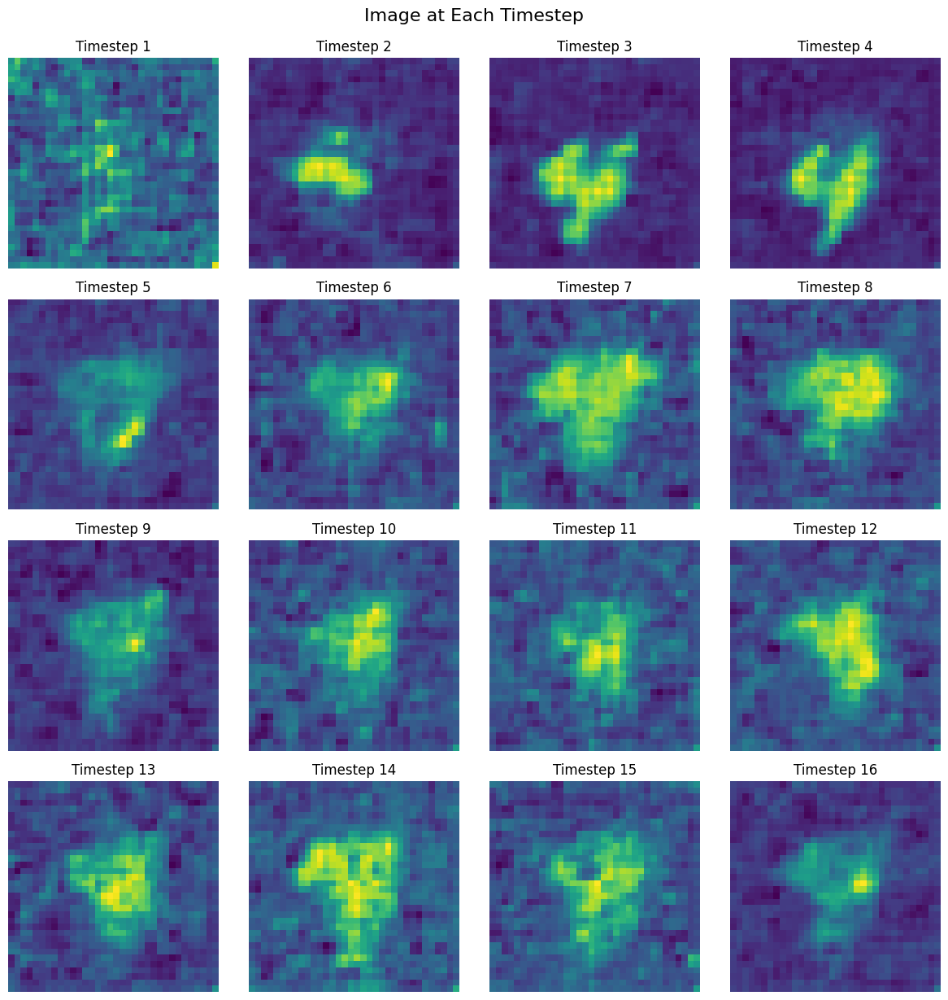

In [122]:
plot_frames_without_polarity_permuted(xr[2][0])

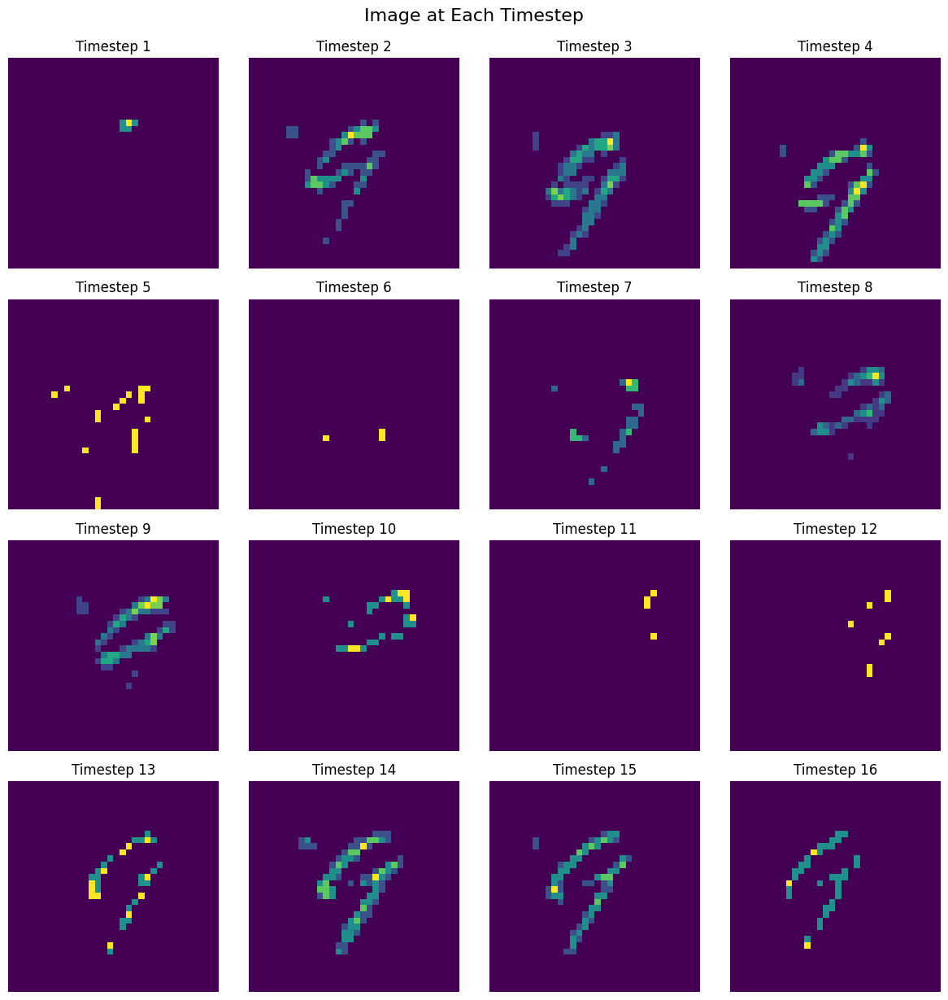

In [123]:
plot_frames_without_polarity_permuted(s[8][0])

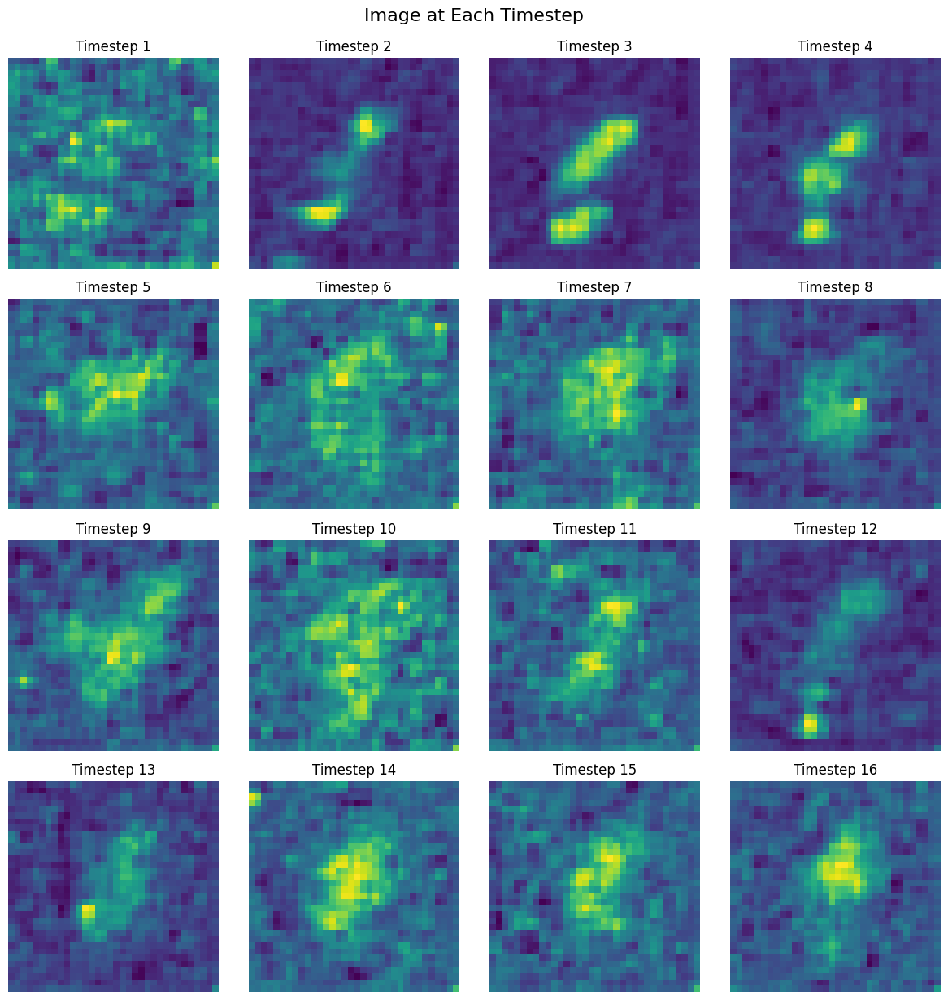

In [124]:
plot_frames_without_polarity_permuted(xr[8][0])

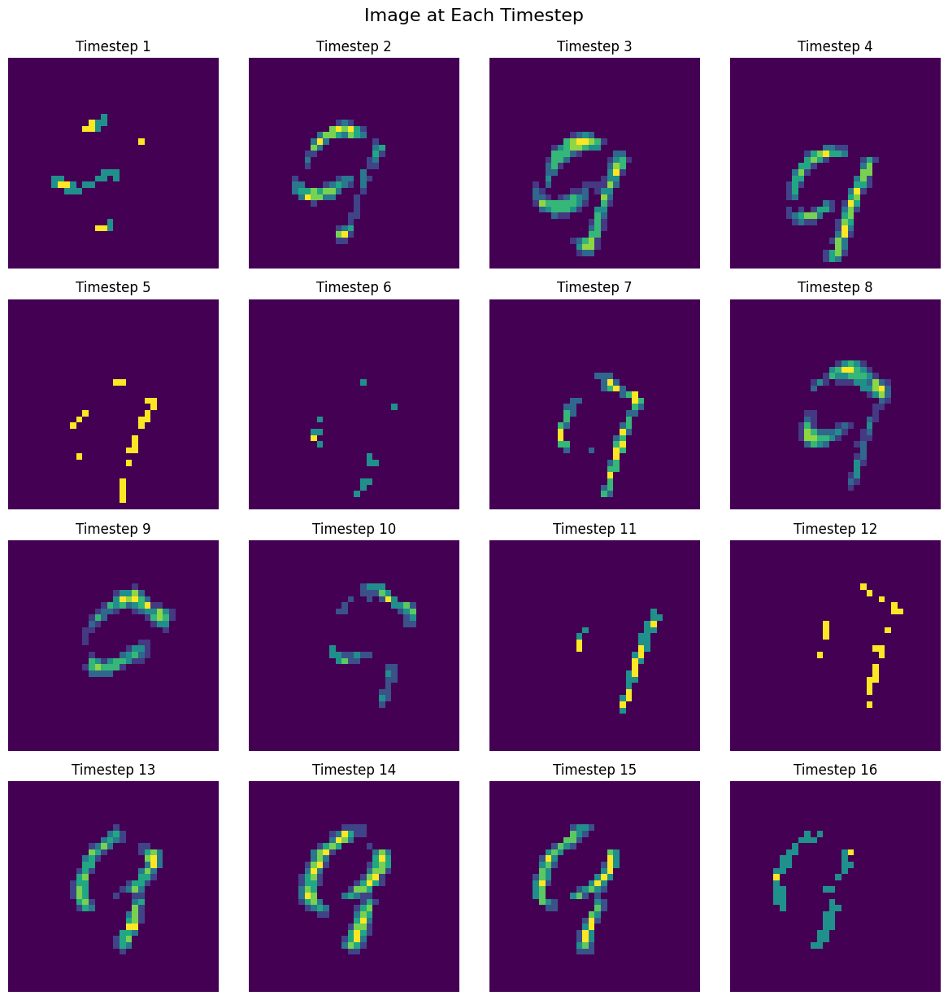

In [125]:
plot_frames_without_polarity_permuted(s[12][0])

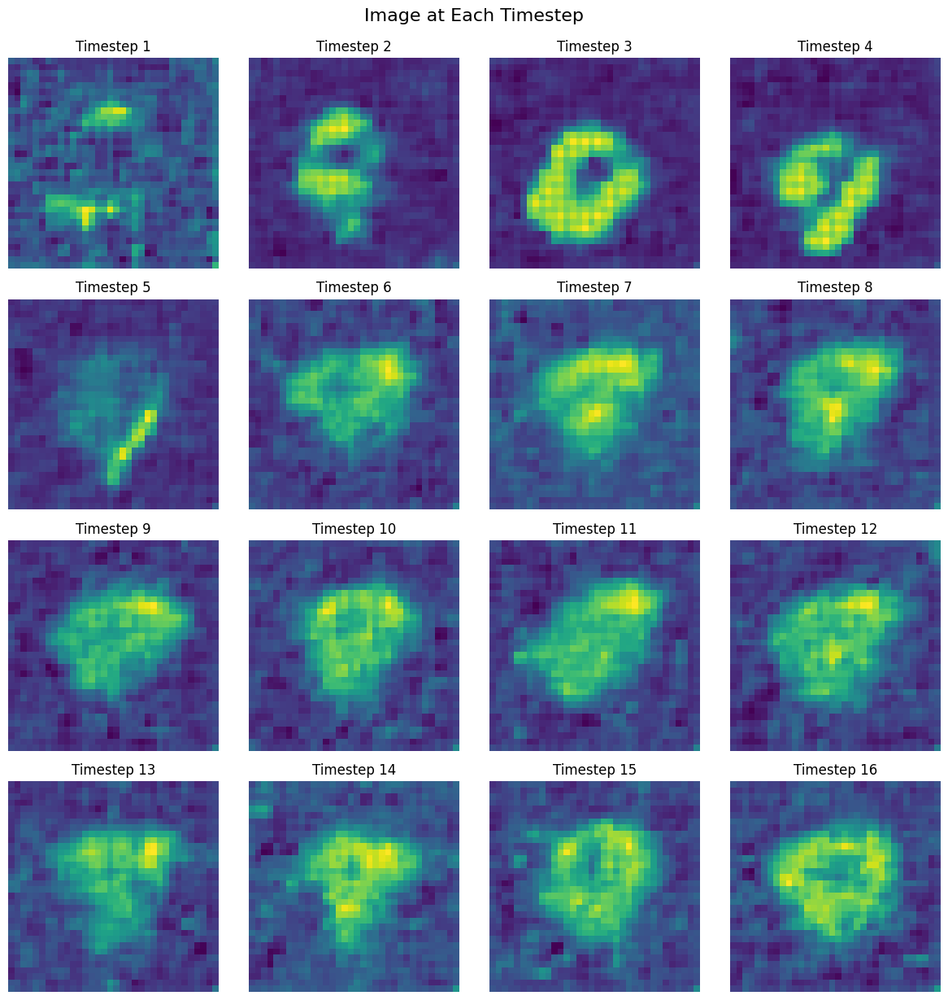

In [126]:
plot_frames_without_polarity_permuted(xr[12][0])

update p
------------------------------------Original Image---------------------------------------------


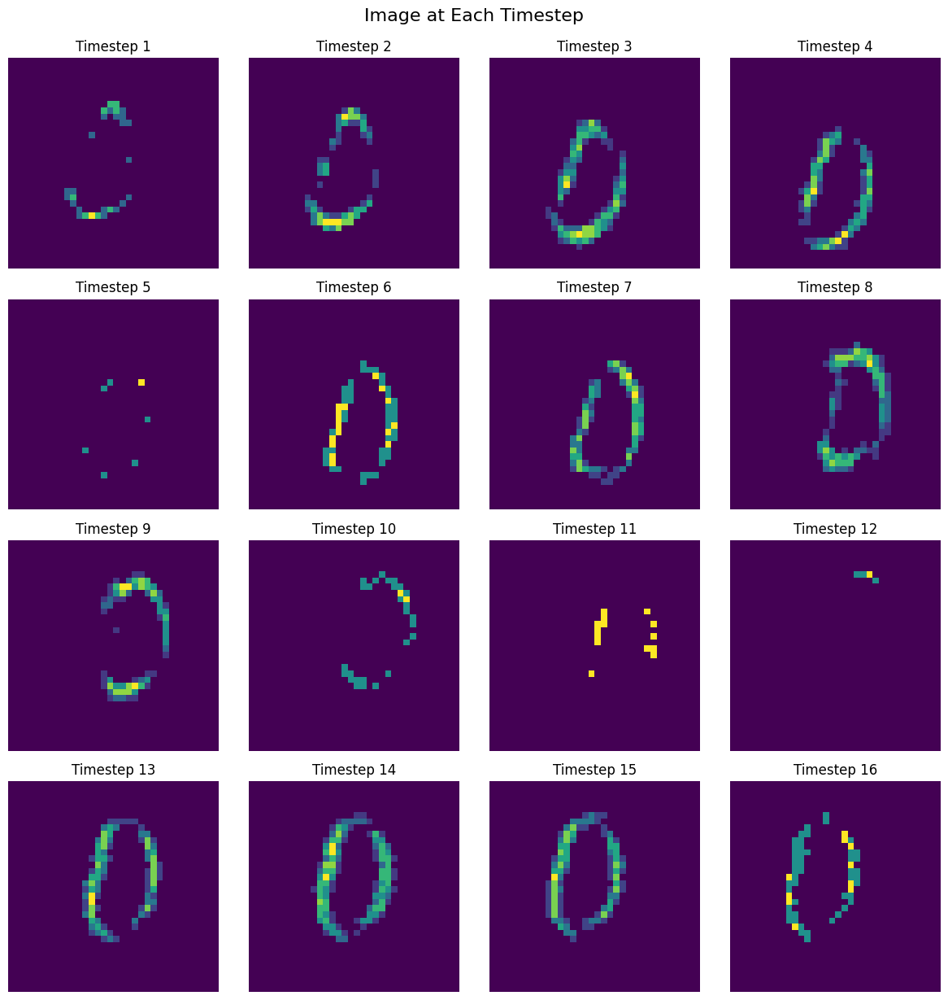

------------------------------------Recon Image---------------------------------------------


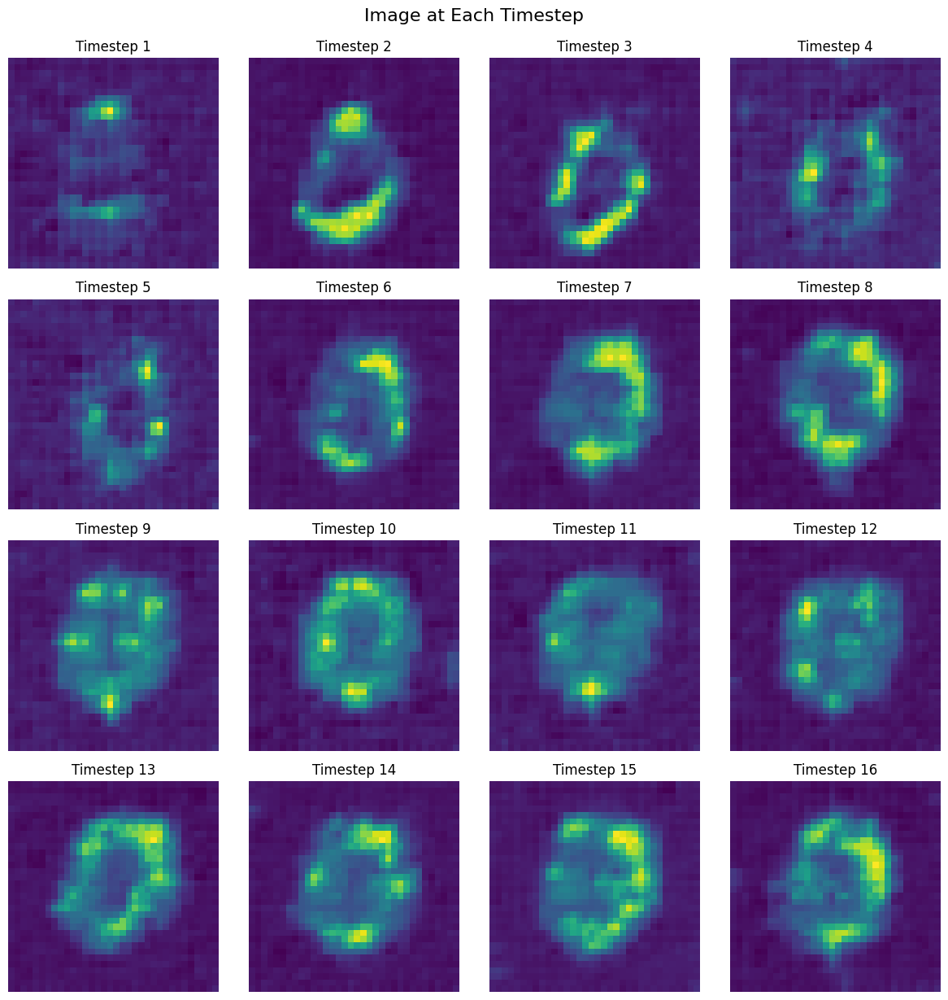

------------------------------------Original Image---------------------------------------------


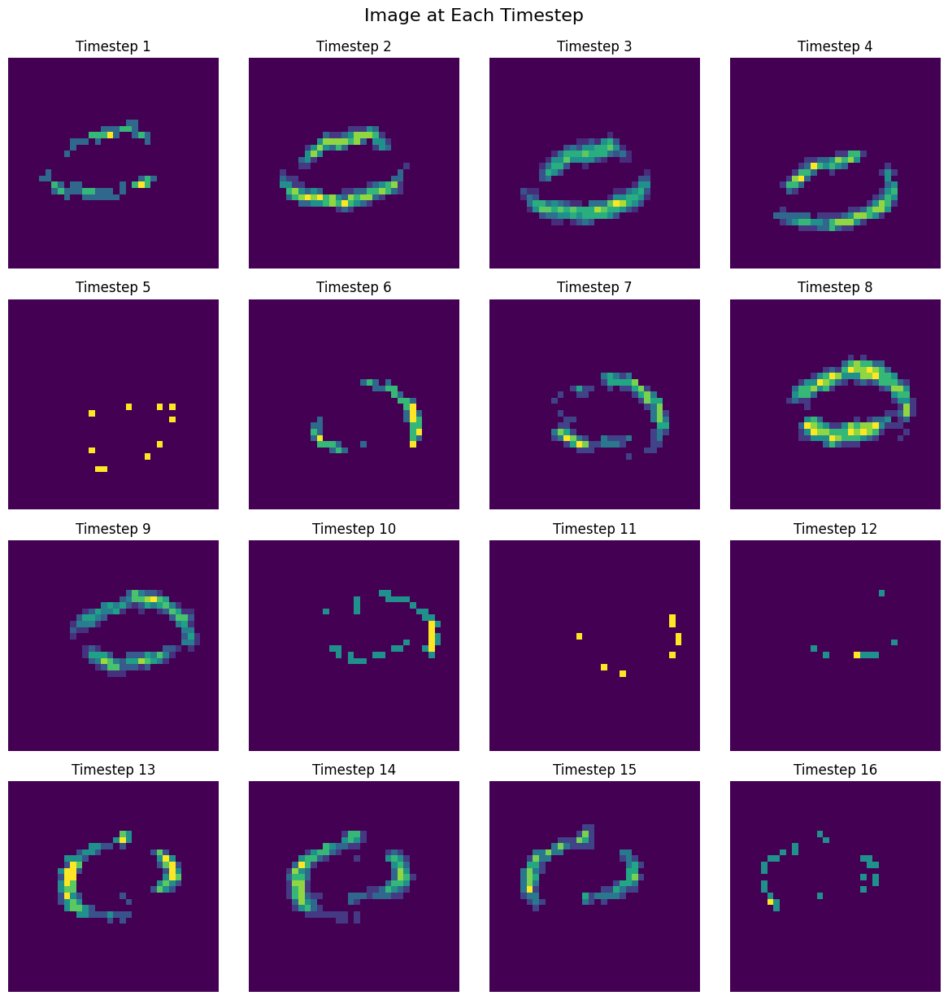

------------------------------------Recon Image---------------------------------------------


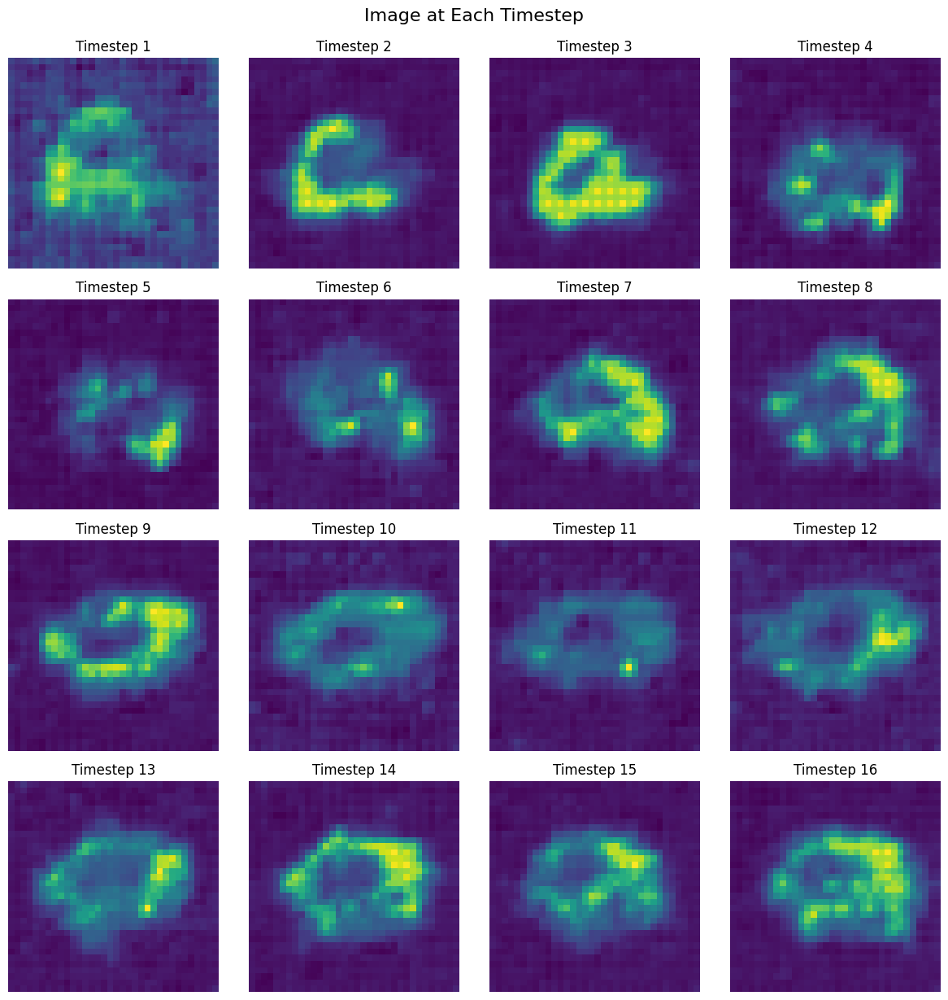

------------------------------------Original Image---------------------------------------------


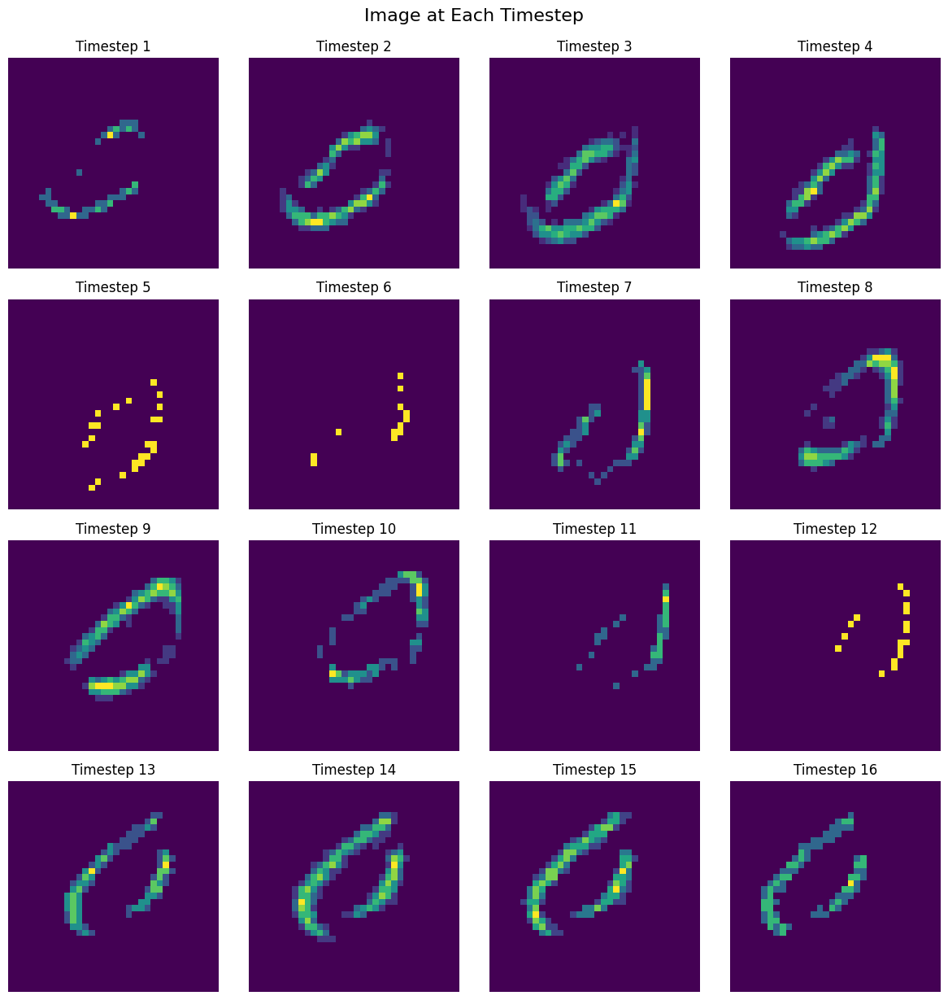

------------------------------------Recon Image---------------------------------------------


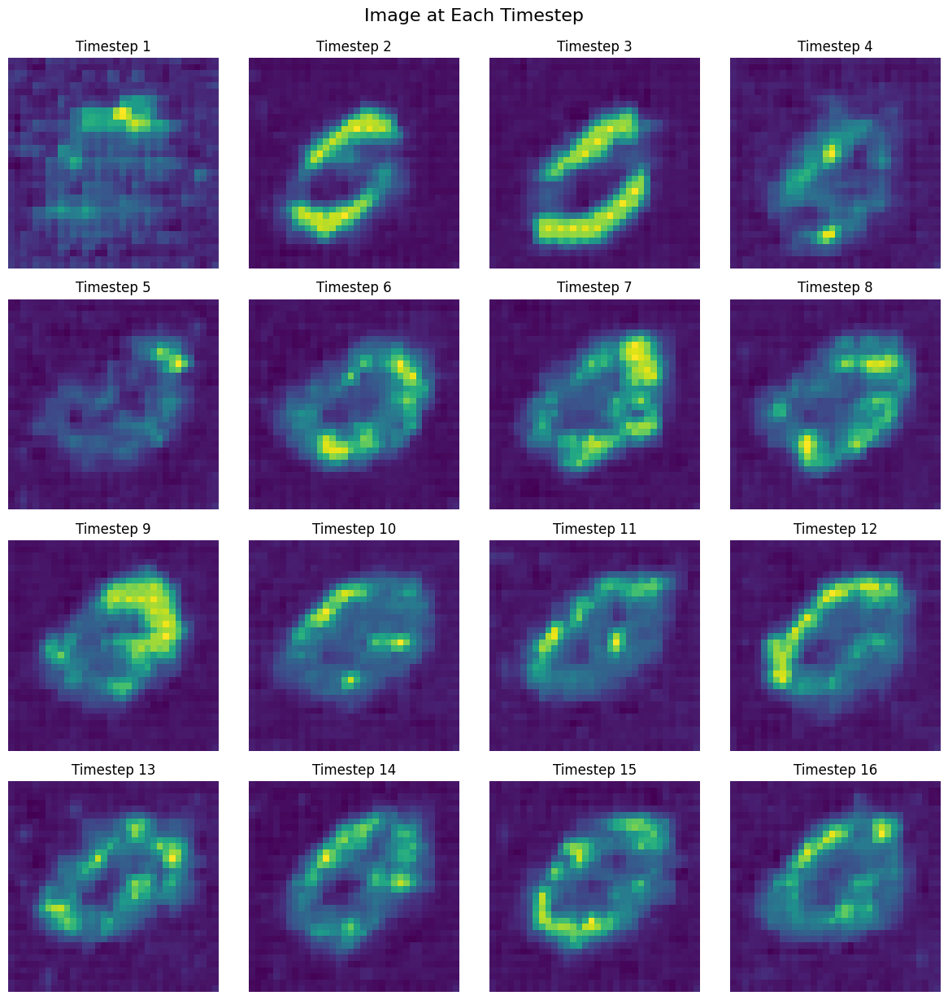

------------------------------------Original Image---------------------------------------------


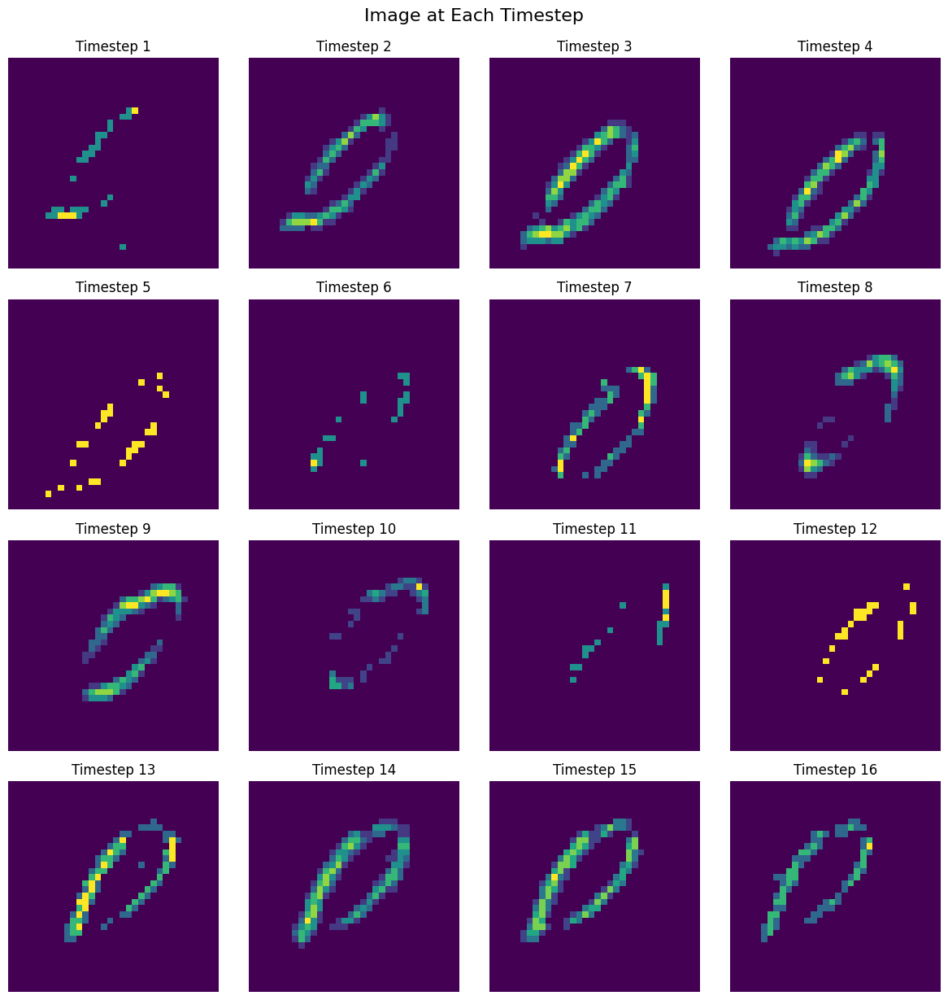

------------------------------------Recon Image---------------------------------------------


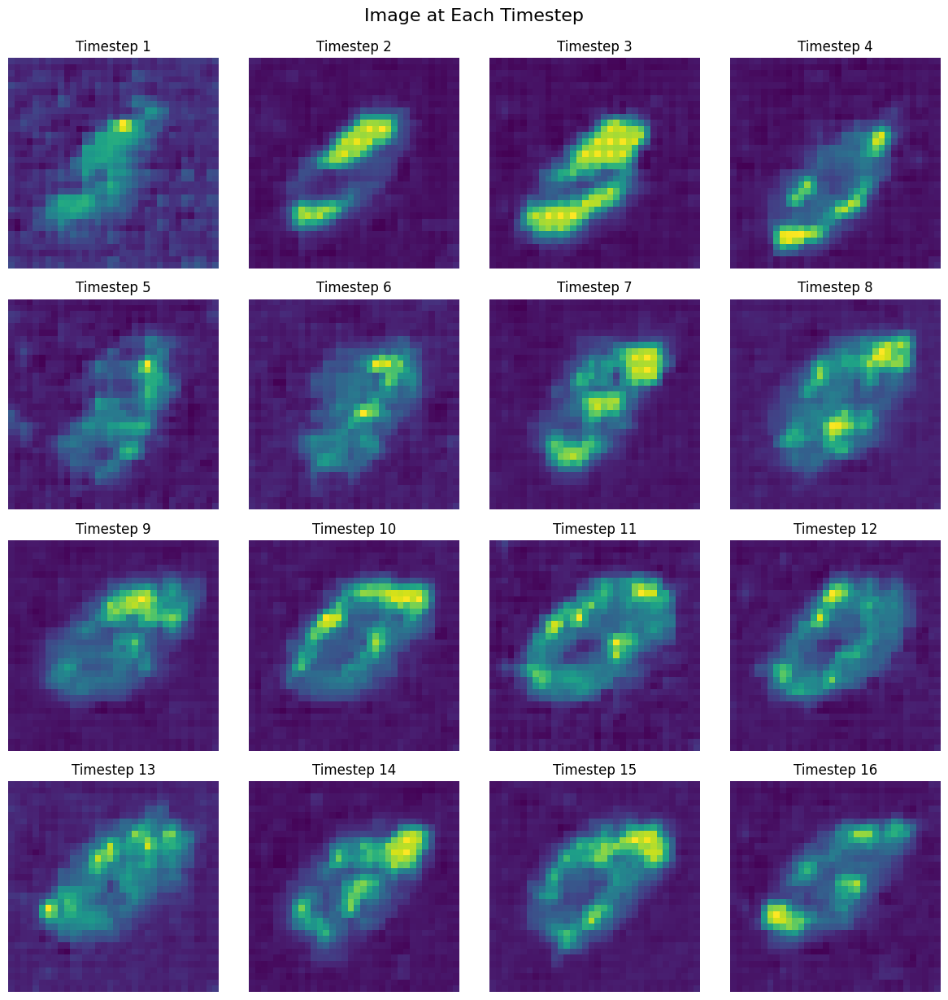

------------------------------------Original Image---------------------------------------------


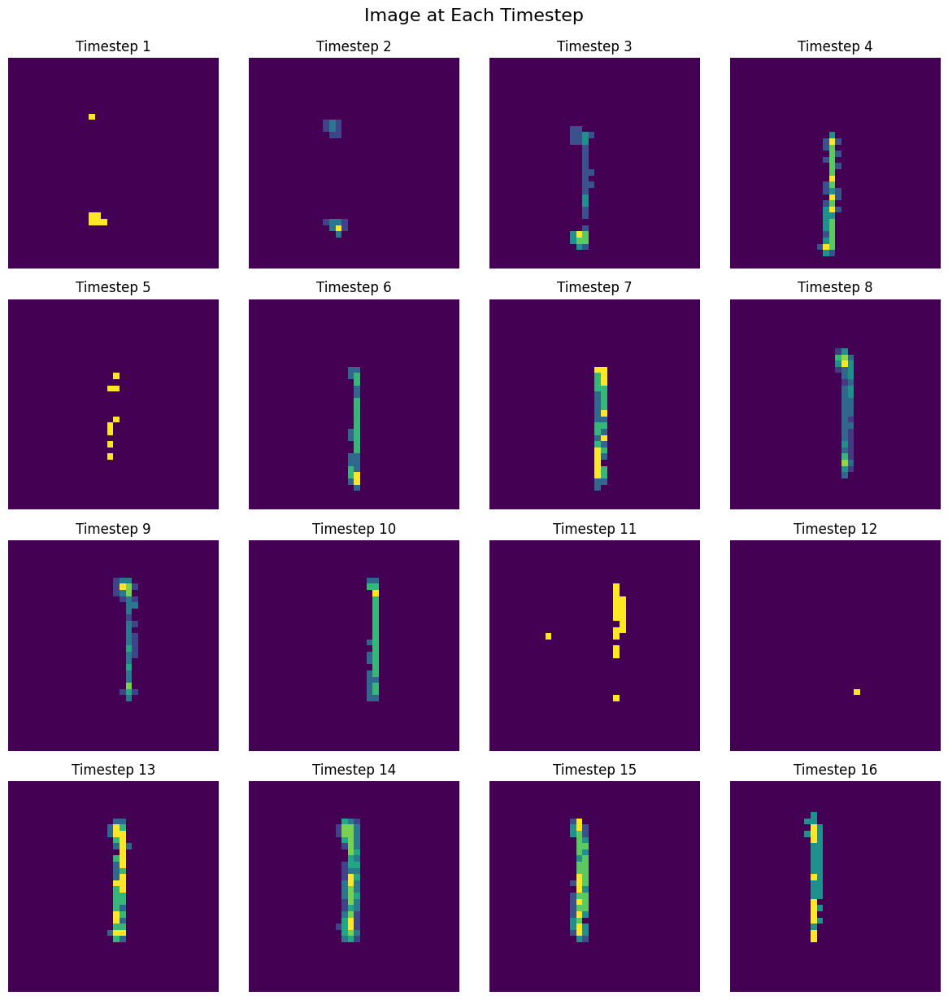

------------------------------------Recon Image---------------------------------------------


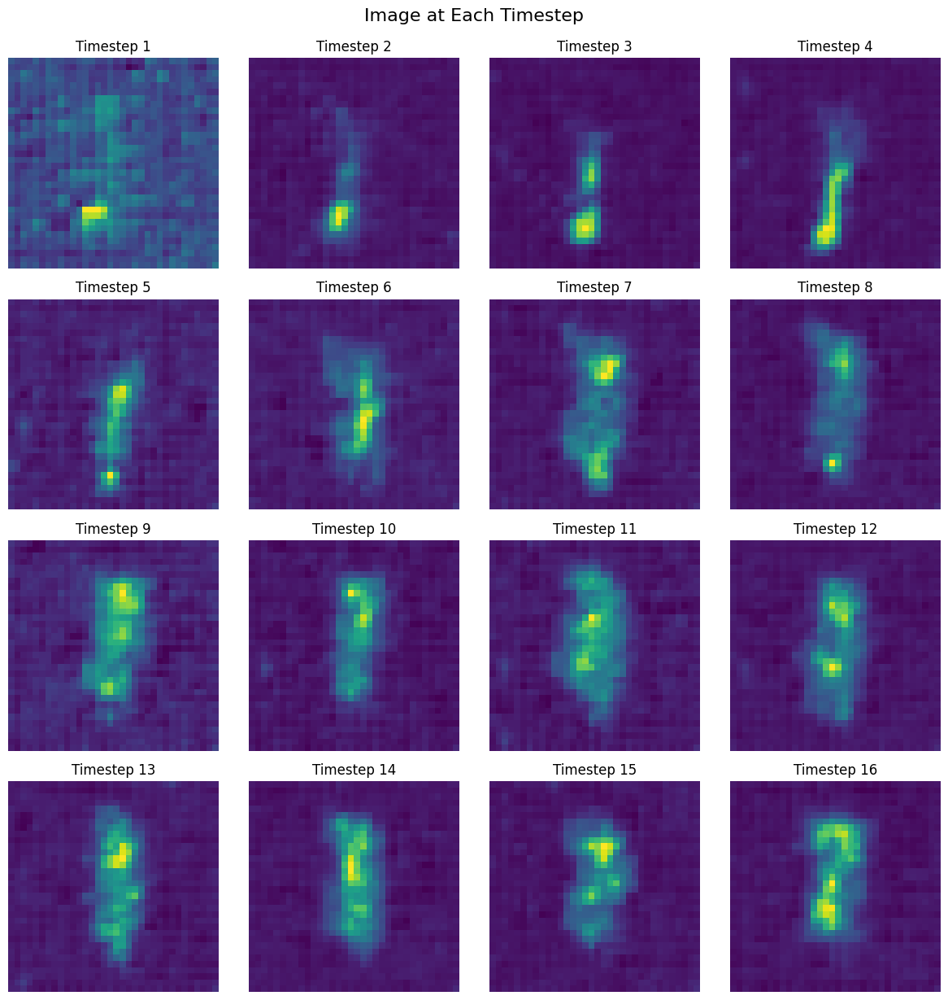

------------------------------------Original Image---------------------------------------------


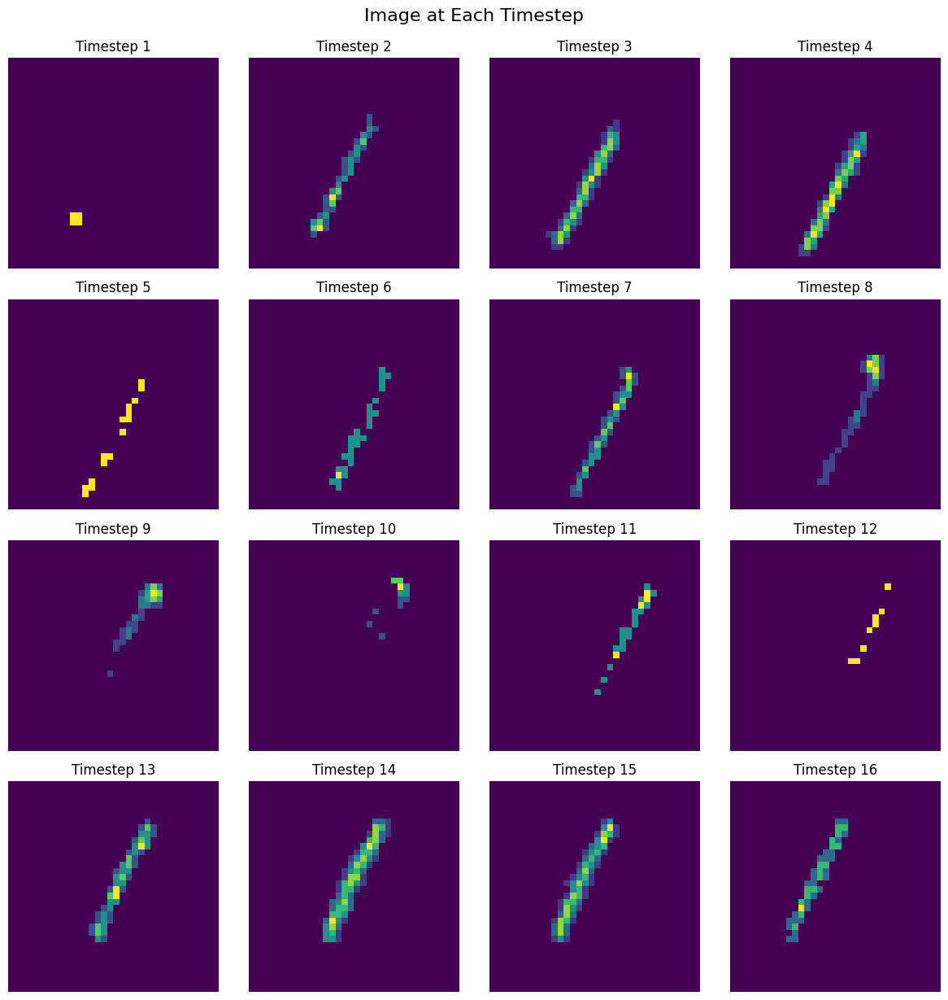

------------------------------------Recon Image---------------------------------------------


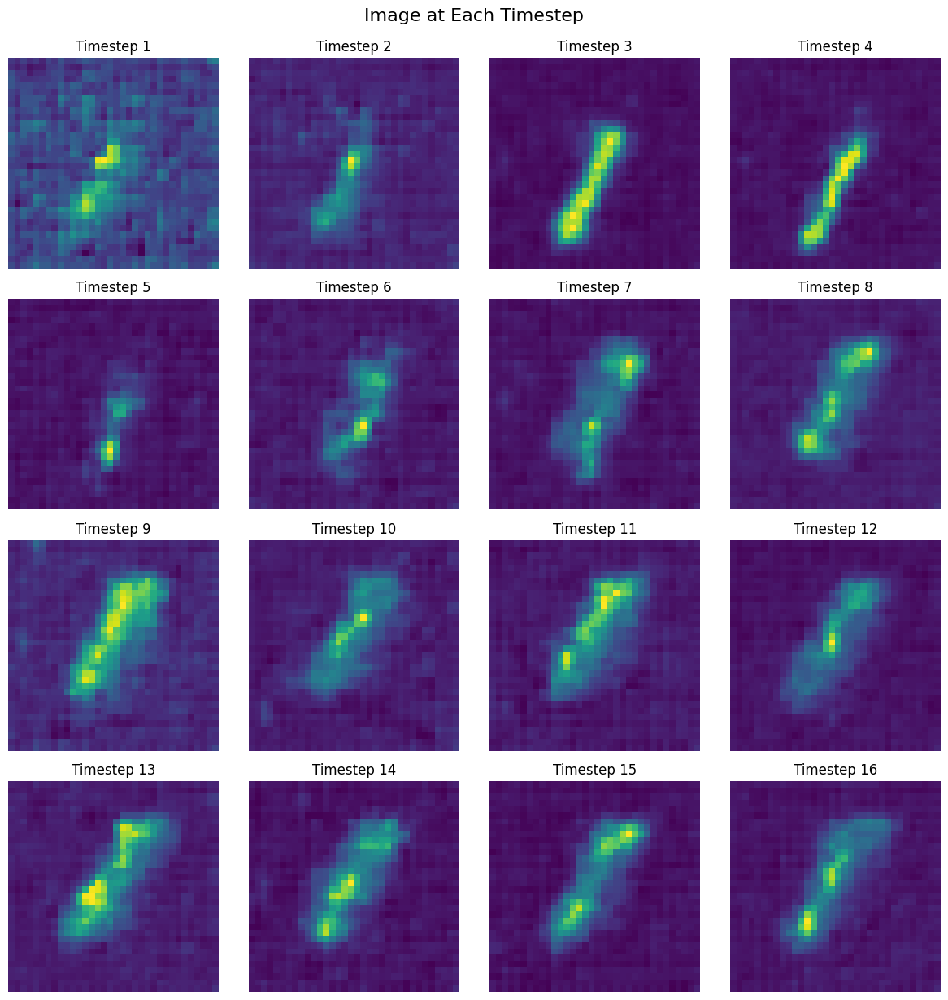

------------------------------------Original Image---------------------------------------------


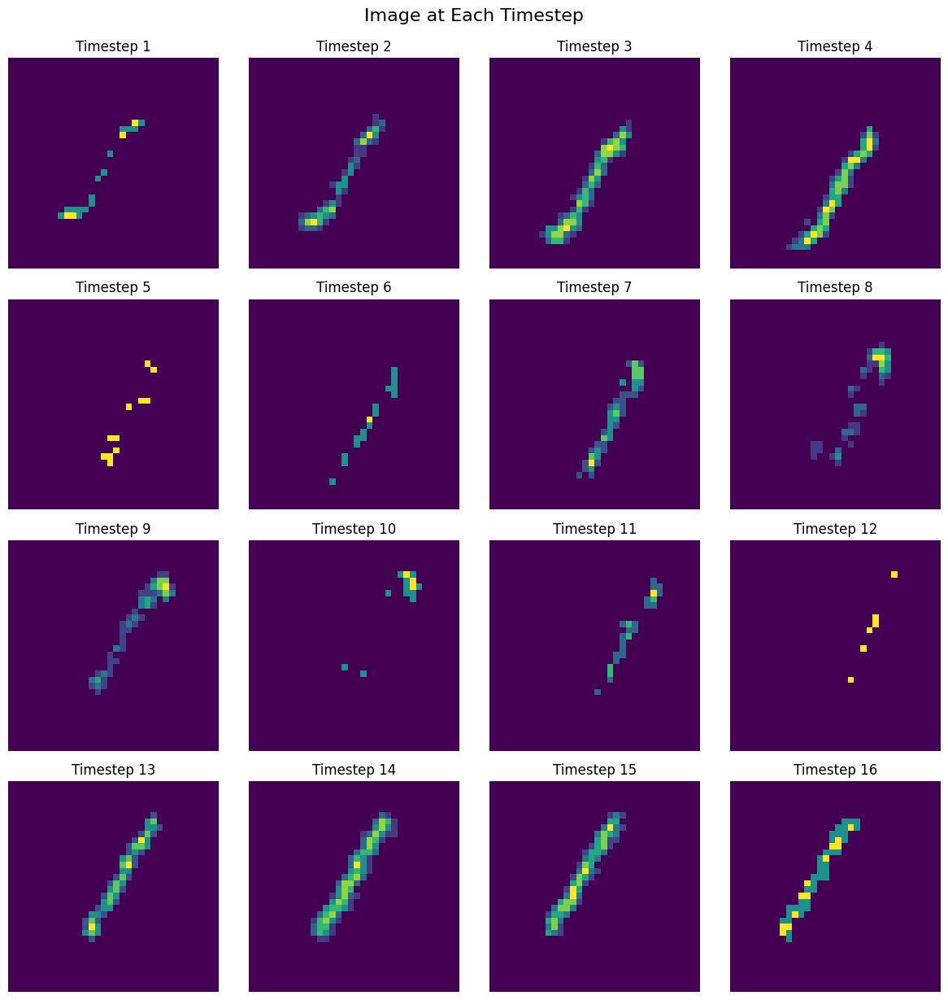

------------------------------------Recon Image---------------------------------------------


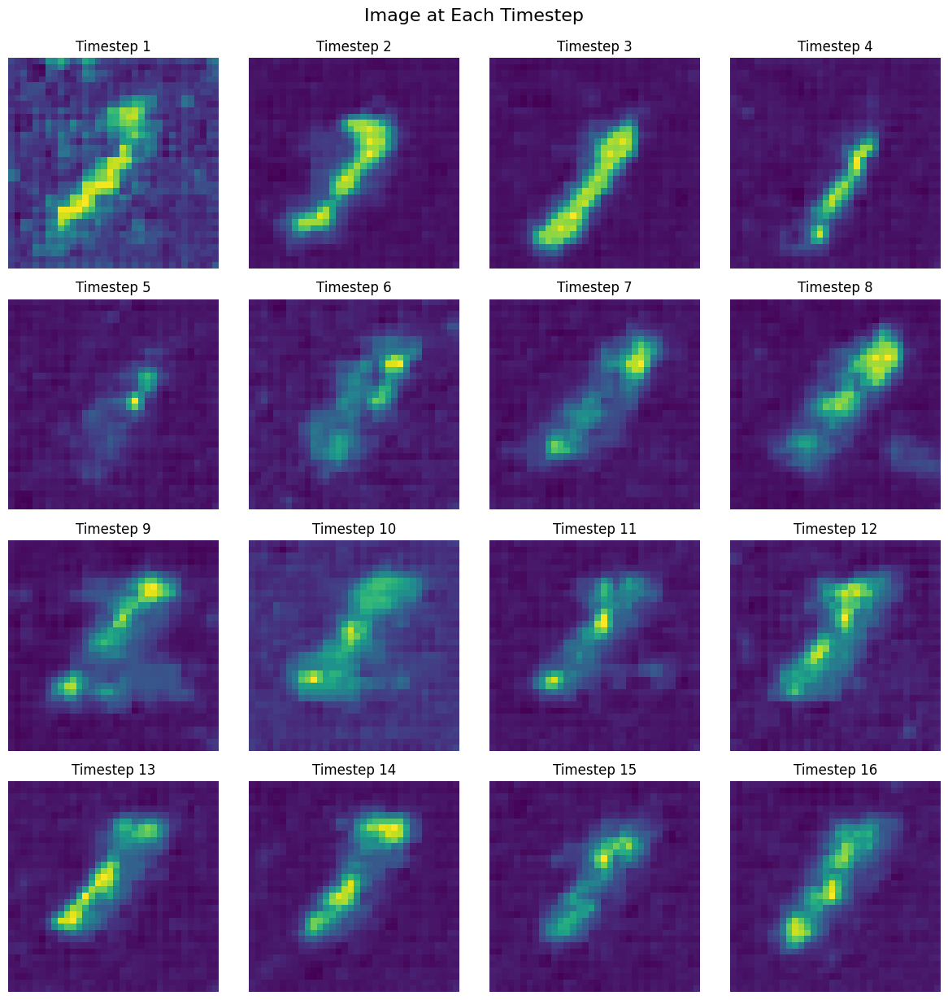

------------------------------------Original Image---------------------------------------------


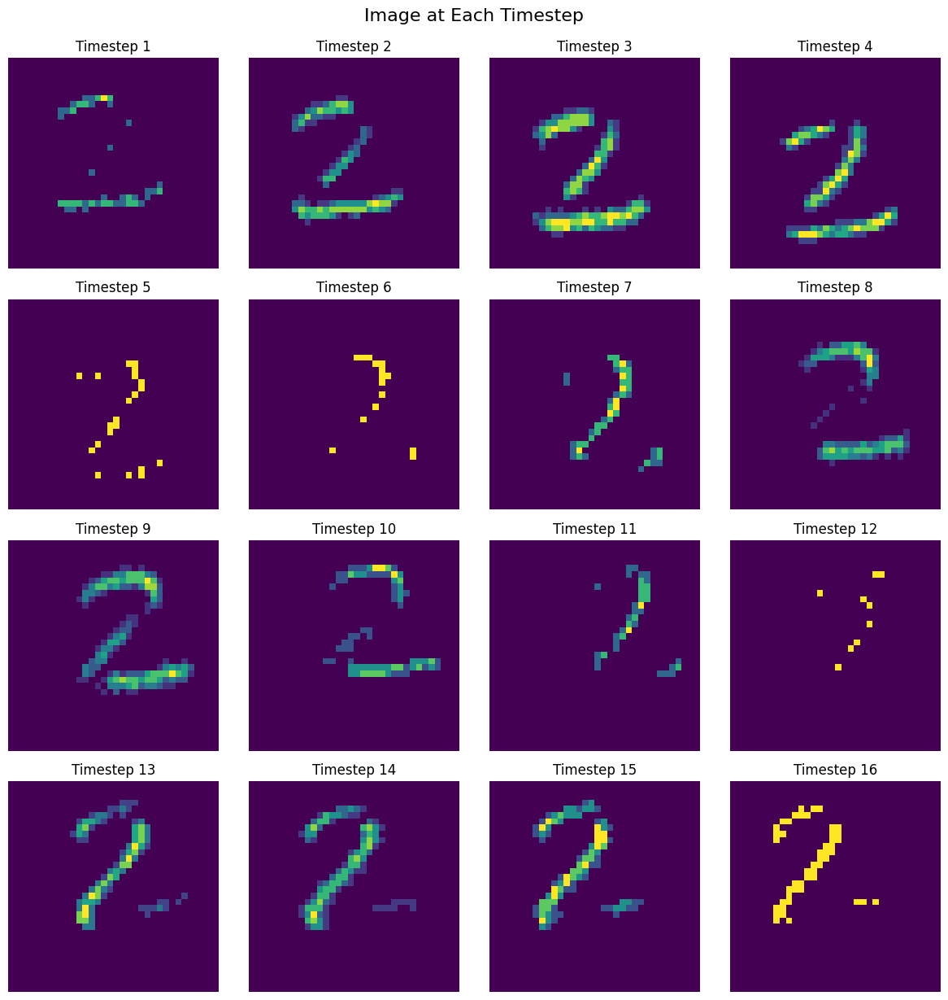

------------------------------------Recon Image---------------------------------------------


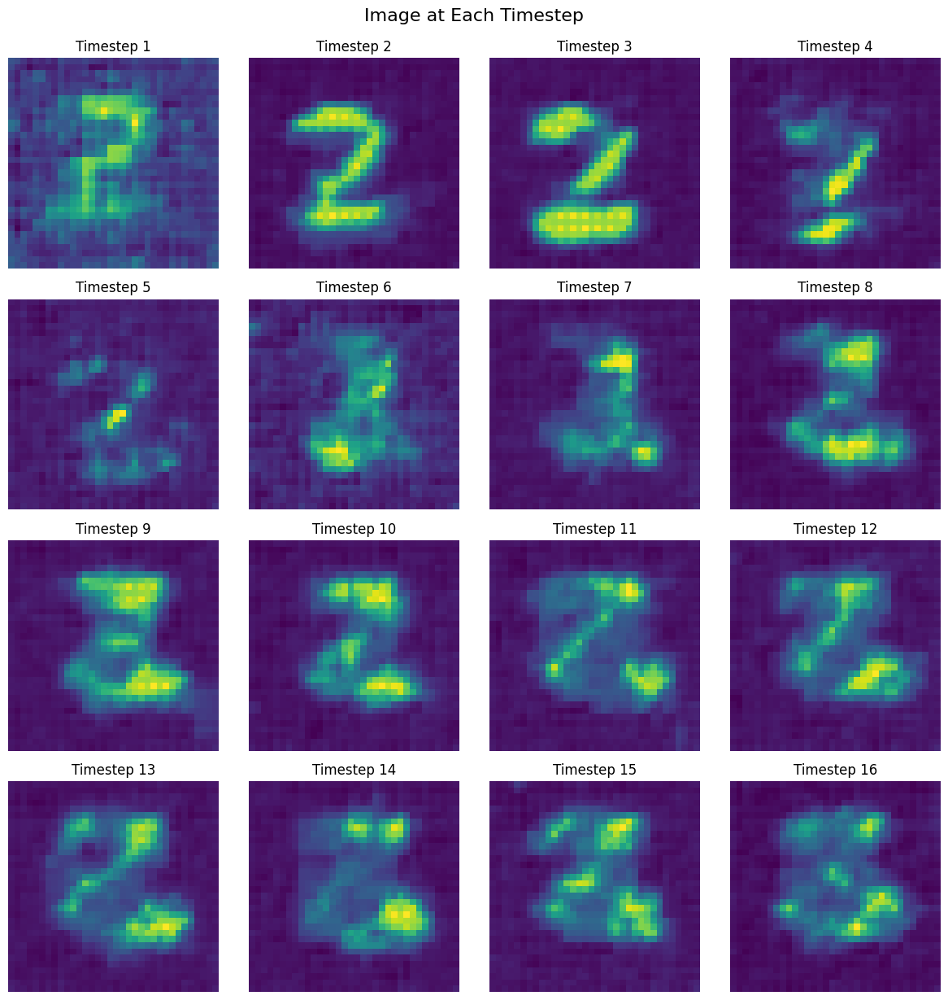

------------------------------------Original Image---------------------------------------------


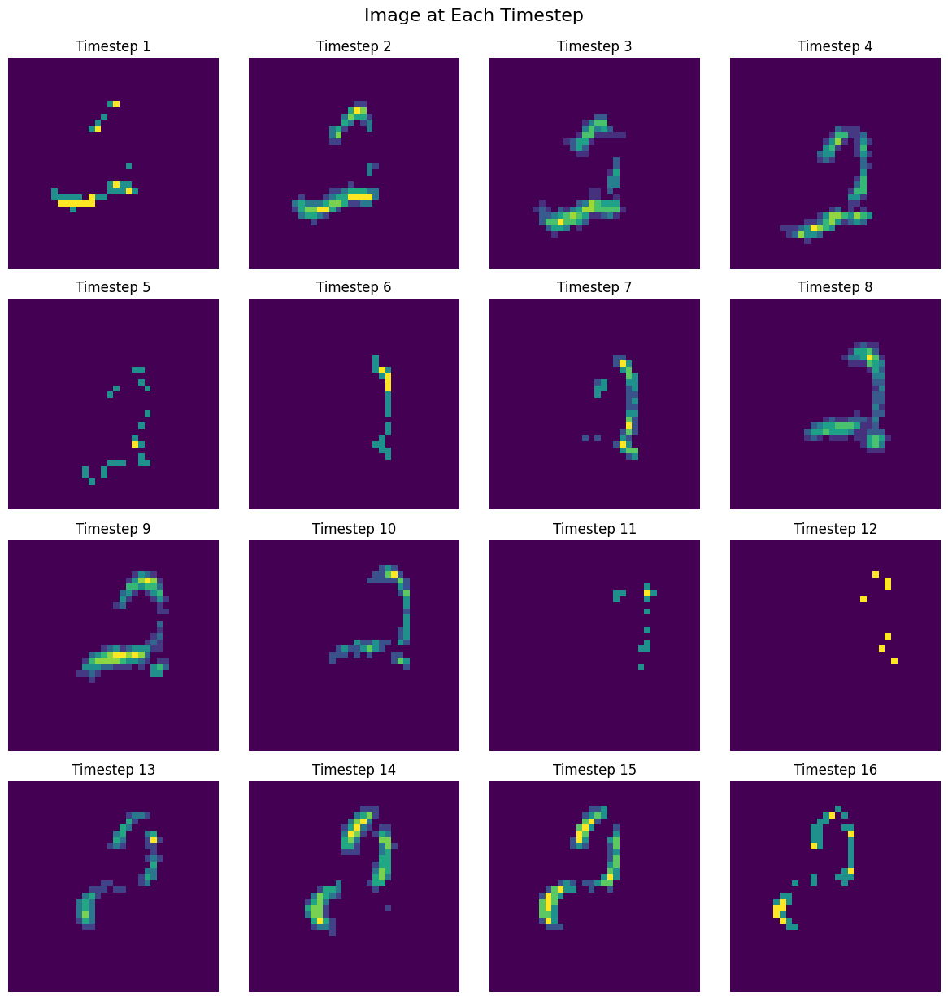

------------------------------------Recon Image---------------------------------------------


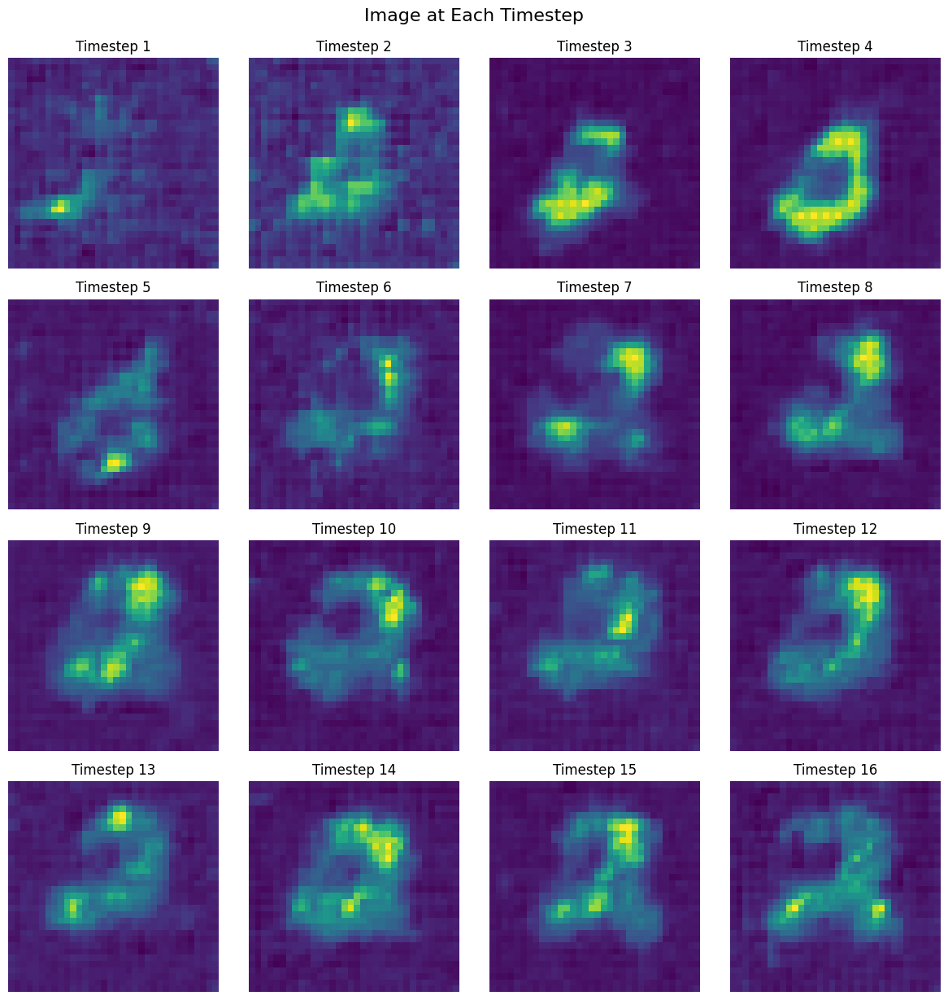

------------------------------------Original Image---------------------------------------------


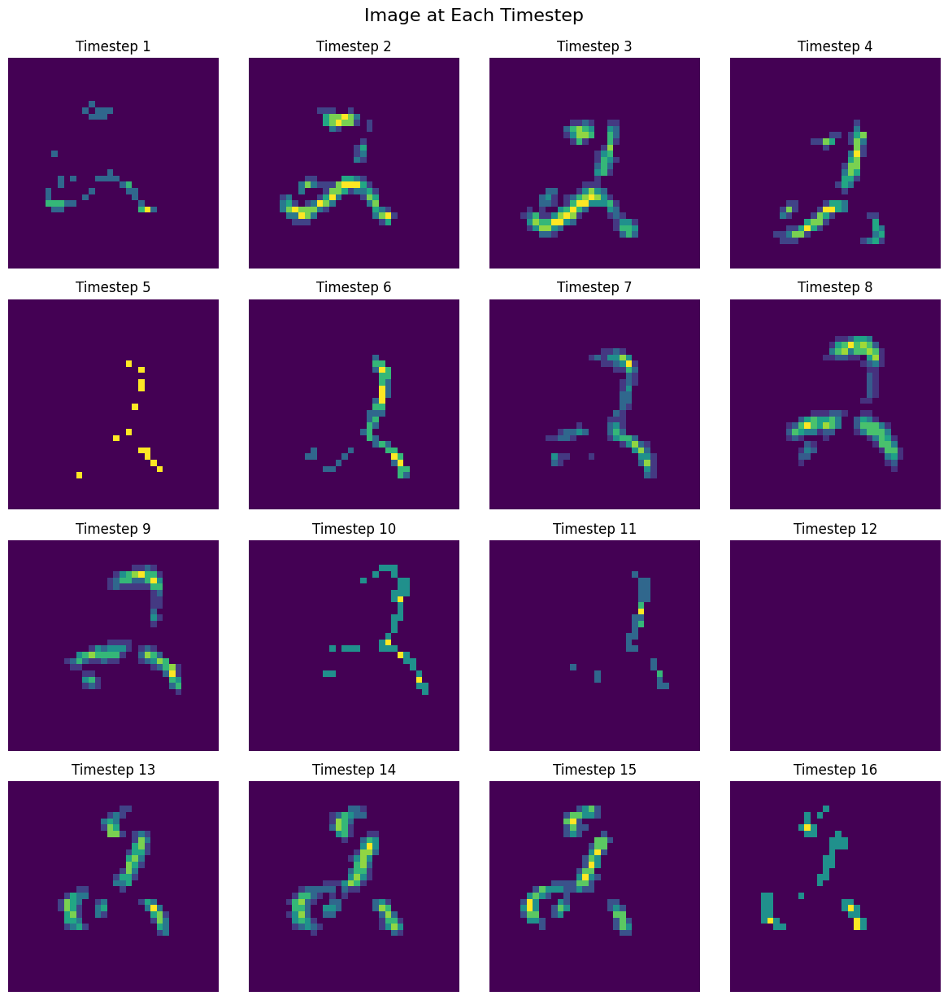

------------------------------------Recon Image---------------------------------------------


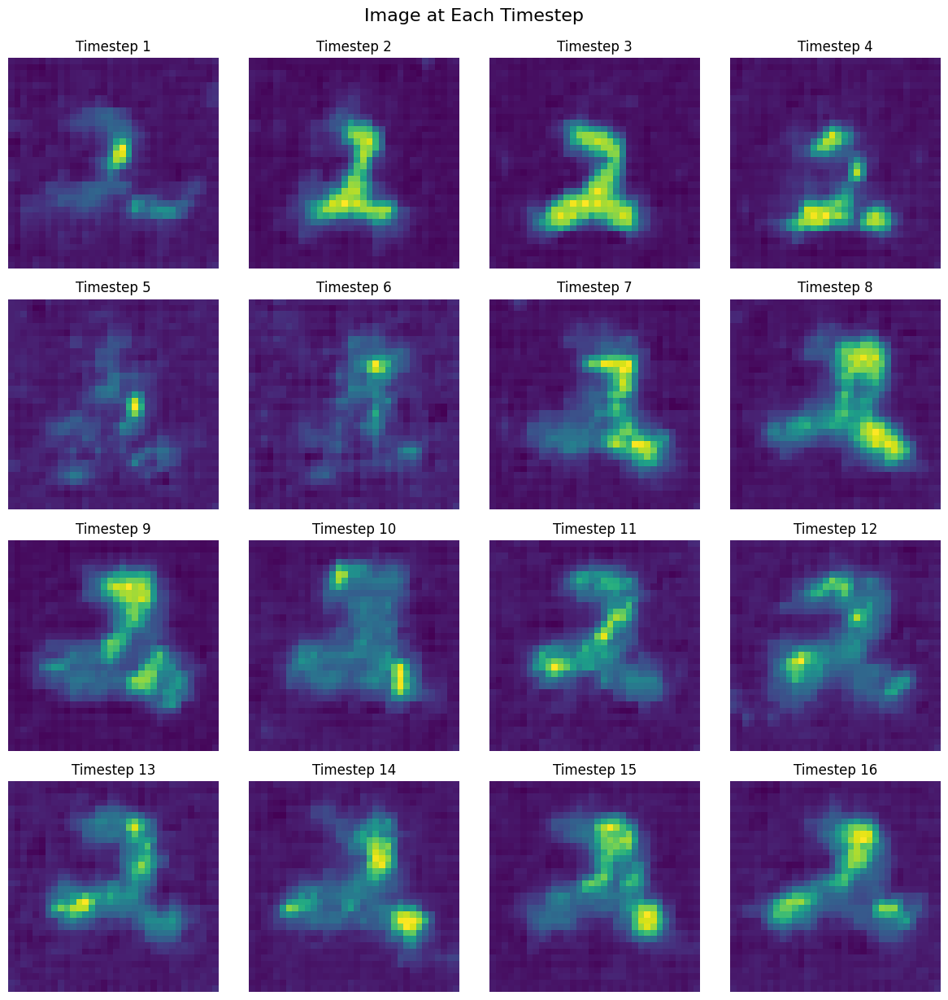

------------------------------------Original Image---------------------------------------------


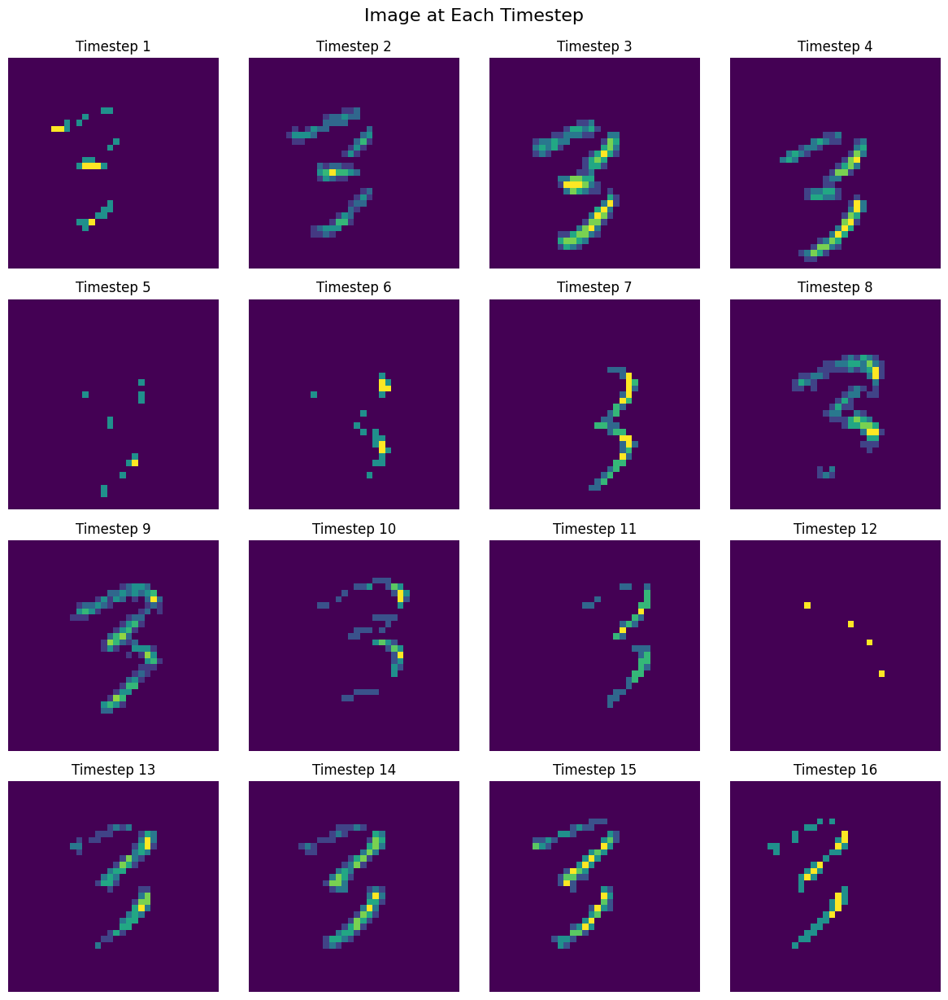

------------------------------------Recon Image---------------------------------------------


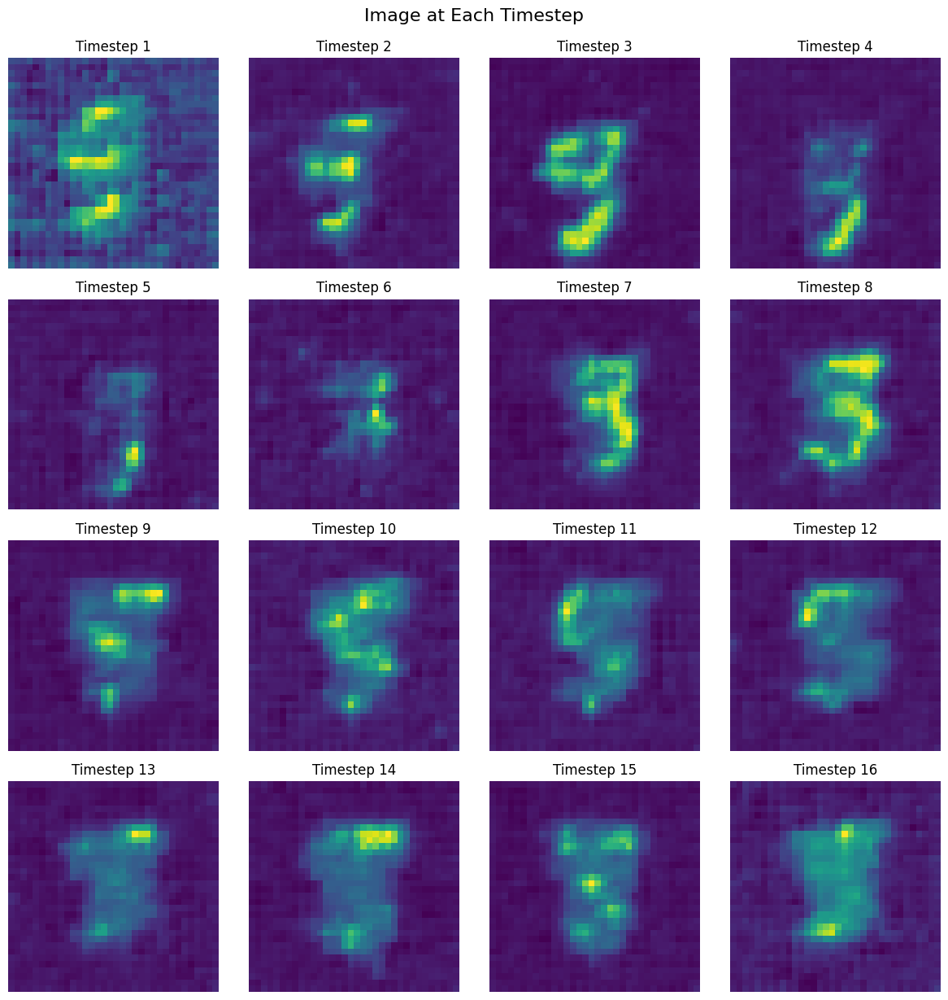

------------------------------------Original Image---------------------------------------------


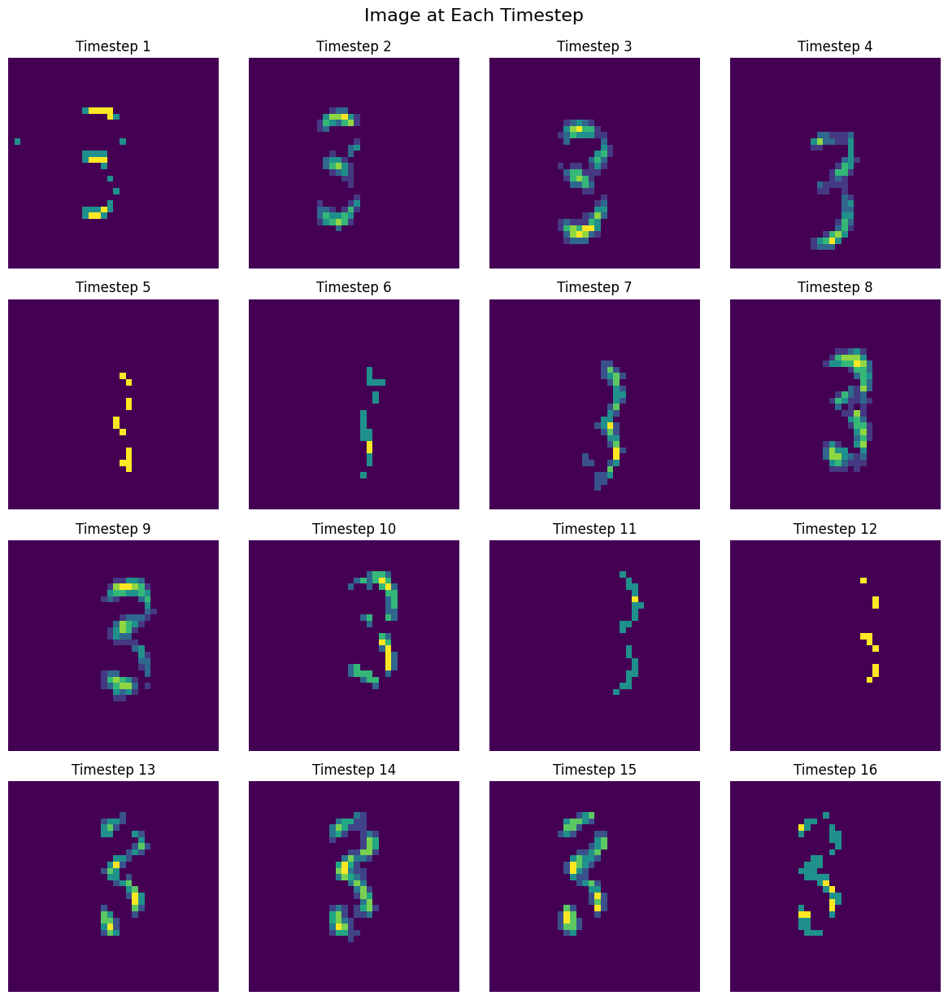

------------------------------------Recon Image---------------------------------------------


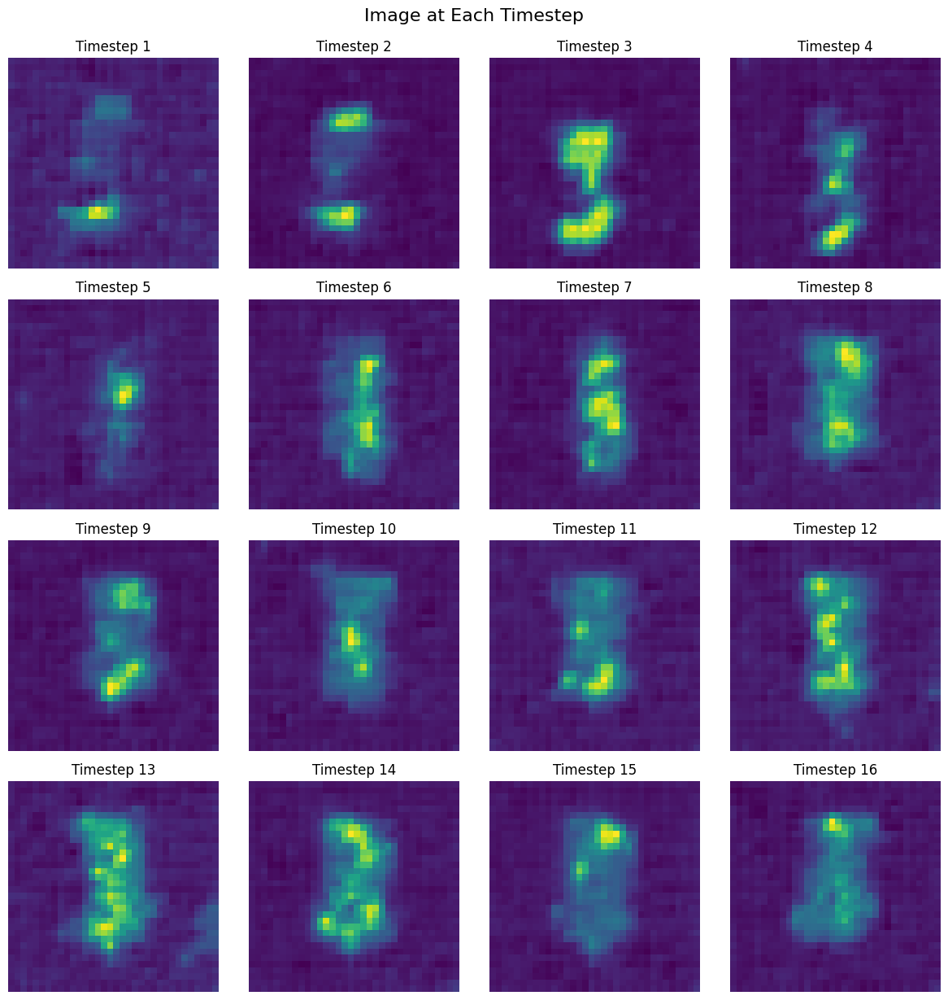

------------------------------------Original Image---------------------------------------------


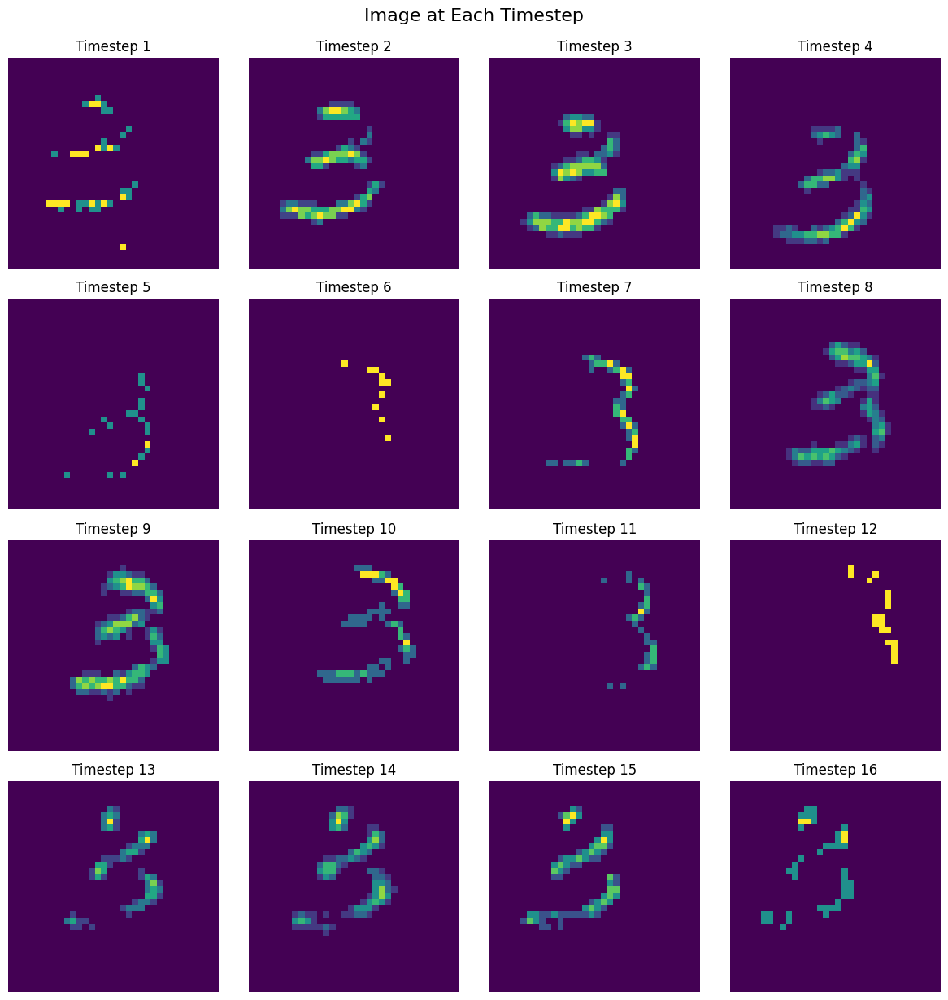

------------------------------------Recon Image---------------------------------------------


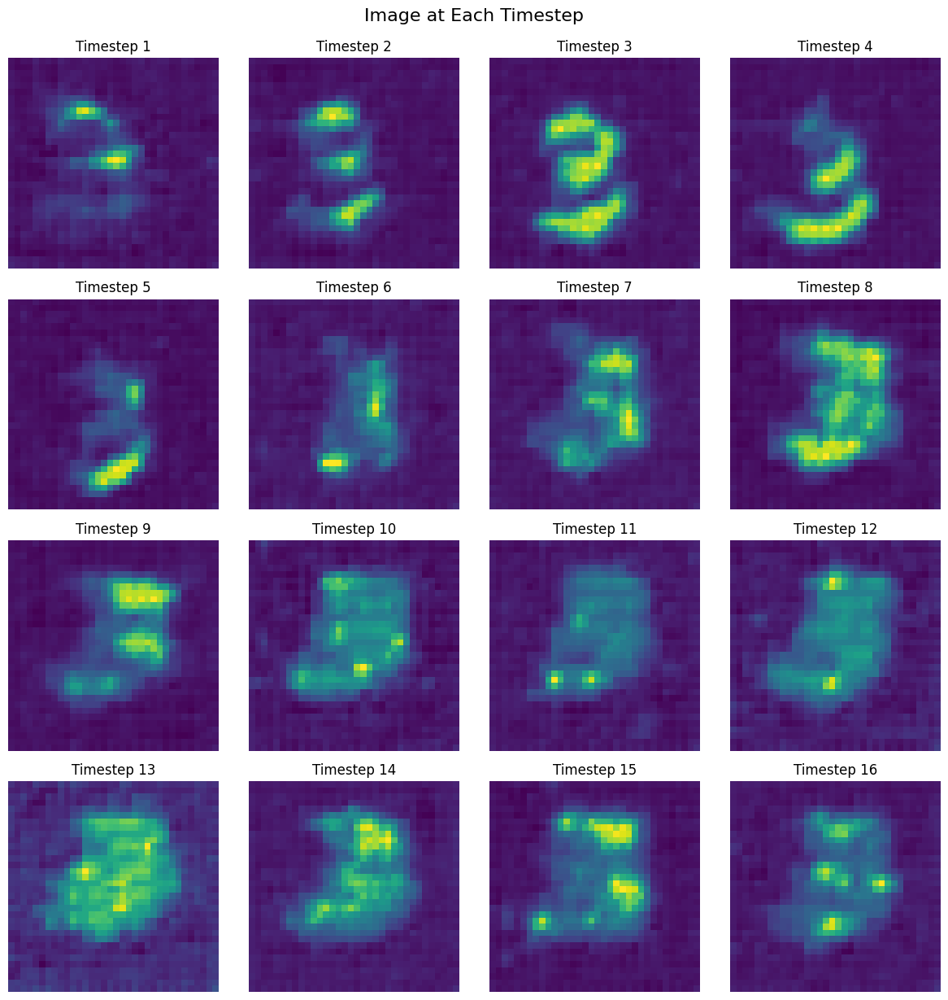

------------------------------------Original Image---------------------------------------------


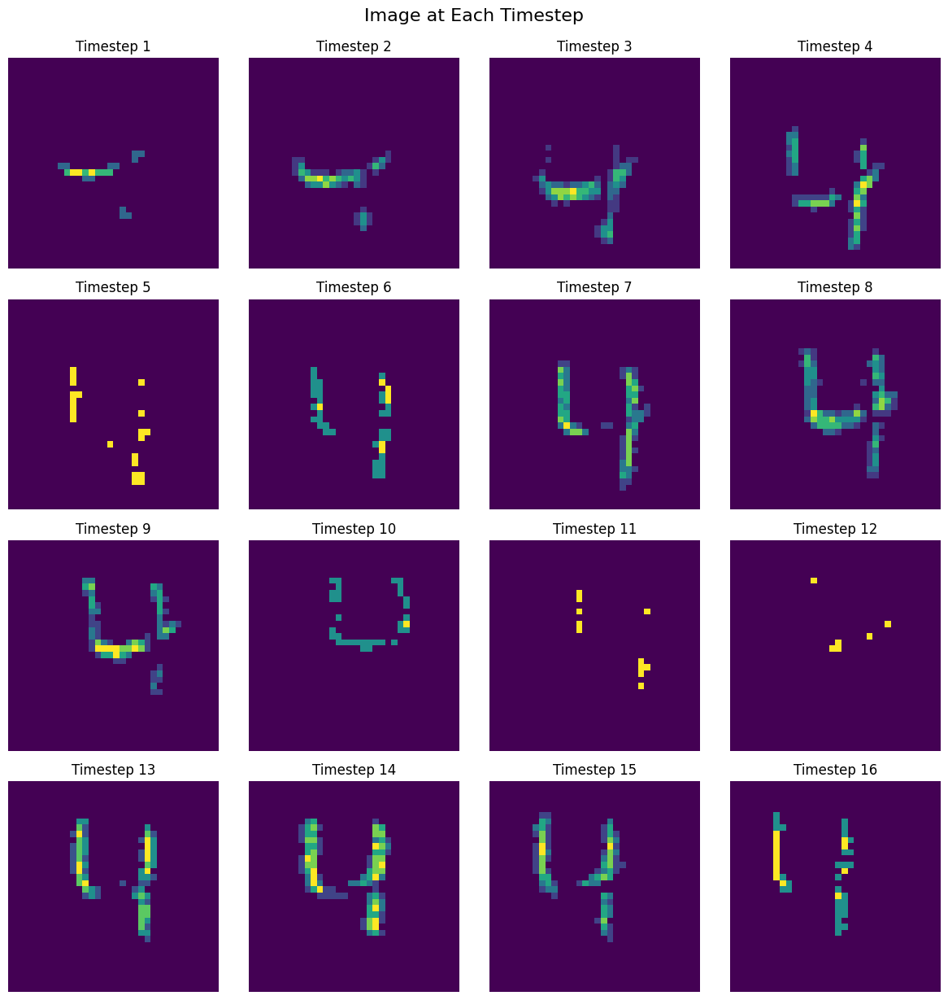

------------------------------------Recon Image---------------------------------------------


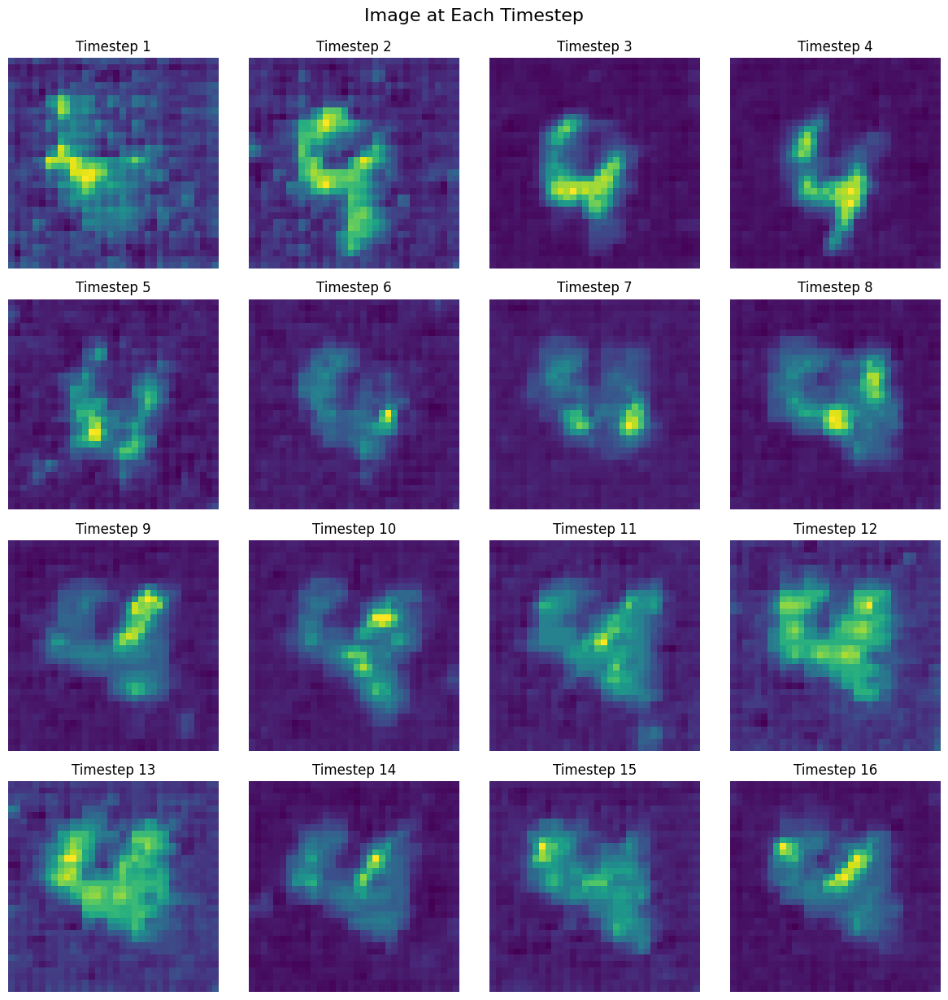

------------------------------------Original Image---------------------------------------------


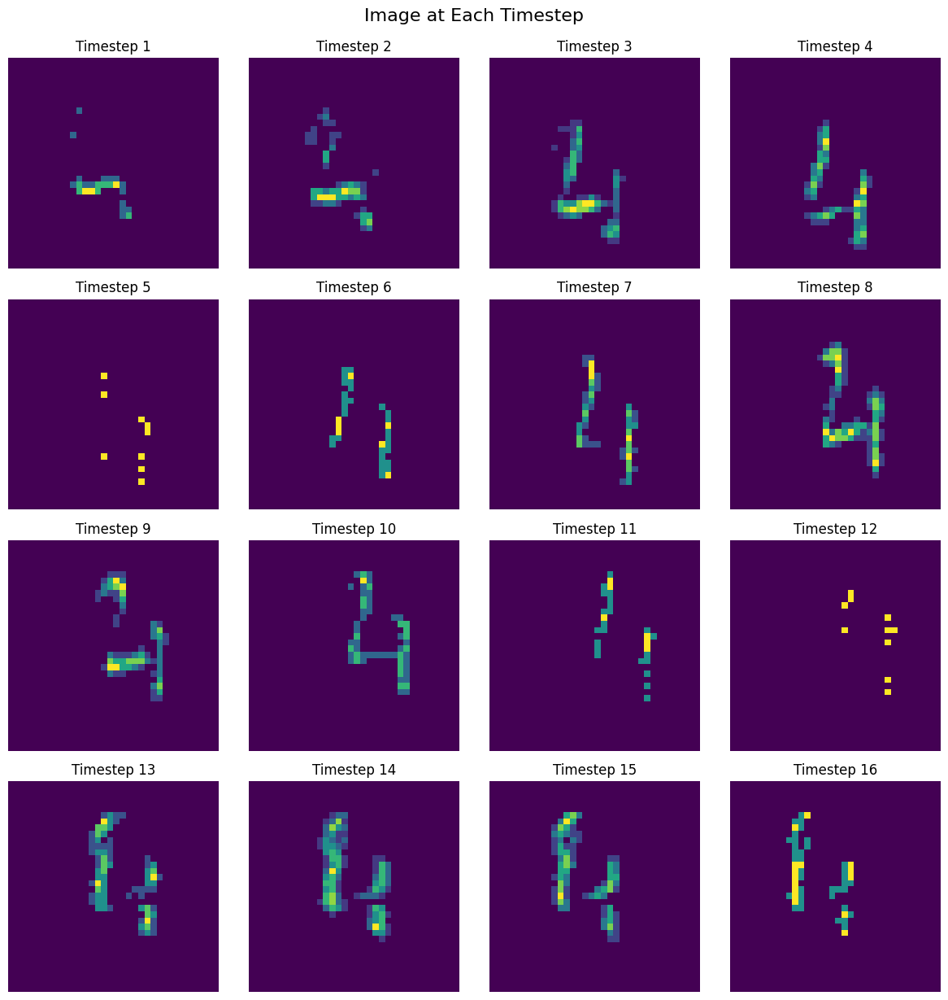

------------------------------------Recon Image---------------------------------------------


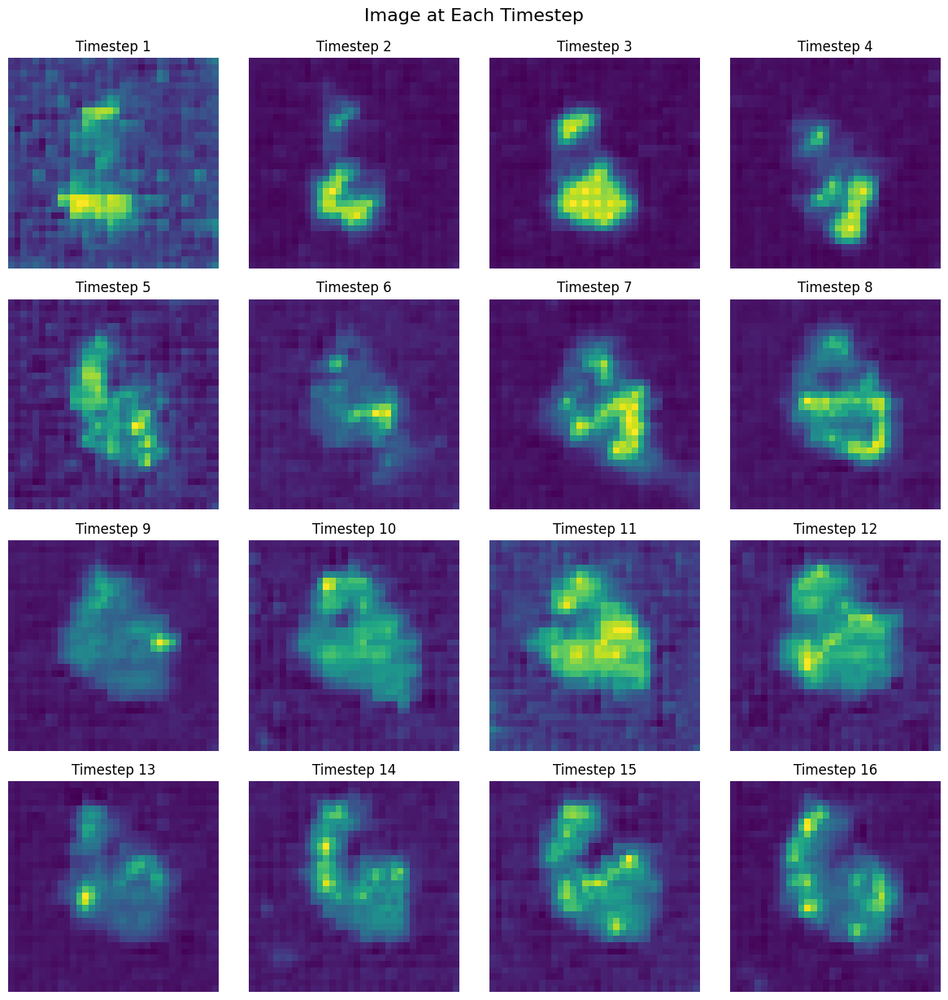

------------------------------------Original Image---------------------------------------------


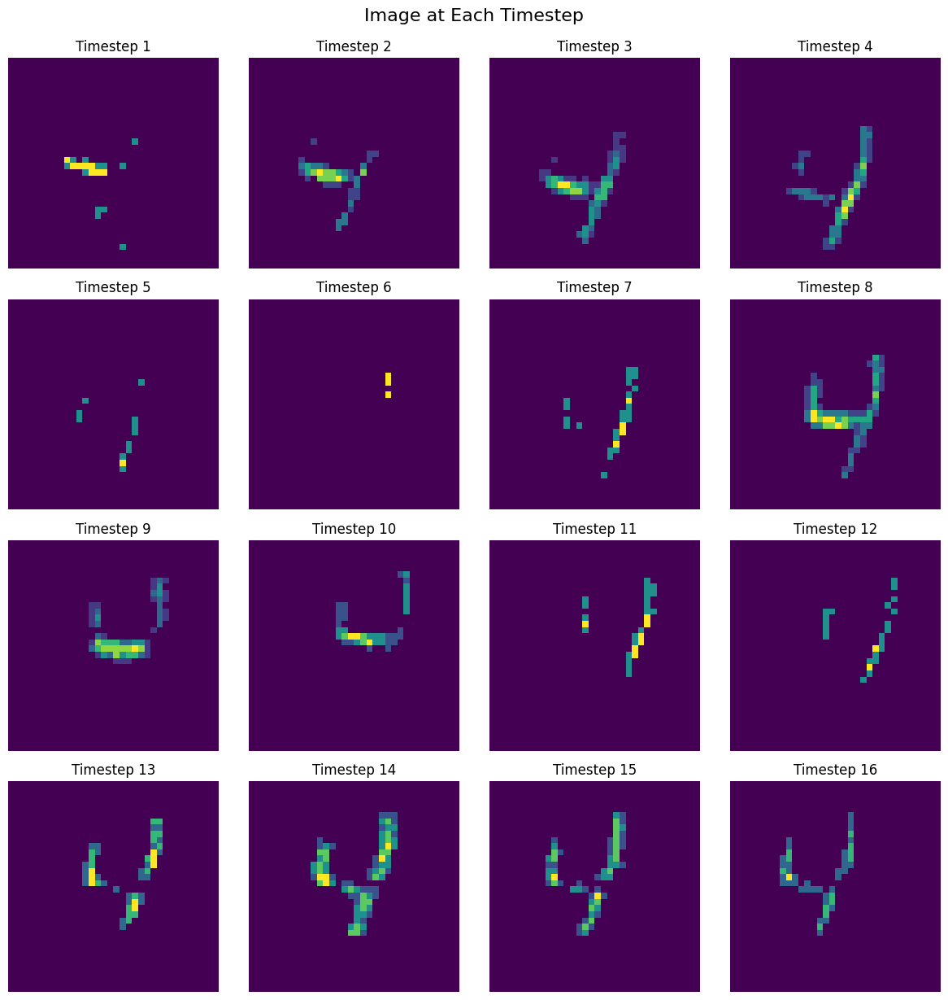

------------------------------------Recon Image---------------------------------------------


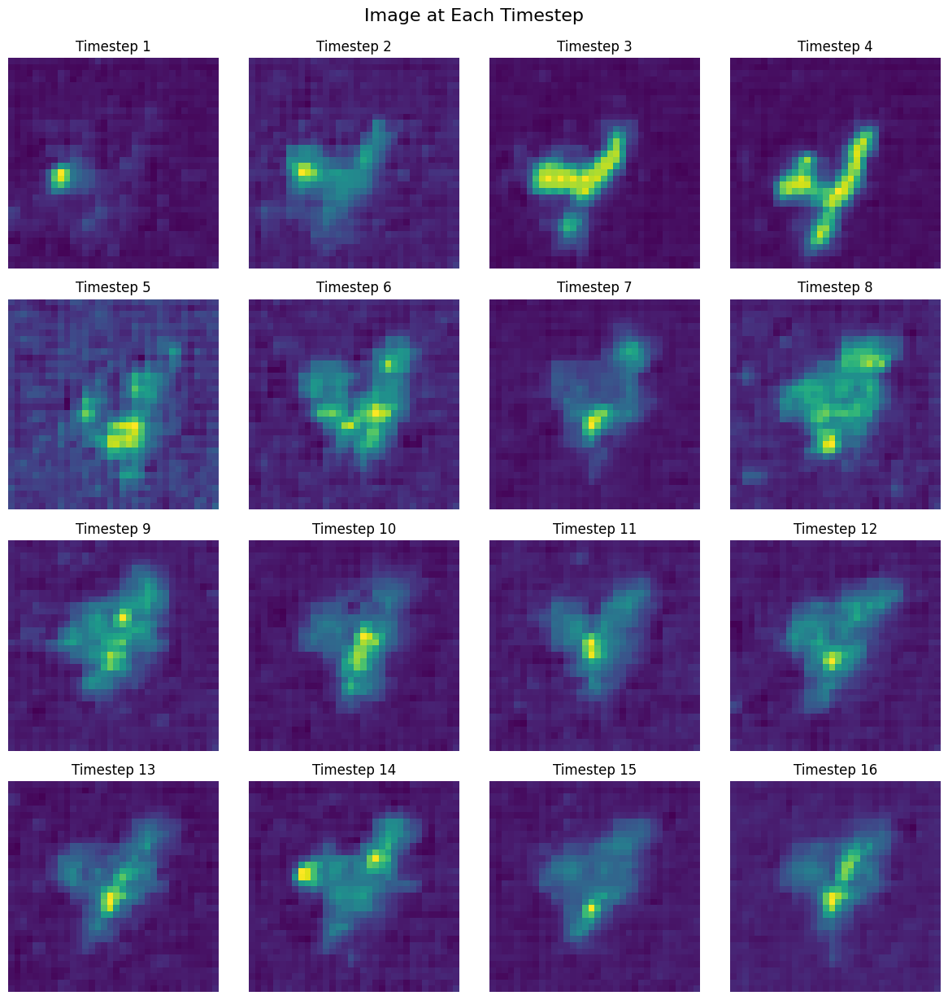

------------------------------------Original Image---------------------------------------------


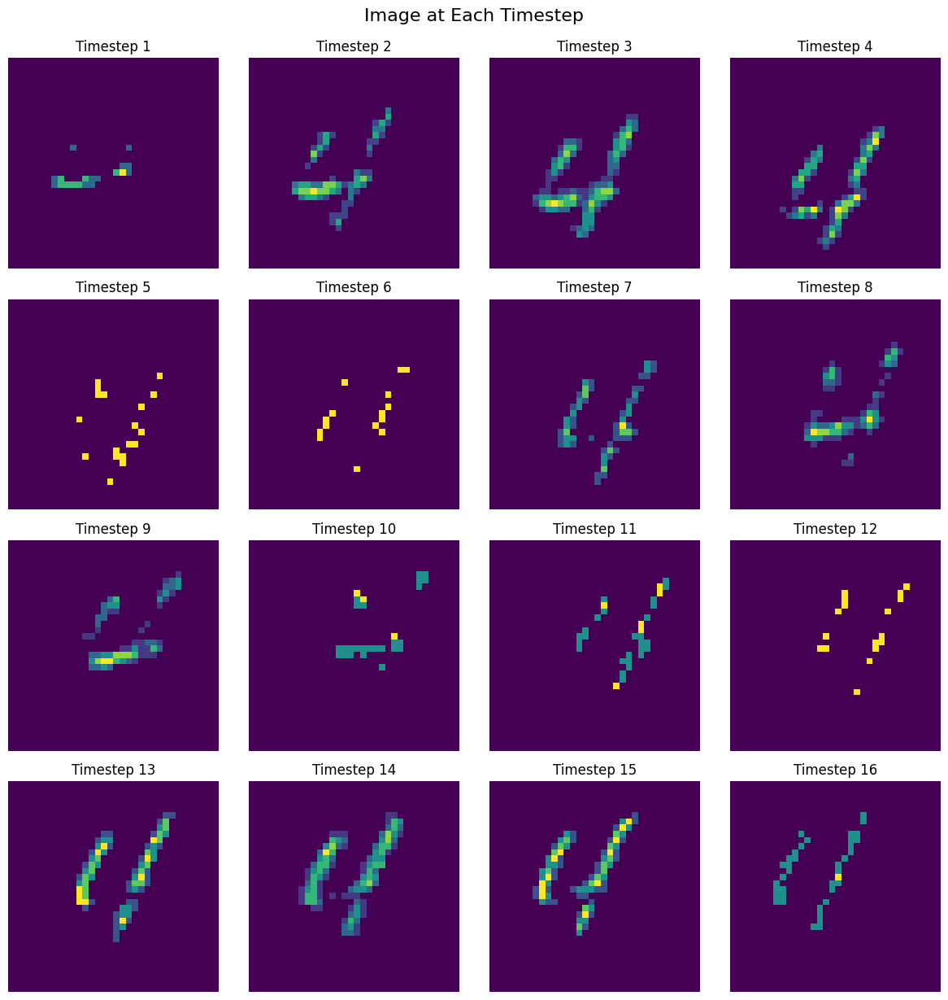

------------------------------------Recon Image---------------------------------------------


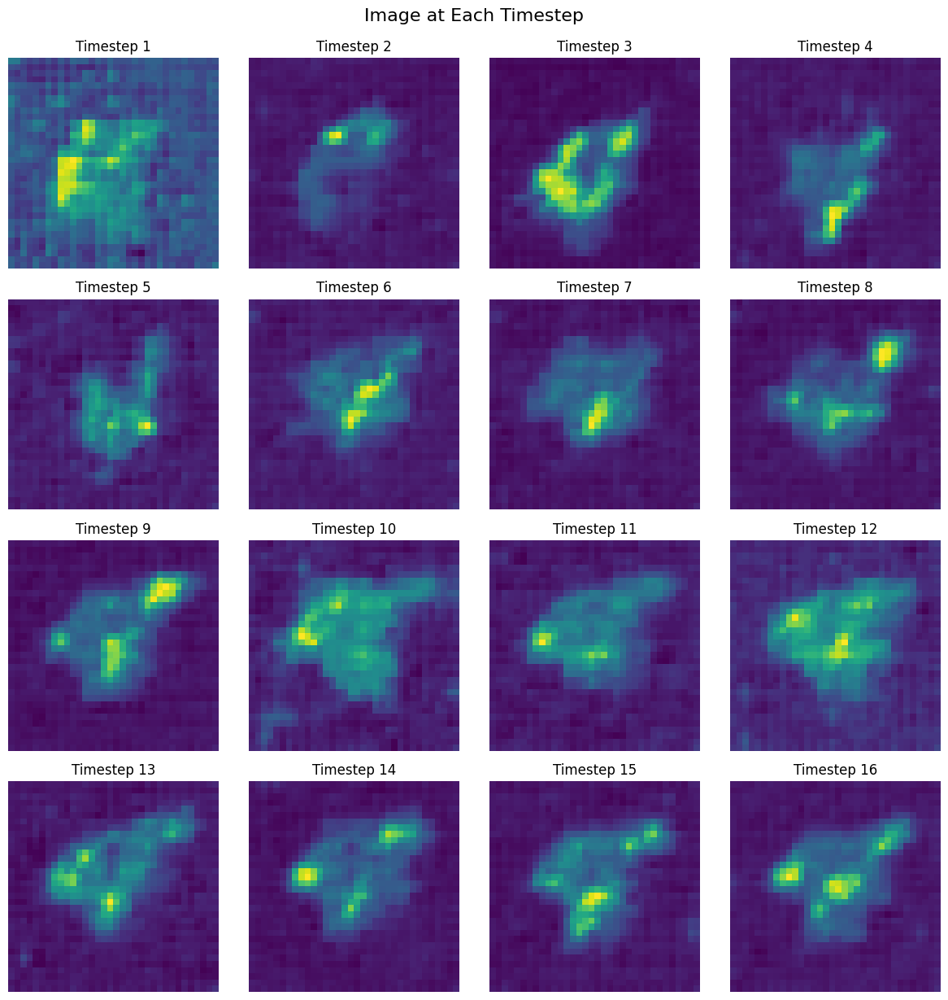

------------------------------------Original Image---------------------------------------------


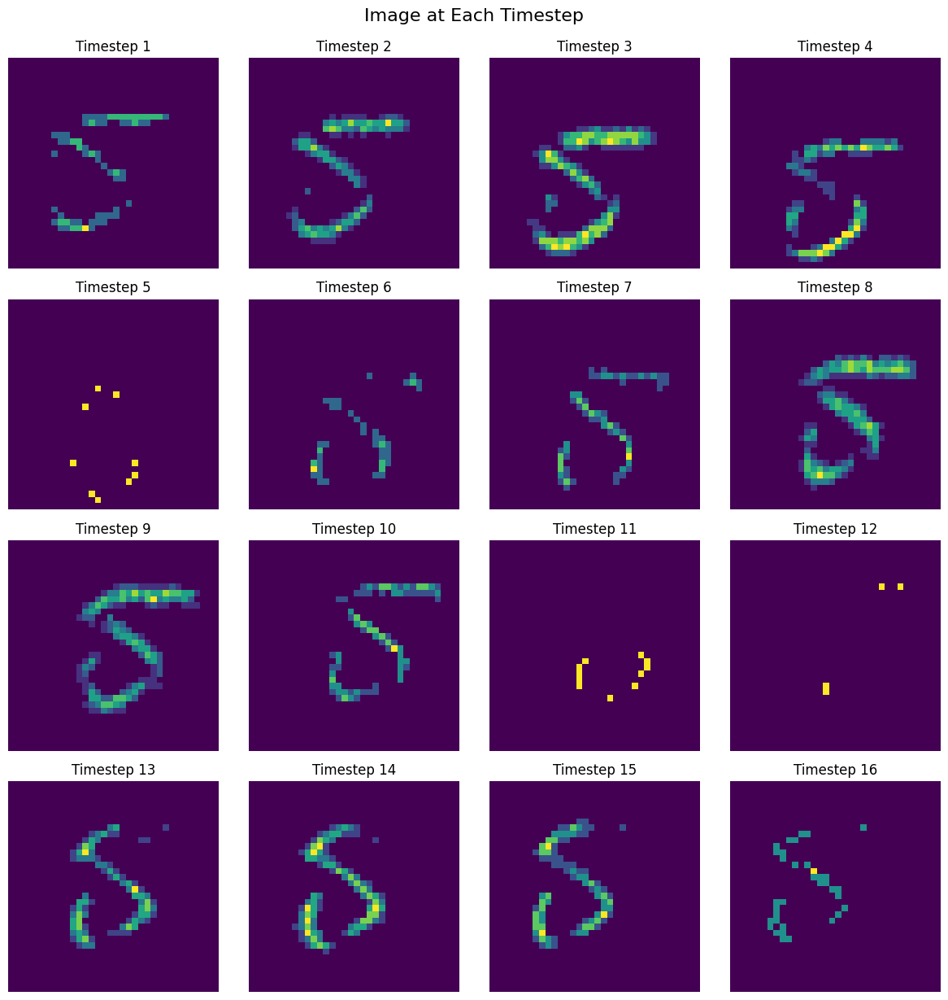

------------------------------------Recon Image---------------------------------------------


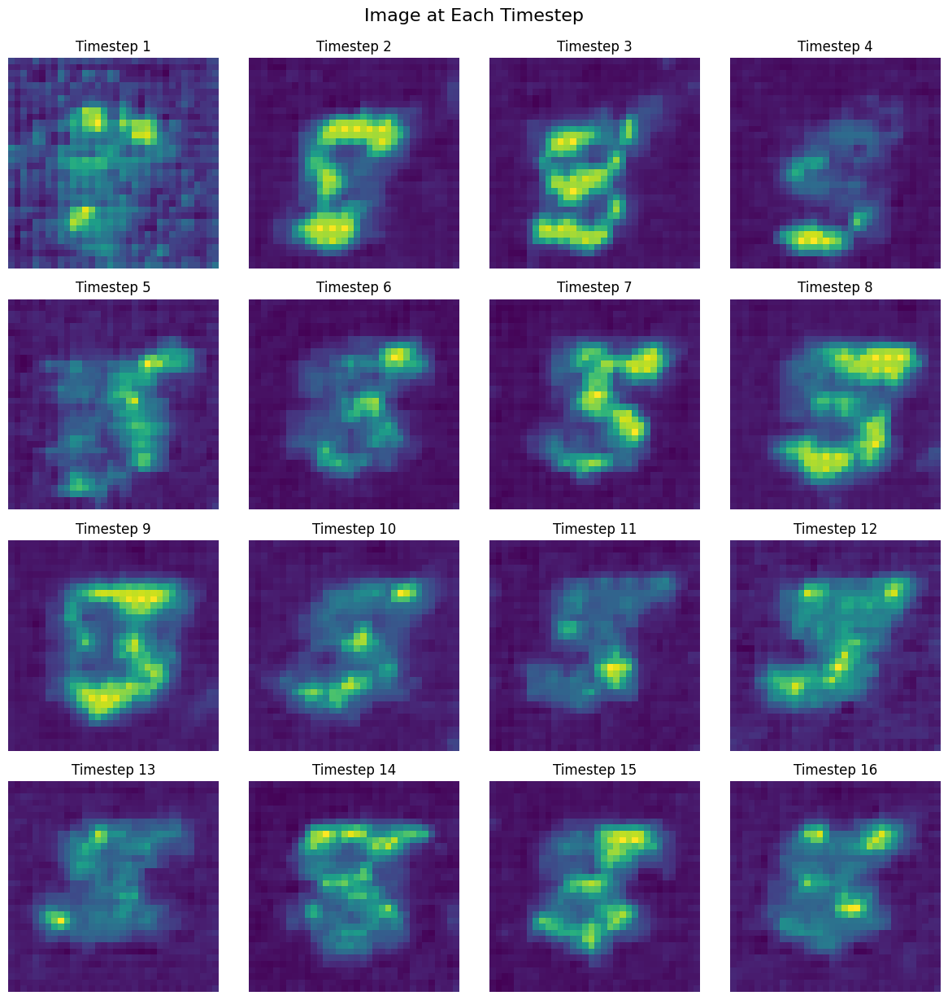

------------------------------------Original Image---------------------------------------------


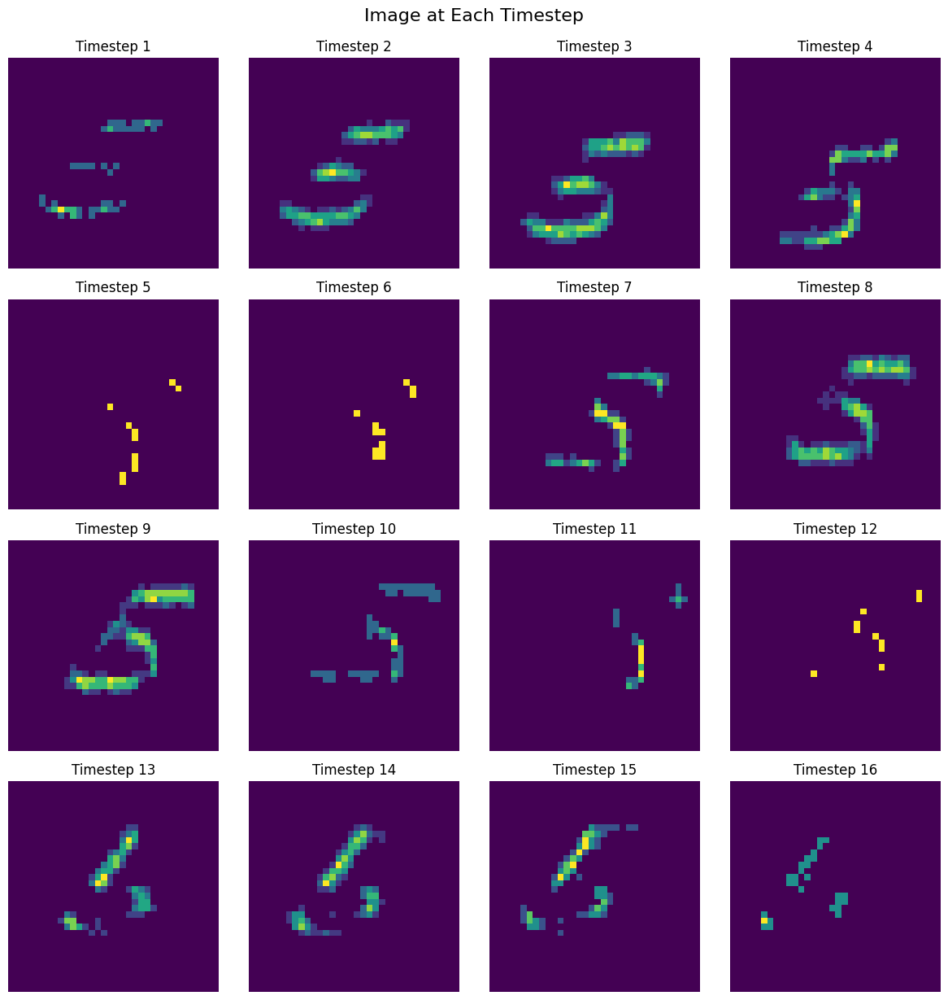

------------------------------------Recon Image---------------------------------------------


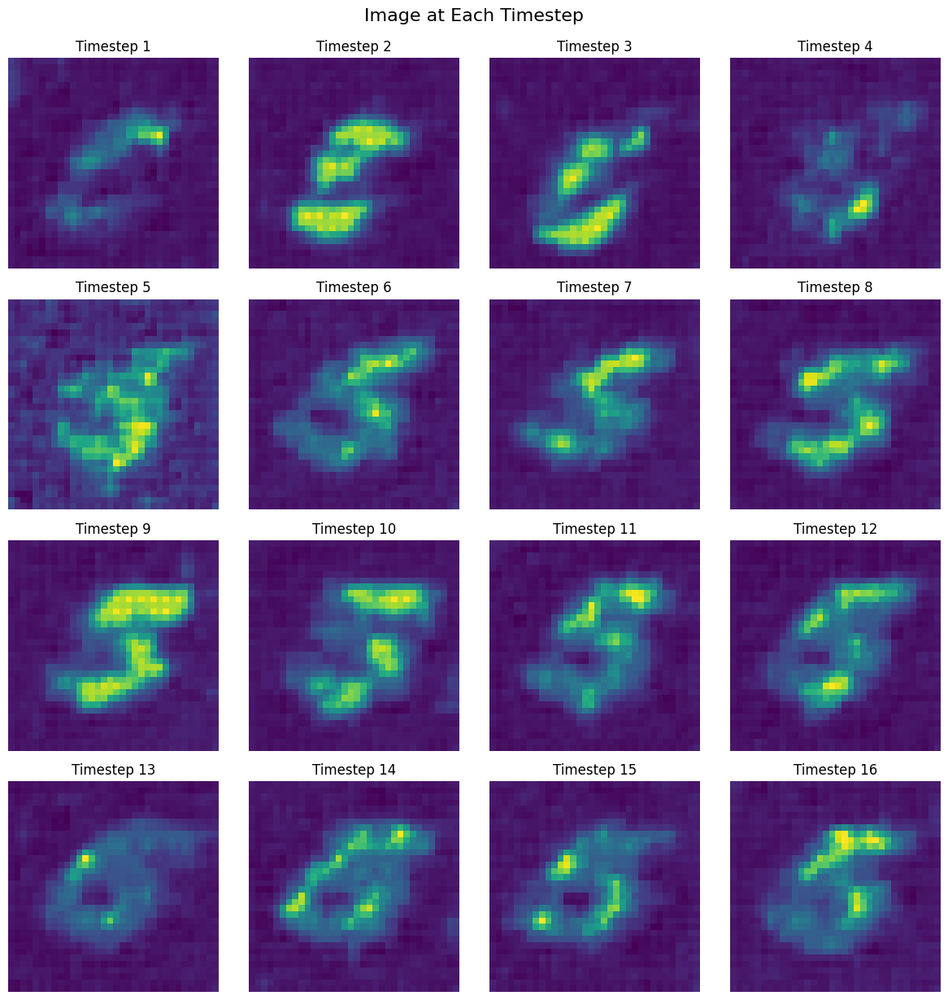

------------------------------------Original Image---------------------------------------------


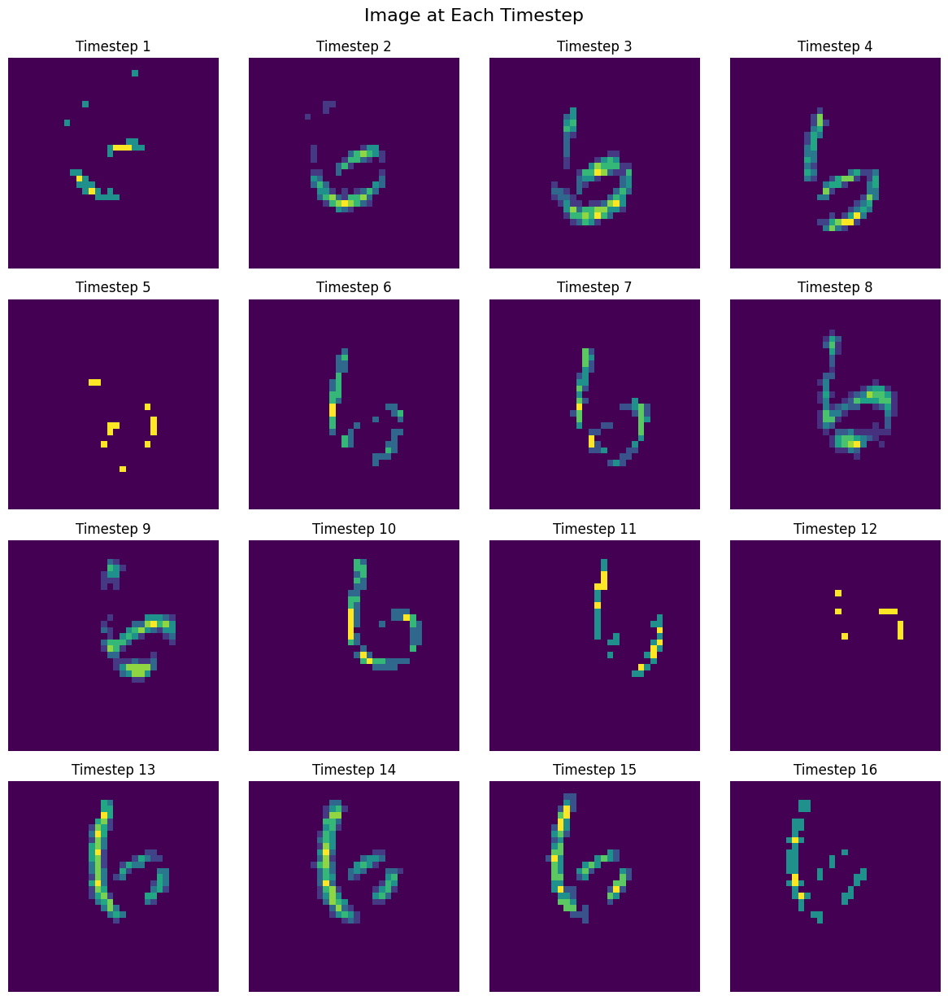

------------------------------------Recon Image---------------------------------------------


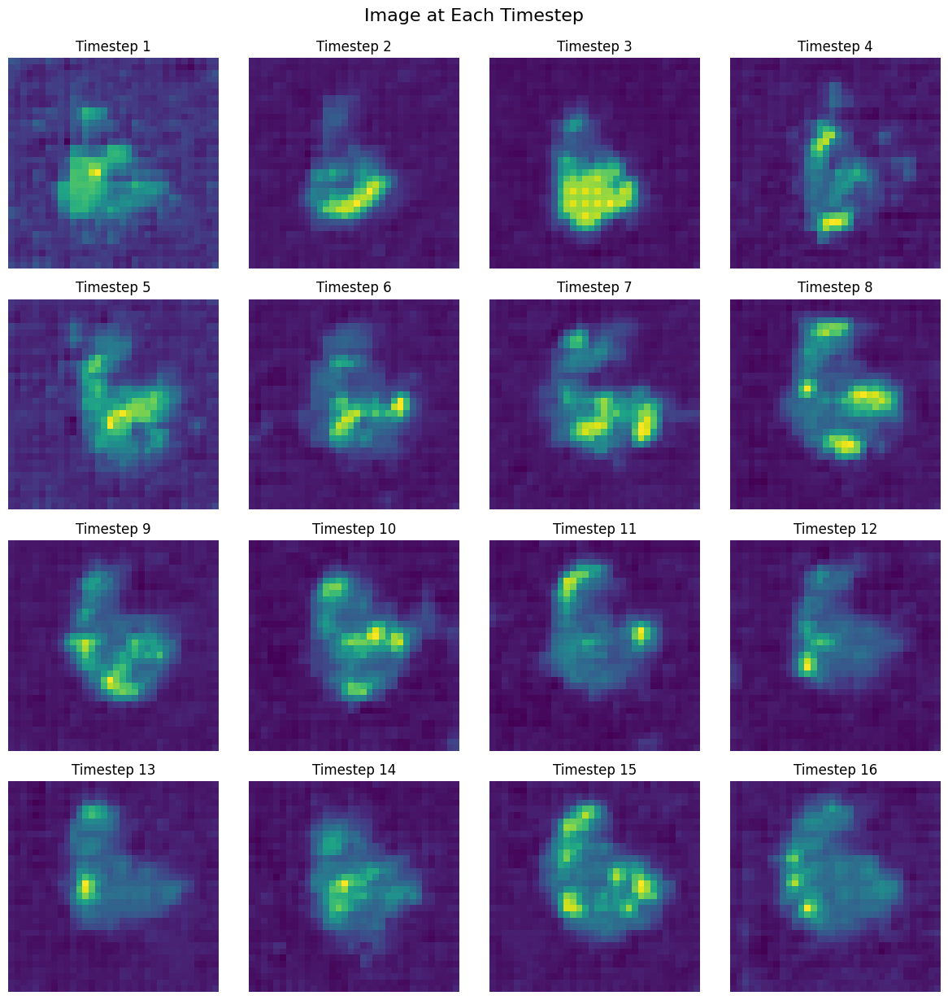

------------------------------------Original Image---------------------------------------------


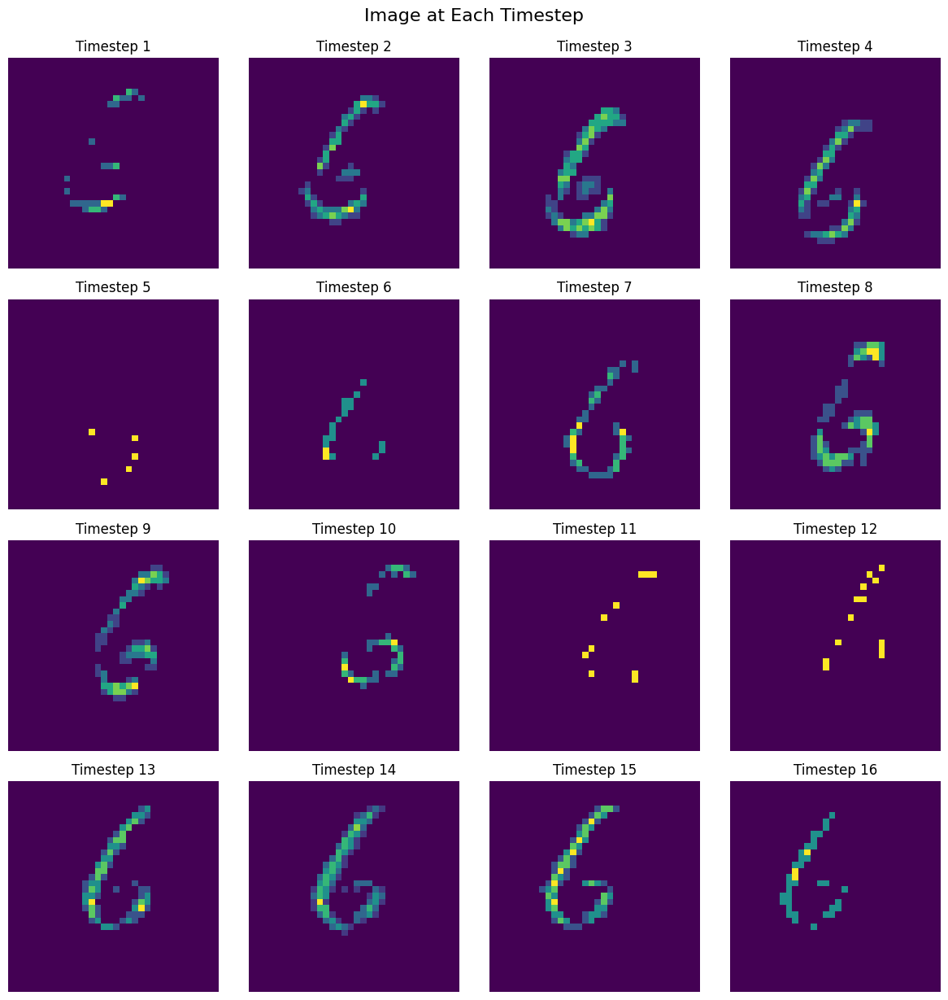

------------------------------------Recon Image---------------------------------------------


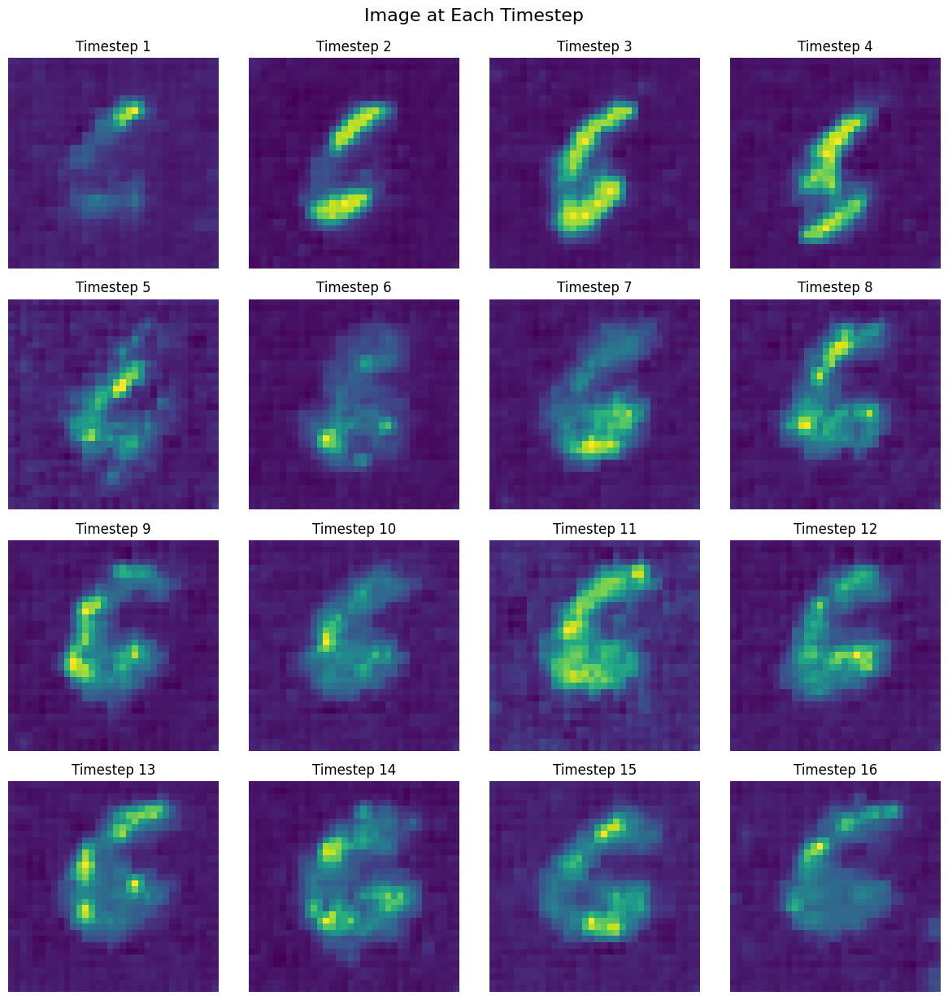

------------------------------------Original Image---------------------------------------------


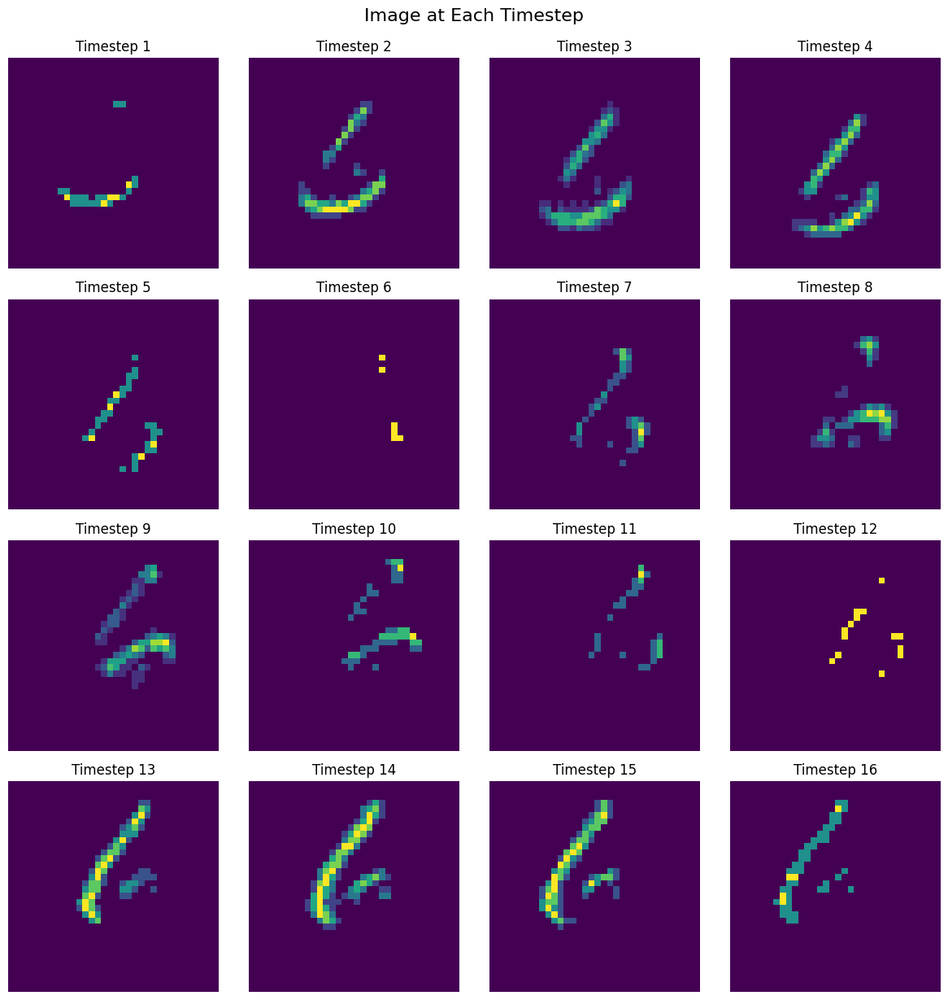

------------------------------------Recon Image---------------------------------------------


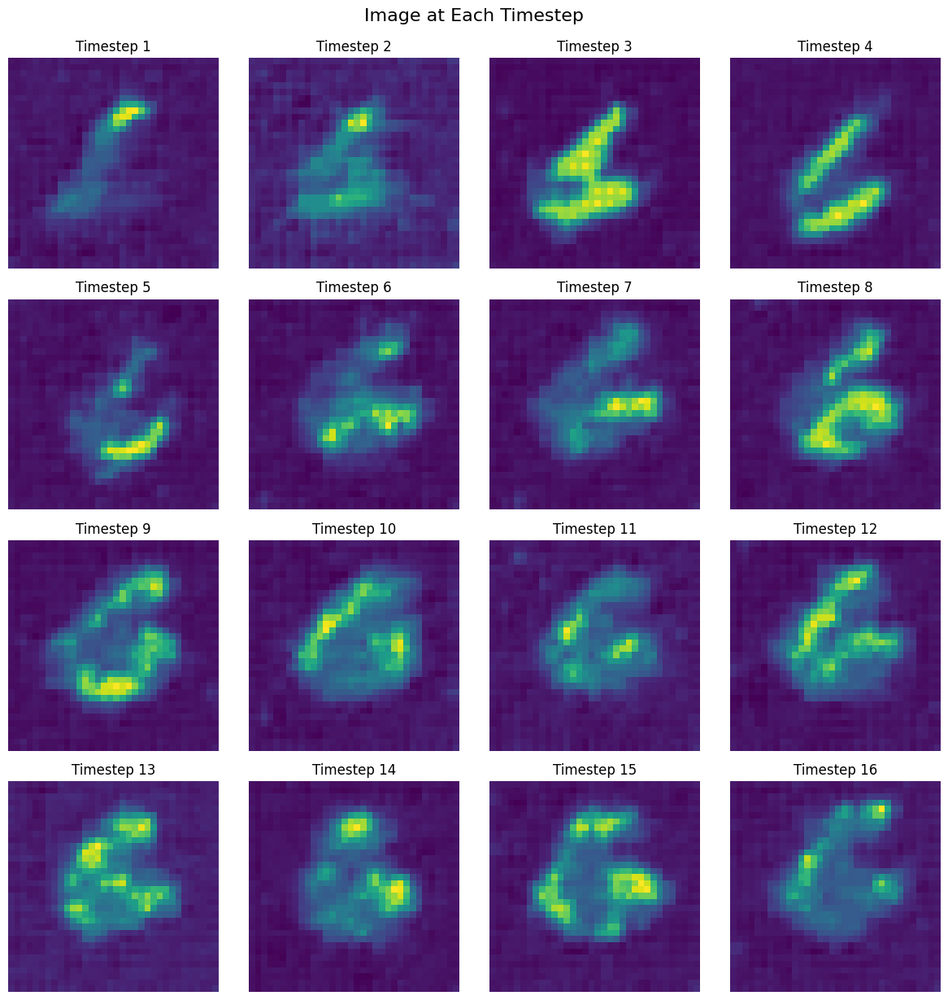

------------------------------------Original Image---------------------------------------------


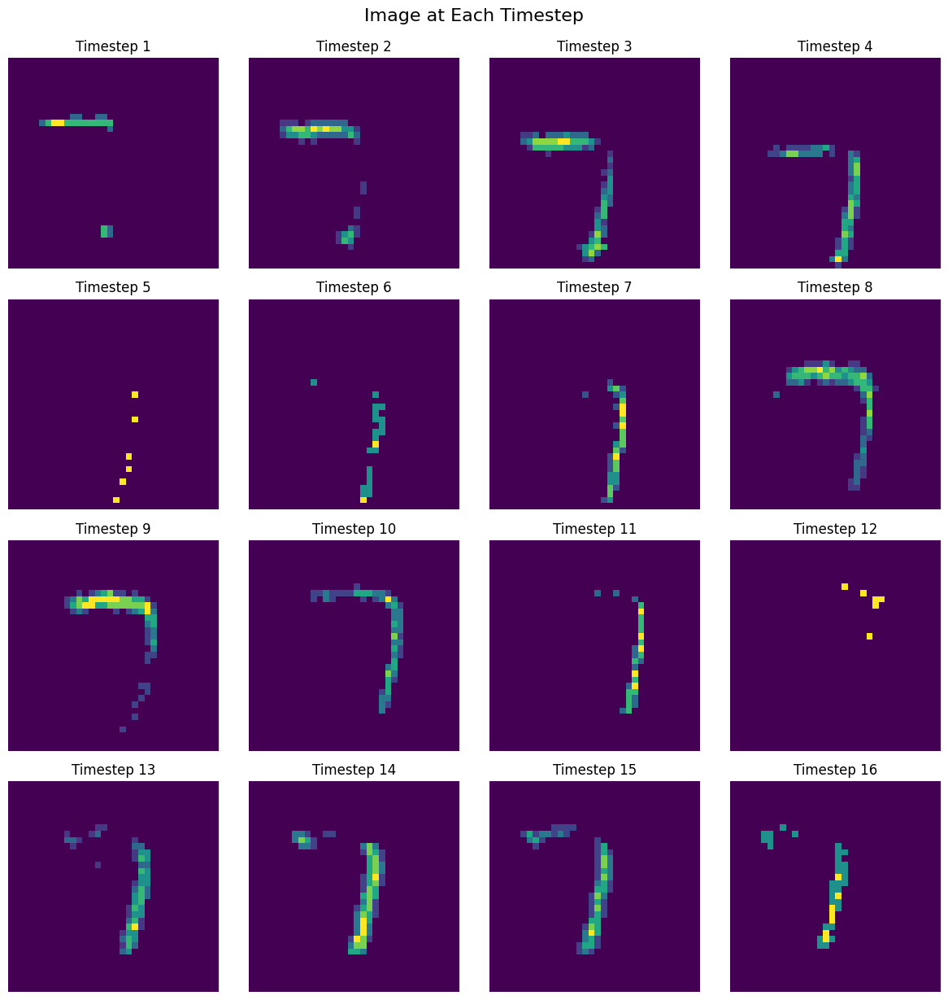

------------------------------------Recon Image---------------------------------------------


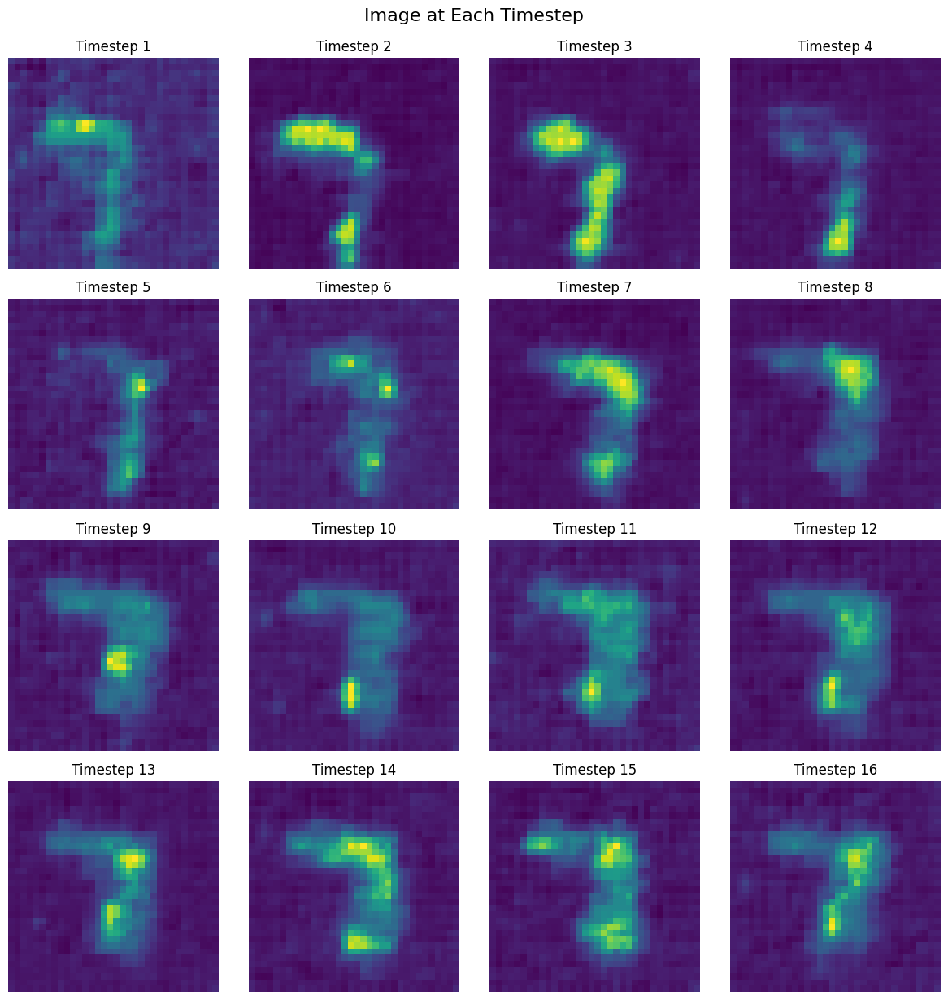

------------------------------------Original Image---------------------------------------------


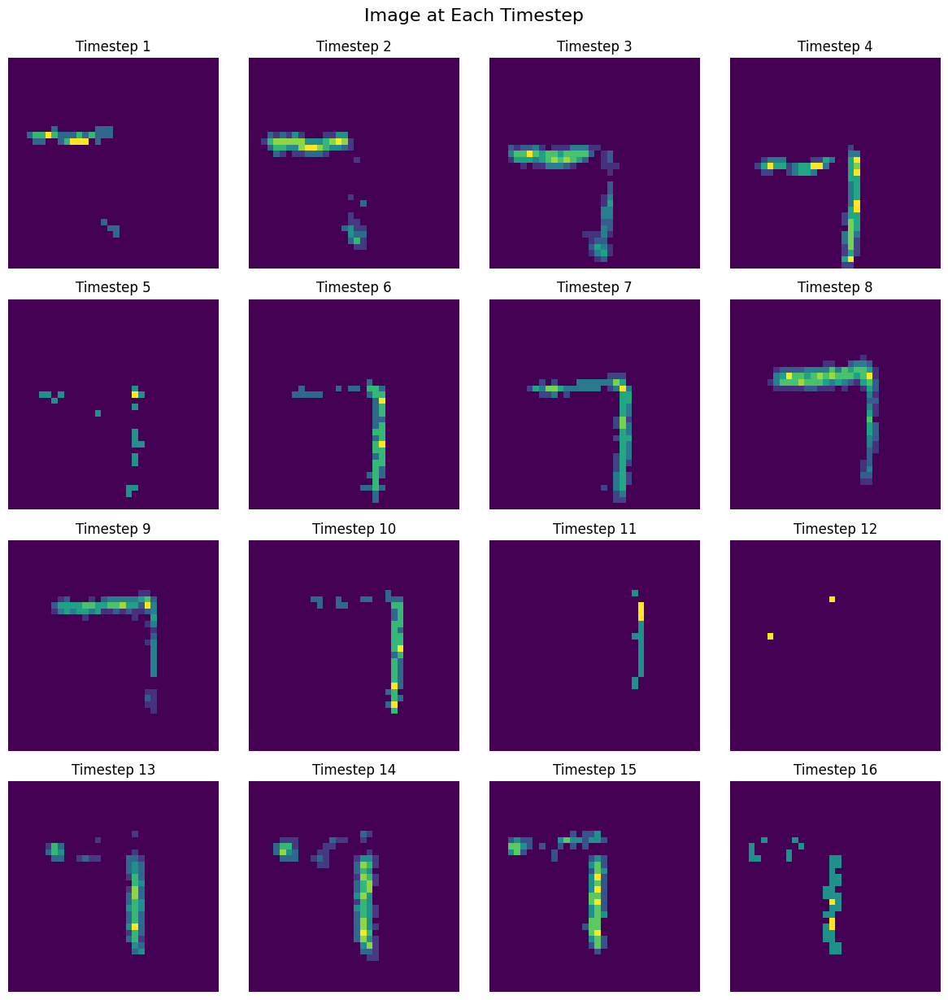

------------------------------------Recon Image---------------------------------------------


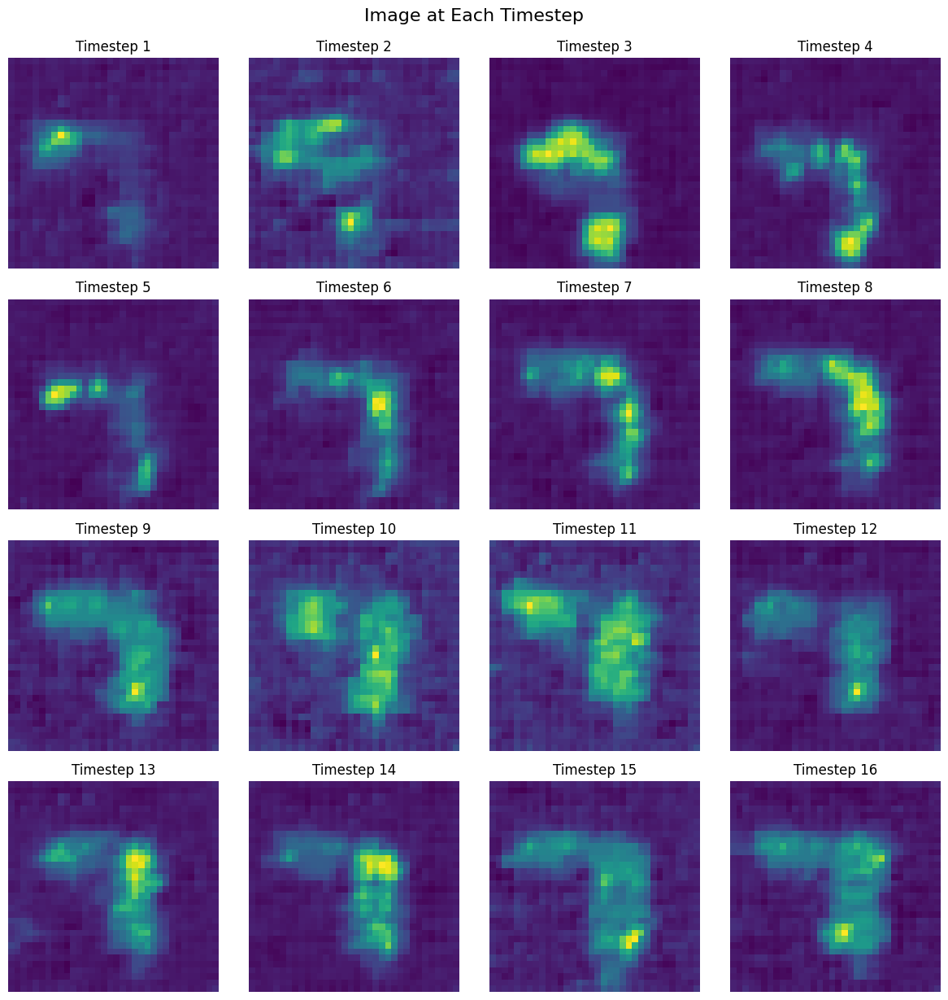

------------------------------------Original Image---------------------------------------------


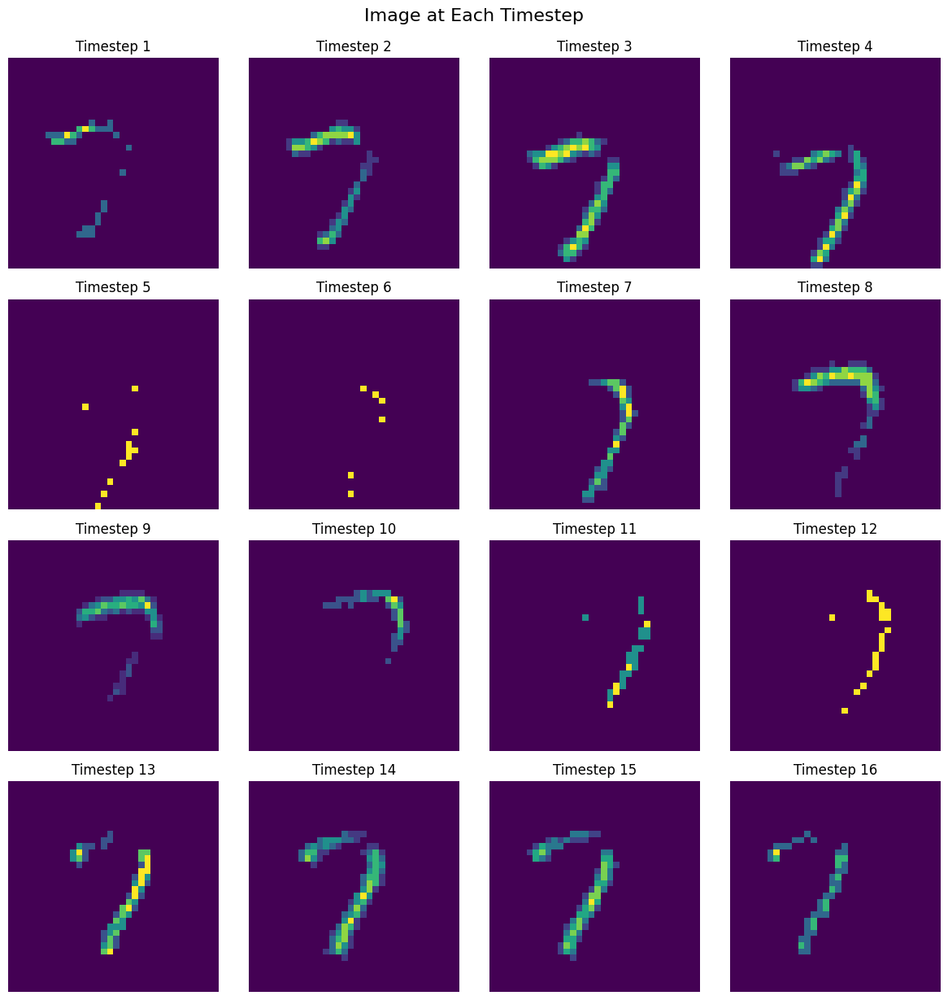

------------------------------------Recon Image---------------------------------------------


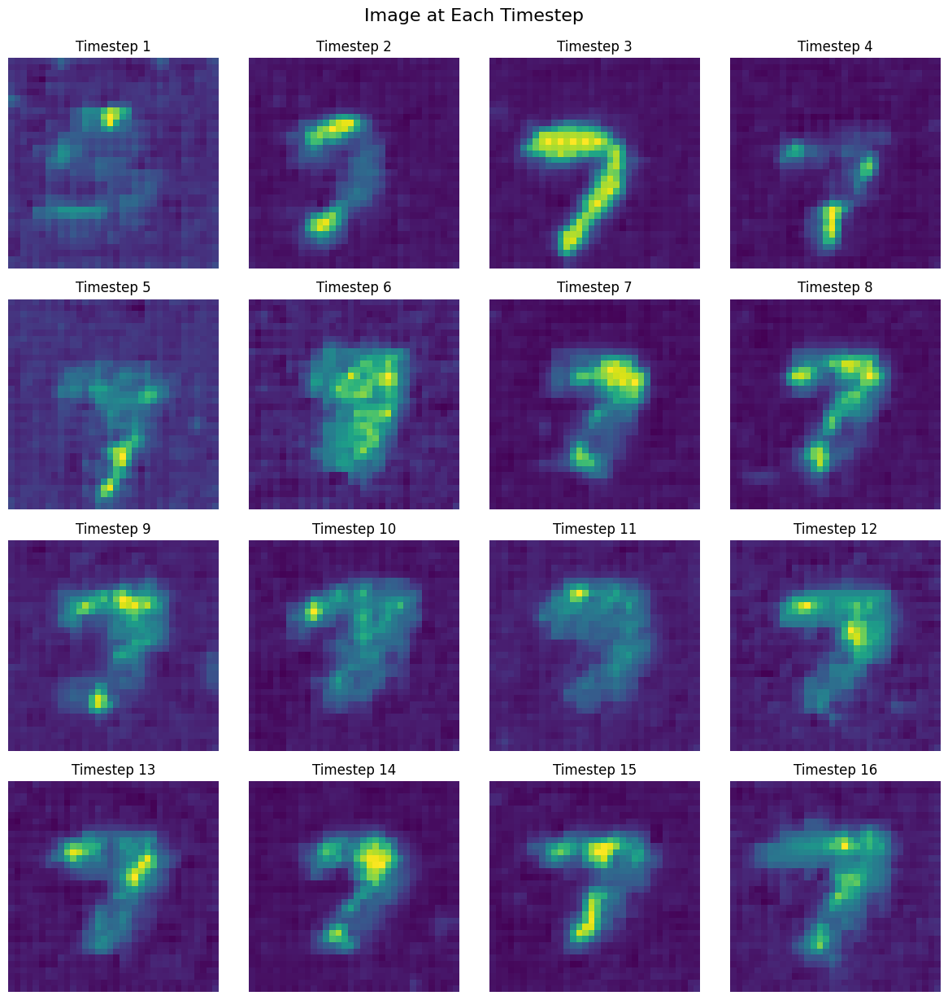

------------------------------------Original Image---------------------------------------------


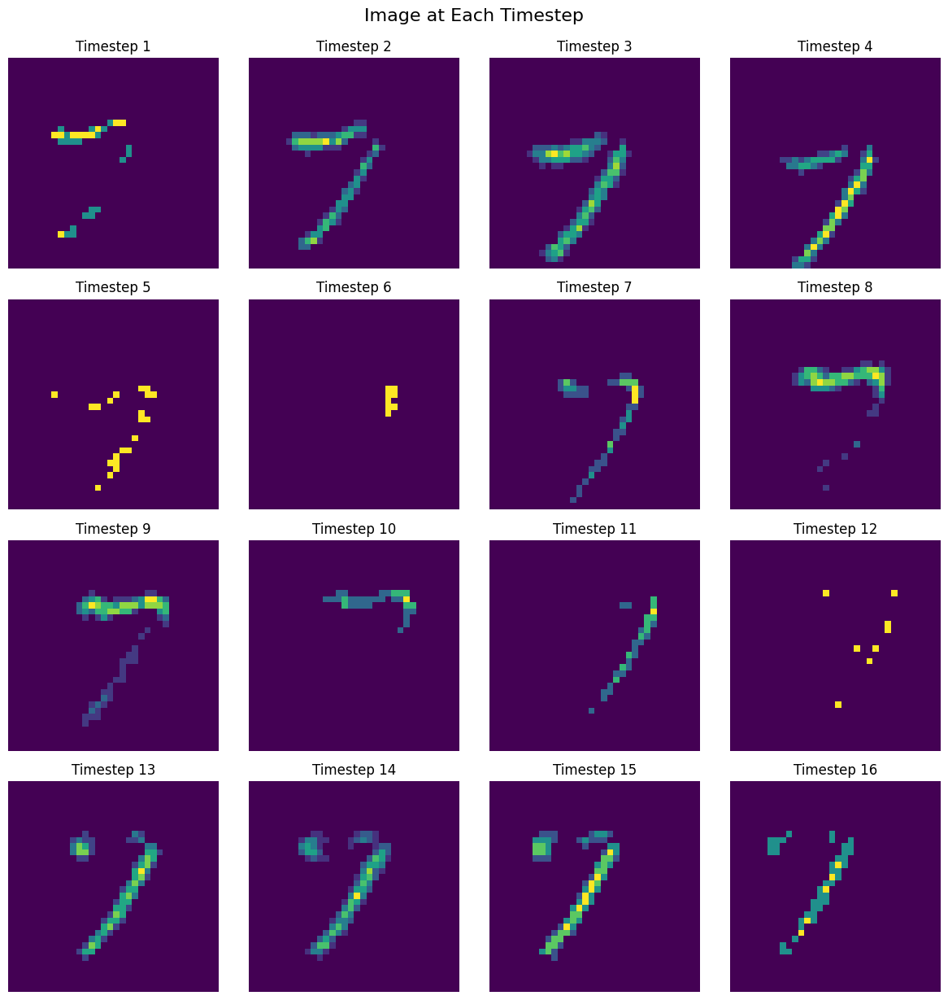

------------------------------------Recon Image---------------------------------------------


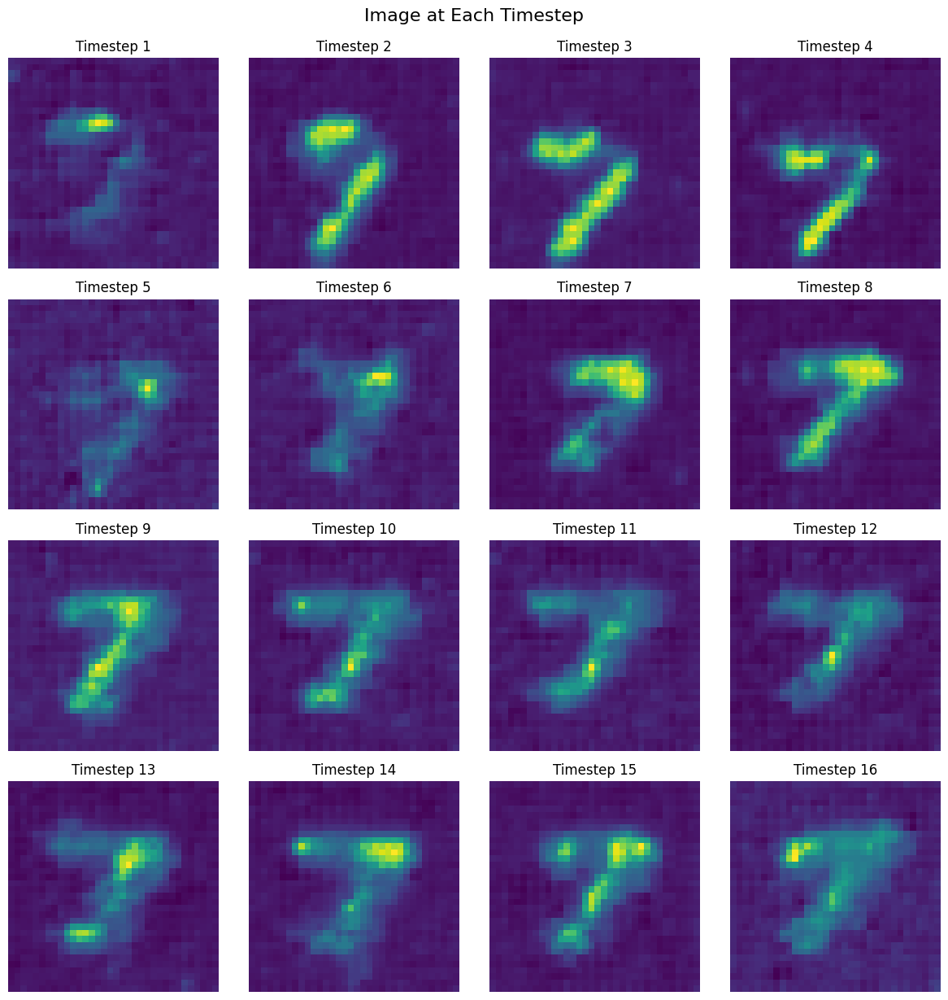

------------------------------------Original Image---------------------------------------------


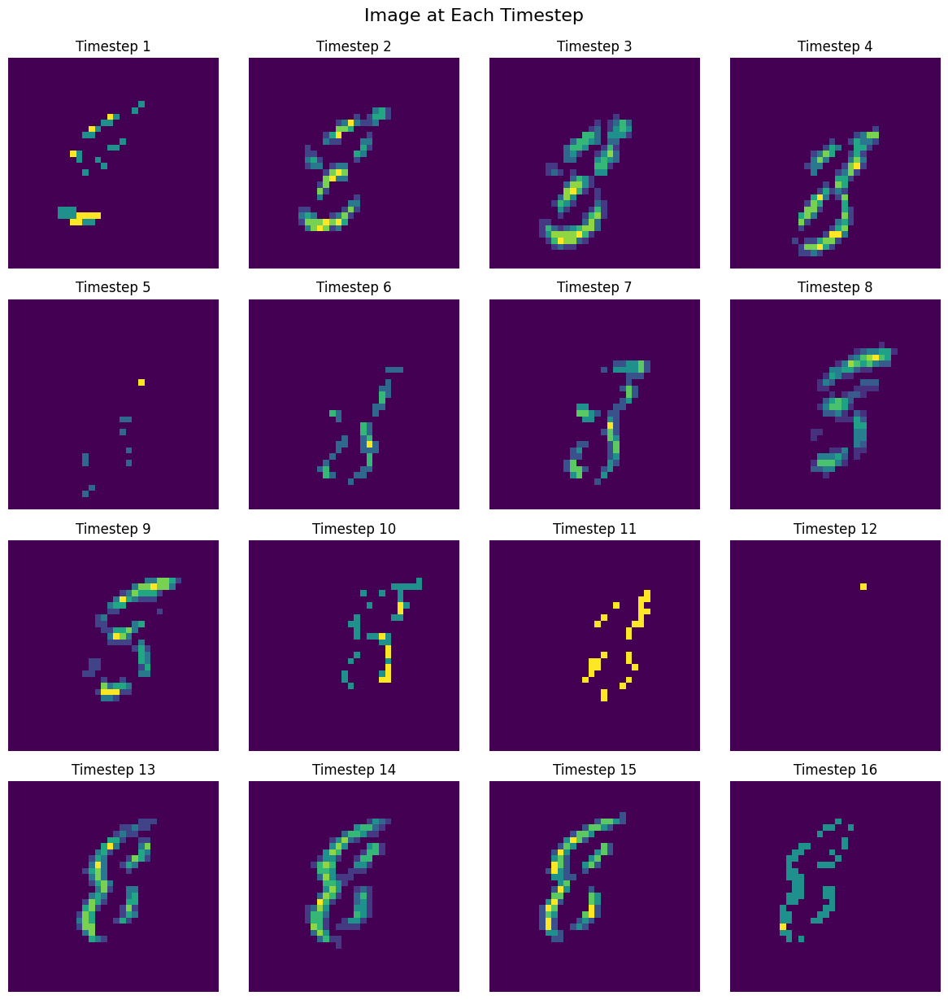

------------------------------------Recon Image---------------------------------------------


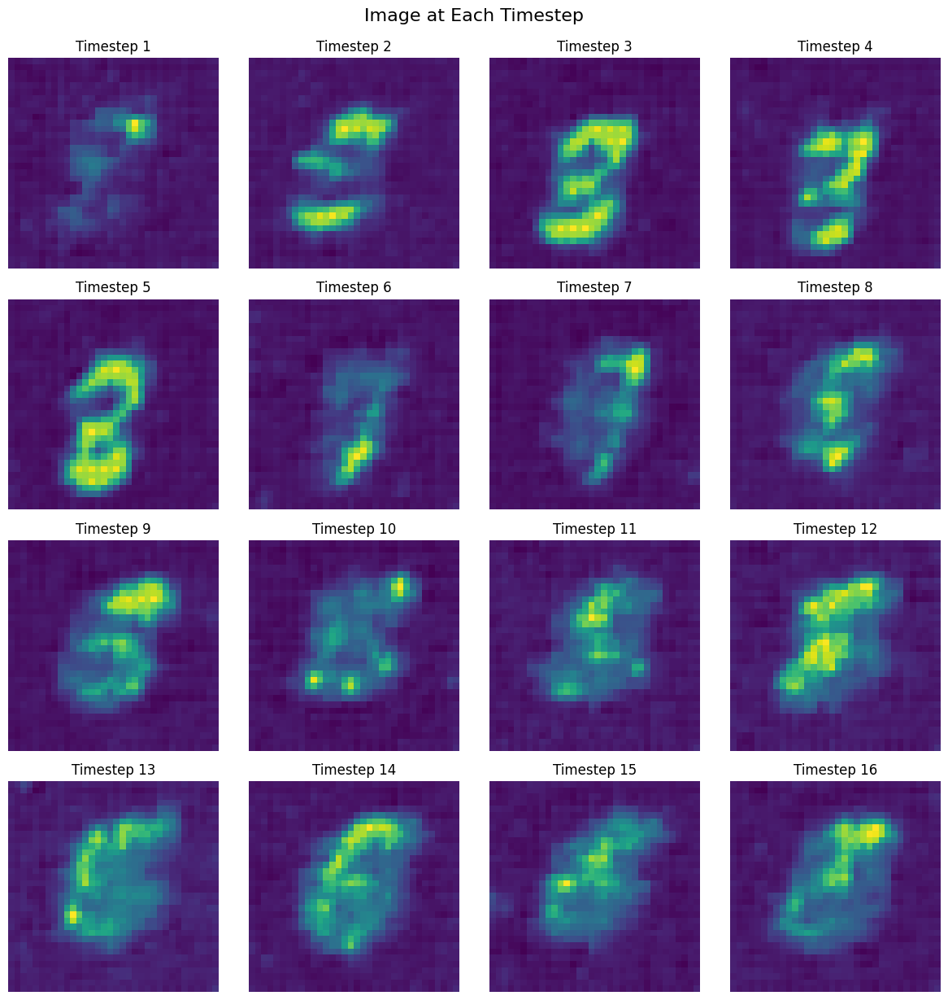

------------------------------------Original Image---------------------------------------------


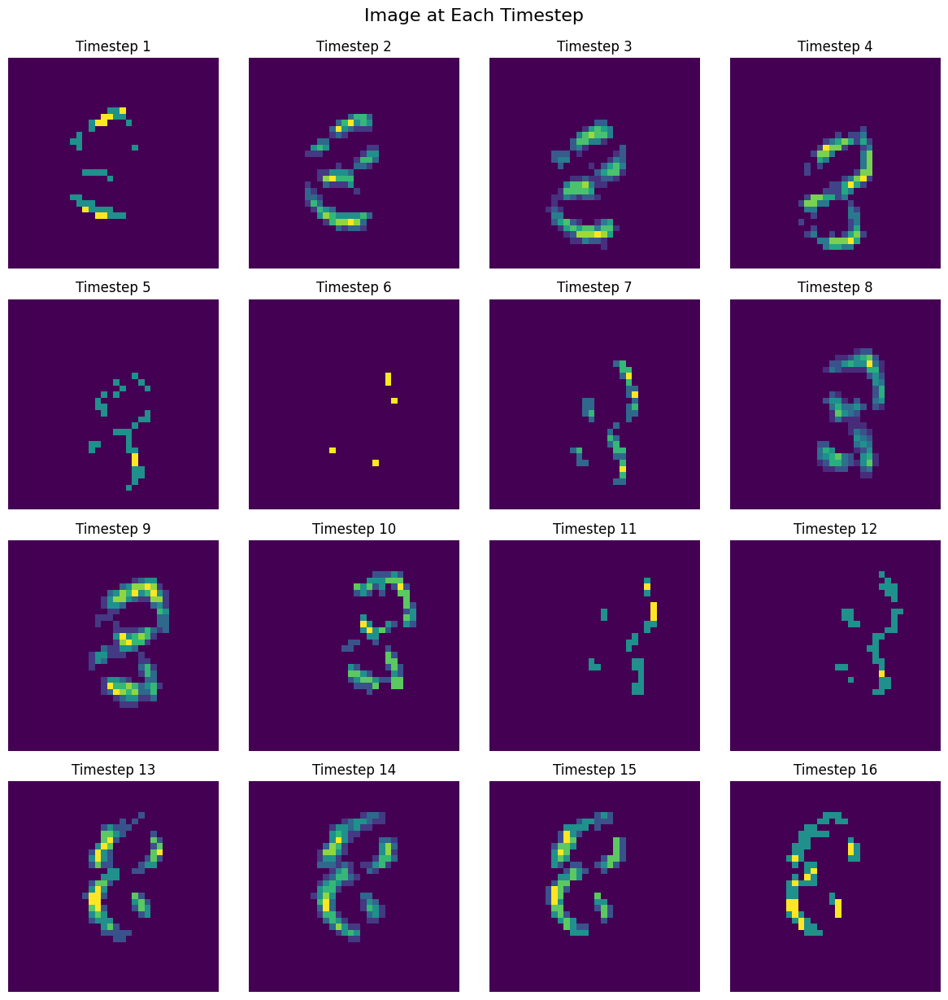

------------------------------------Recon Image---------------------------------------------


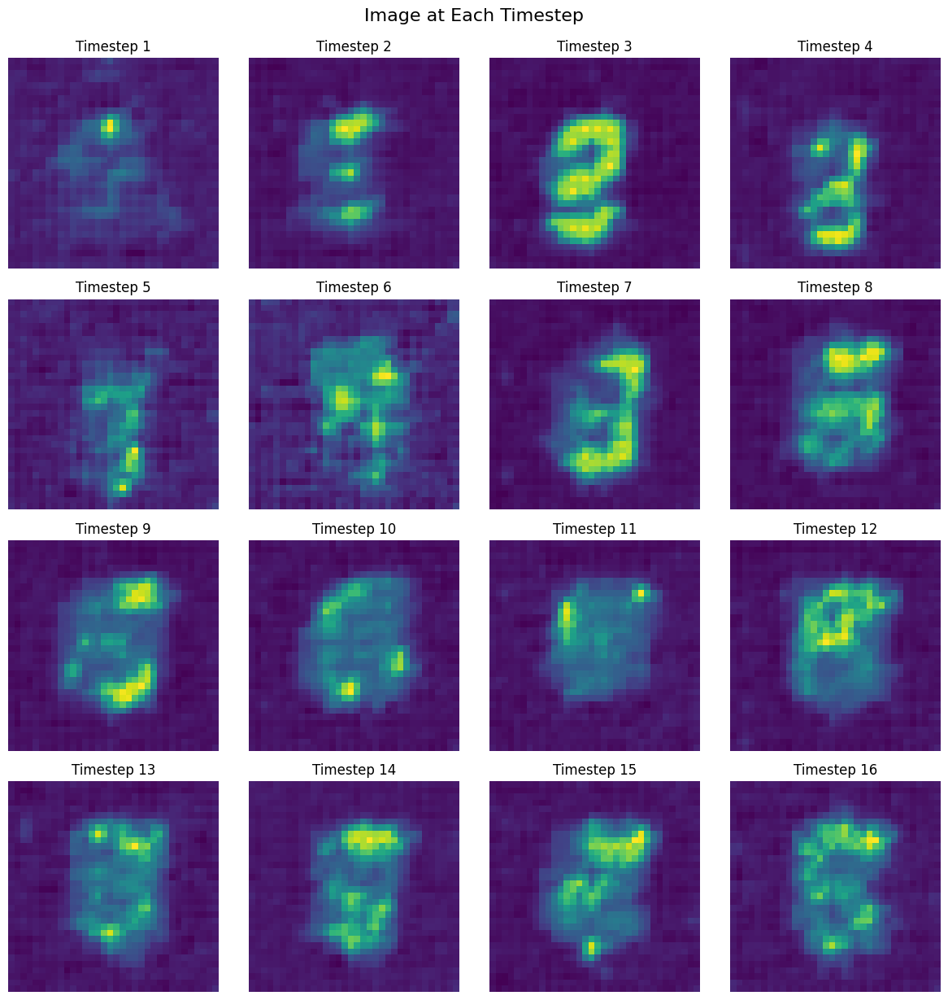

------------------------------------Original Image---------------------------------------------


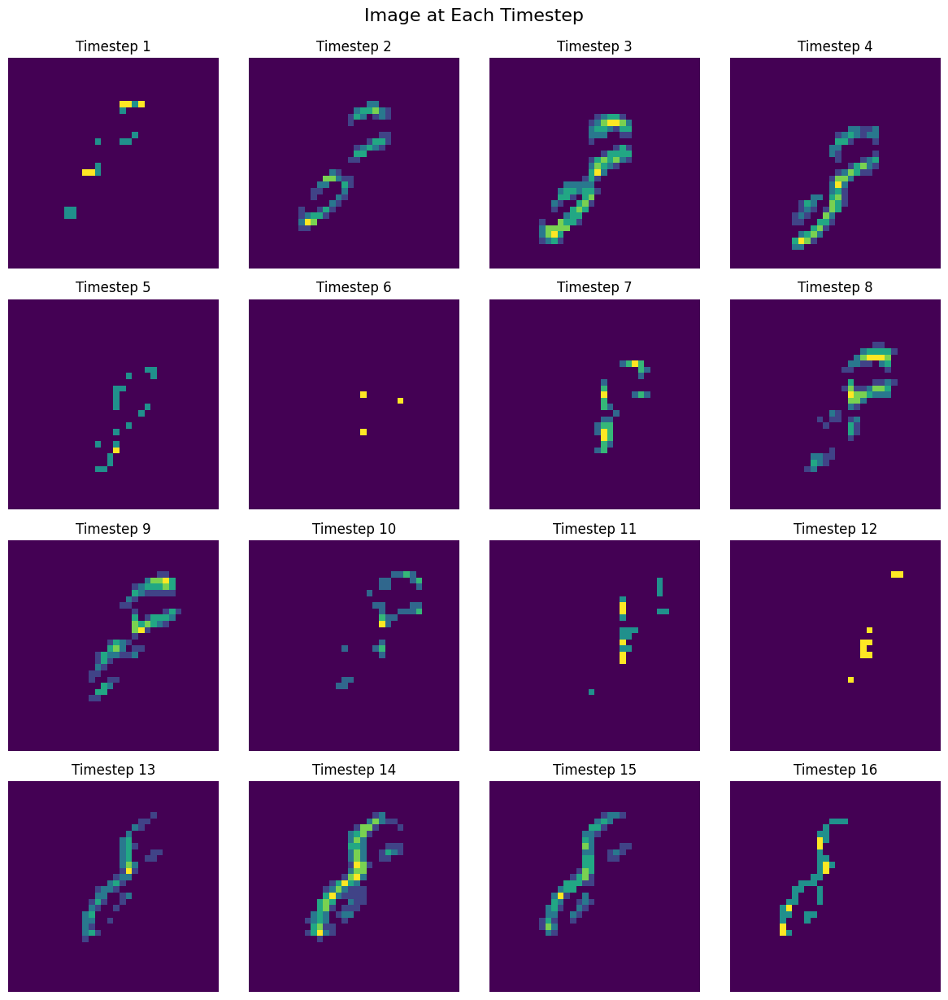

------------------------------------Recon Image---------------------------------------------


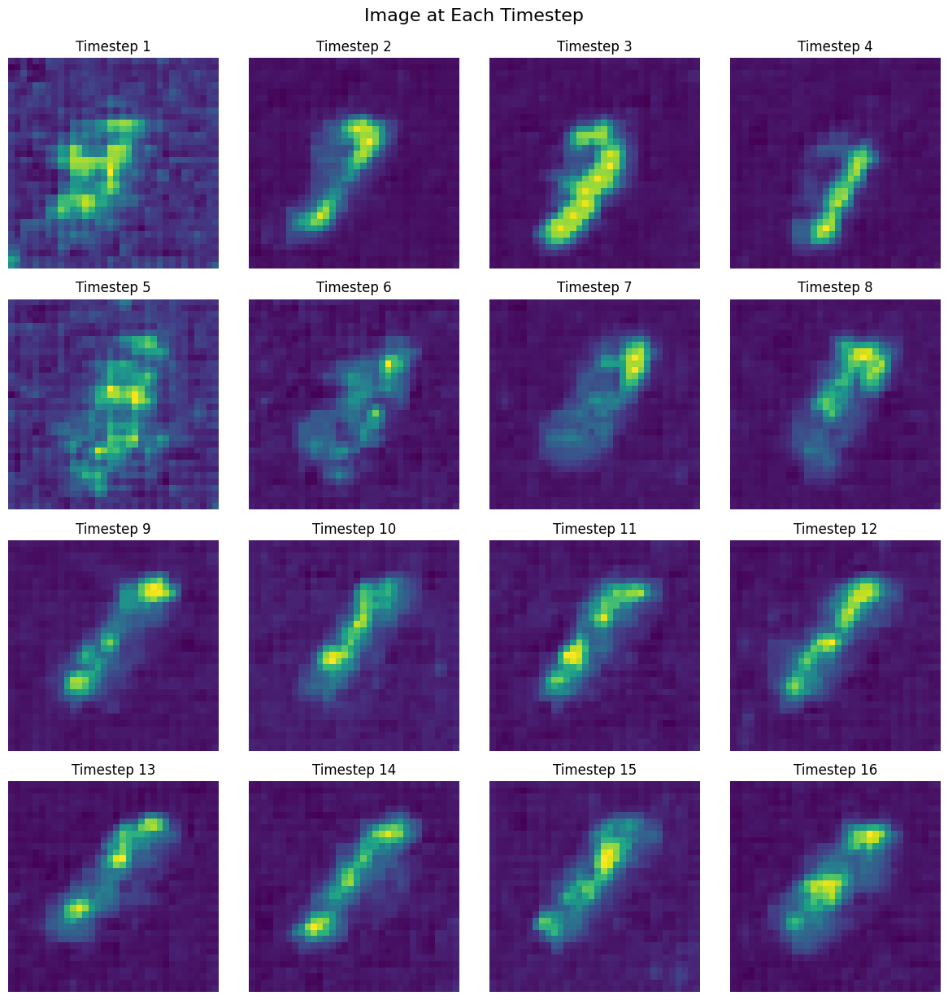

------------------------------------Original Image---------------------------------------------


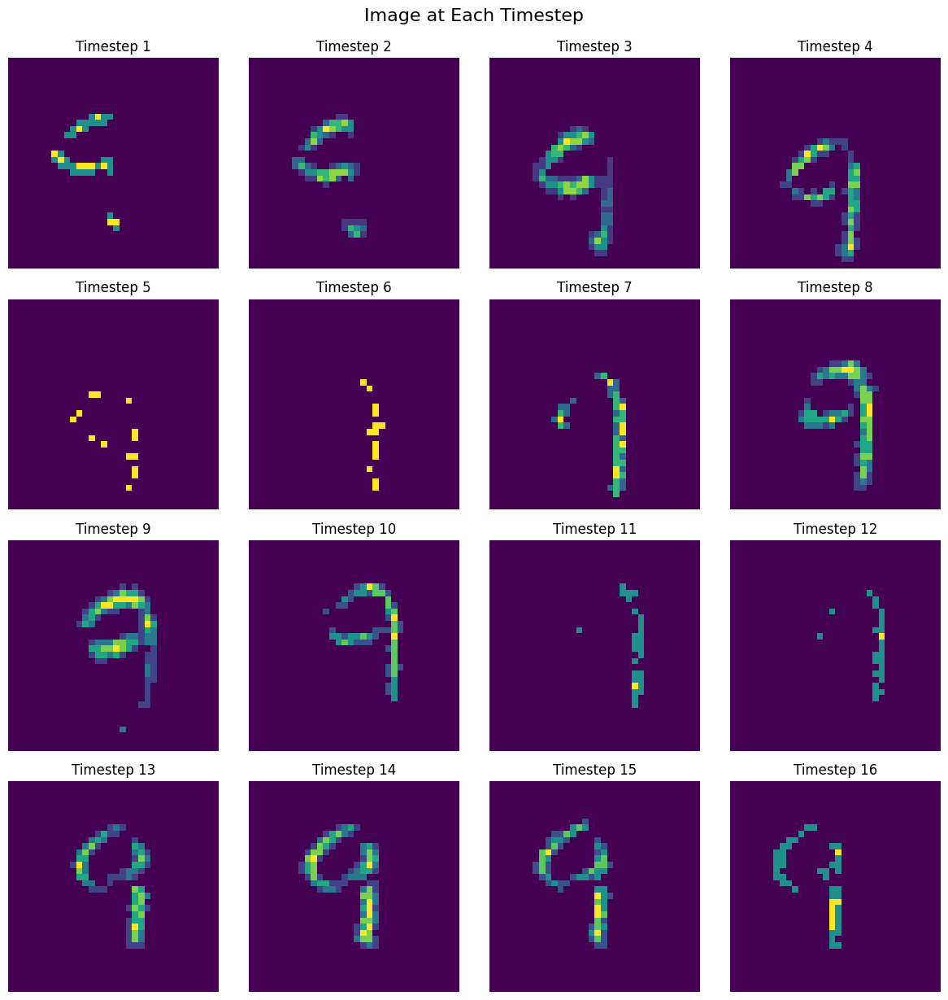

------------------------------------Recon Image---------------------------------------------


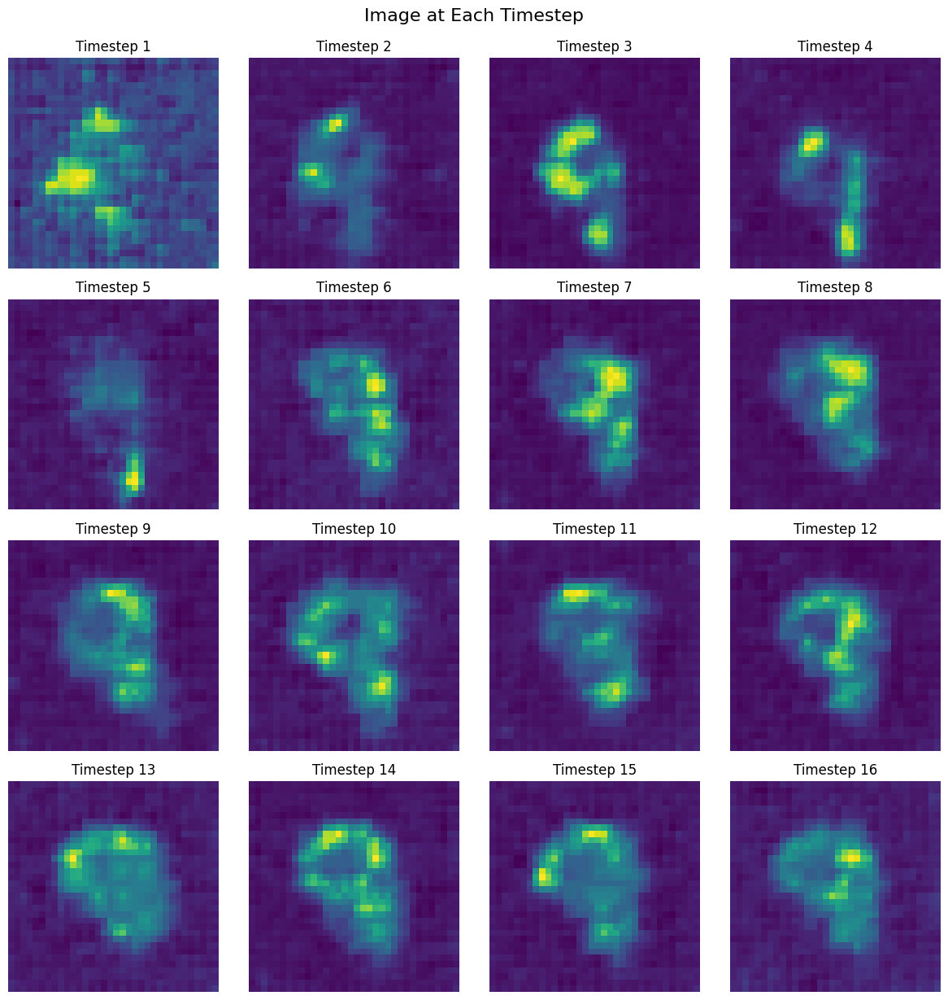

------------------------------------Original Image---------------------------------------------


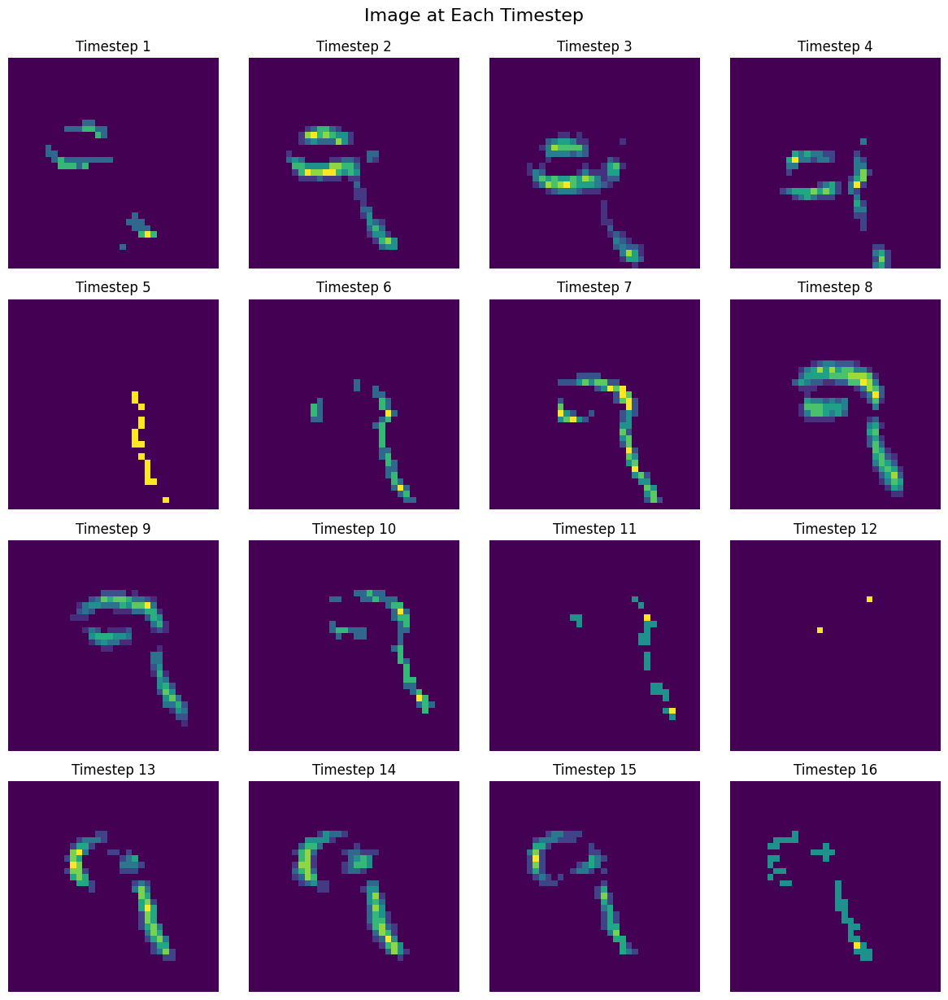

------------------------------------Recon Image---------------------------------------------


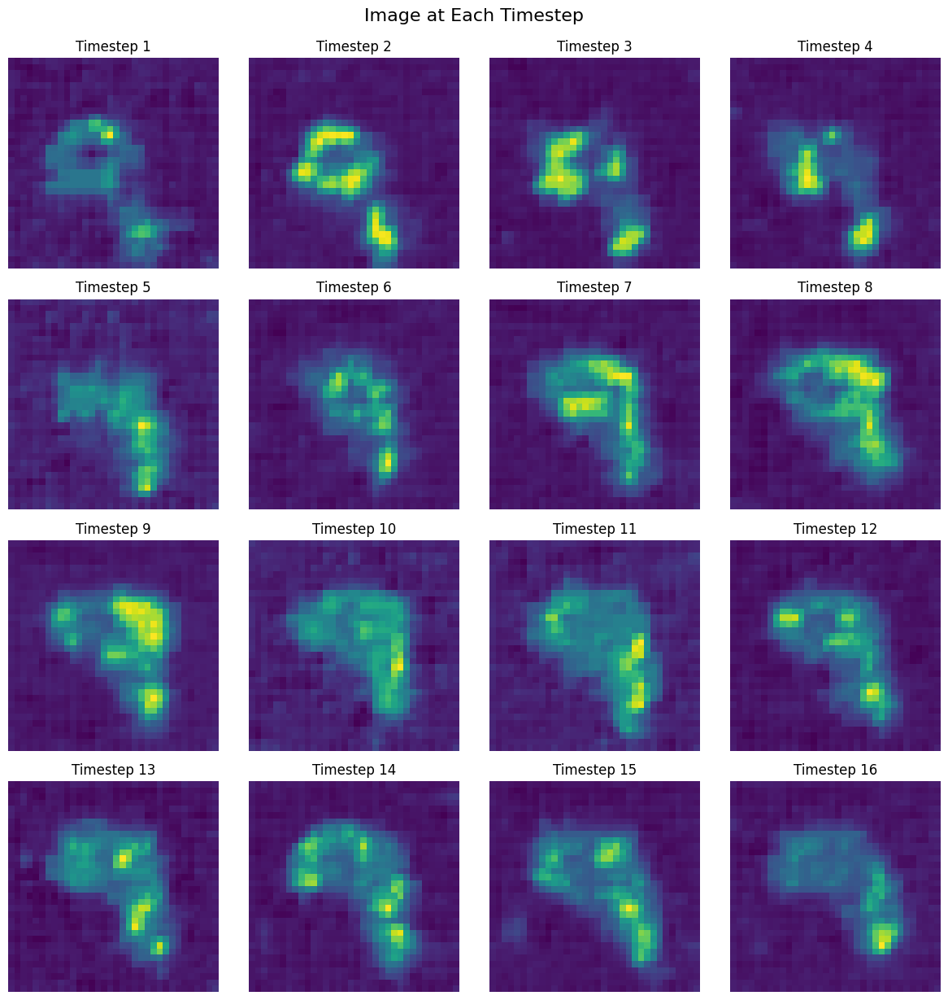

------------------------------------Original Image---------------------------------------------


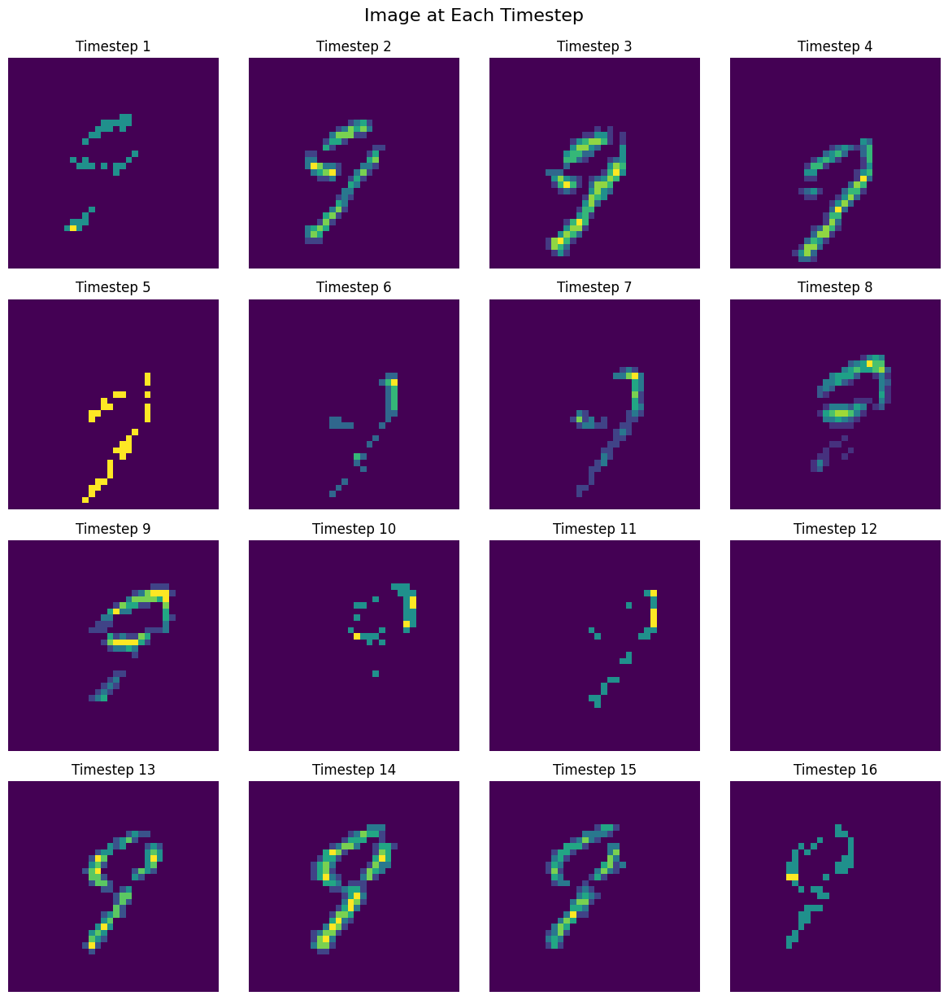

------------------------------------Recon Image---------------------------------------------


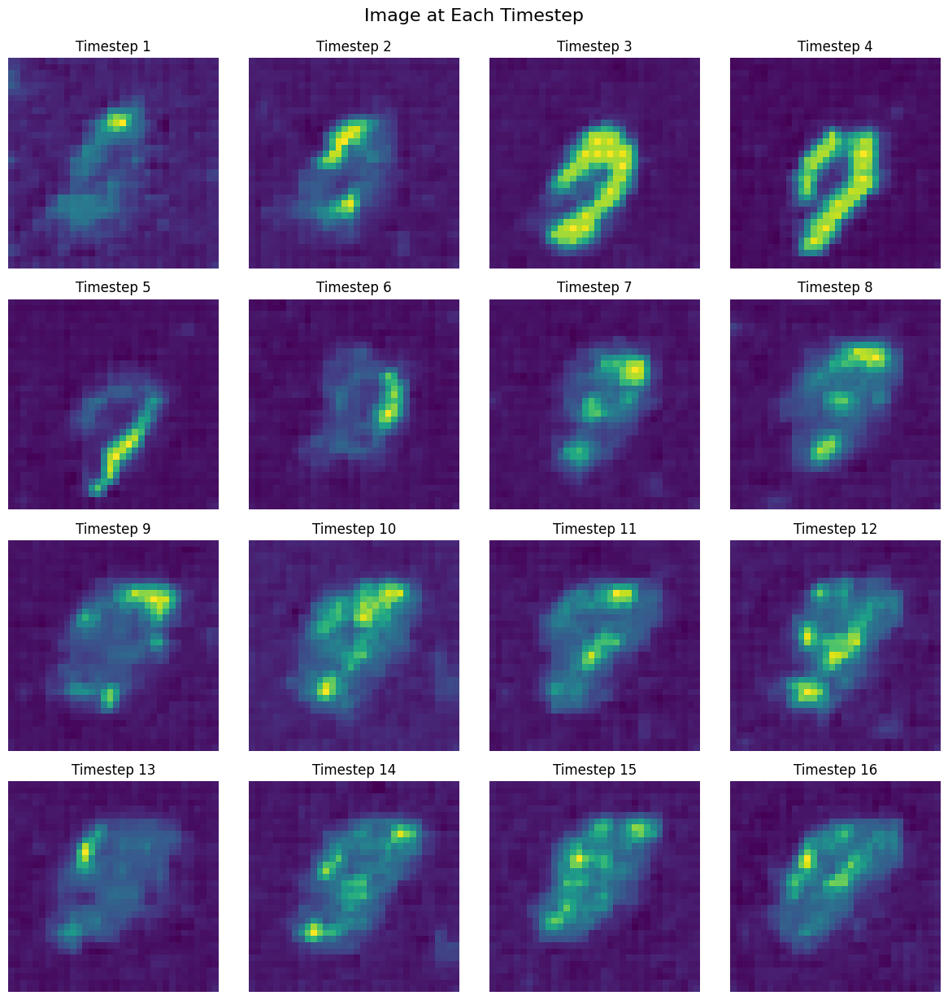

In [71]:
def test(network, testloader, epoch):
    n_steps = 16
    max_epoch = 1

    loss_meter = AverageMeter()
    recons_meter = AverageMeter()
    dist_meter = AverageMeter()

    mean_r_q = 0
    mean_r_p = 0
    mean_sampled_z_q = 0

    # count_mul_add, hook_handles = add_hook(net)
    i = 5
    network = network.eval()
    with torch.no_grad():
        for batch_idx, (real_img, labels) in enumerate(testloader):
            real_img = real_img.to('cuda:0', non_blocking=True)
            labels = labels.to('cuda:0', non_blocking=True)
            # direct spike input
            spike_input = real_img.unsqueeze(1)
            x_recon, r_q, r_p, sampled_z_q = network(spike_input,
                                                  scheduled=True)  # sampled_z (N, latent_dim, T)

            if batch_idx % i == 0:
                print('------------------------------------Original Image---------------------------------------------')
                plot_frames_without_polarity_permuted(spike_input[5][0])
                print('------------------------------------Recon Image---------------------------------------------')
                plot_frames_without_polarity_permuted(x_recon[5][0])

            losses = network.loss_function_mmd(spike_input, x_recon, r_q, r_p)

            mean_r_q = (r_q.mean(0).detach().cpu() + batch_idx * mean_r_q) / (batch_idx + 1)  # (latent_dim)
            mean_r_p = (r_p.mean(0).detach().cpu() + batch_idx * mean_r_p) / (batch_idx + 1)  # (latent_dim)
            mean_sampled_z_q = (sampled_z_q.mean(0).detach().cpu() + batch_idx * mean_sampled_z_q) / (batch_idx + 1)  # (C,T)

            loss_meter.update(losses['loss'].detach().cpu().item())
            recons_meter.update(losses['Reconstruction_Loss'].detach().cpu().item())
            dist_meter.update(losses['Distance_Loss'].detach().cpu().item())

            # print(
            #     f'Test[{epoch}/{max_epoch}] [{batch_idx}/{len(testloader)}] Loss: {loss_meter.avg}, RECONS: {recons_meter.avg}, DISTANCE: {dist_meter.avg}')

            # if batch_idx == len(testloader) - 1:
            #     os.makedirs(f'esvae_v1/checkpoint/nmnist/temp/imgs/test/', exist_ok=True)
                # torchvision.utils.save_image((real_img + 1) / 2,
                #                              f'esvae_v1/checkpoint/nmnist/temp/imgs/test/epoch{epoch}_input.png')
                # torchvision.utils.save_image((x_recon + 1) / 2,
                #                              f'esvae_v1/checkpoint/nmnist/temp/imgs/test/epoch{epoch}_recons.png')
                # writer.add_images('Test/input_img', (real_img + 1) / 2, epoch)
                # writer.add_images('Test/recons_img', (x_recon + 1) / 2, epoch)

            # break

    # logging.info(f"Test [{epoch}] Loss: {loss_meter.avg} ReconsLoss: {recons_meter.avg} DISTANCE: {dist_meter.avg}")
    # writer.add_scalar('Test/loss', loss_meter.avg, epoch)
    # writer.add_scalar('Test/recons_loss', recons_meter.avg, epoch)
    # writer.add_scalar('Test/distance', dist_meter.avg, epoch)
    # writer.add_scalar('Test/mean_r_q', mean_r_q.mean().item(), epoch)
    # writer.add_scalar('Test/mean_r_p', mean_r_p.mean().item(), epoch)
    # writer.add_scalar('Test/mul', count_mul_add.mul_sum.item() / len(testloader), epoch)
    # writer.add_scalar('Test/add', count_mul_add.add_sum.item() / len(testloader), epoch)

    # for handle in hook_handles:
    #     handle.remove()

    # writer.add_image('Test/mean_sampled_z_q', mean_sampled_z_q.unsqueeze(0), epoch)
    # writer.add_histogram('Test/mean_sampled_z_q_distribution', mean_sampled_z_q.sum(-1), epoch)

    return loss_meter.avg




for e in range(1):

    write_weight_hist(net, e)
    if scheduled:
        net.update_p(e, 1)
        print("update p")
    train_loss = test(net, testloader, e)

In [73]:
net.state_dict()

OrderedDict([('encoder.0.weight',
              tensor([[[[[ 4.5874e-01],
                         [-1.0607e-01],
                         [ 3.8382e-01]],
              
                        [[ 1.0147e-01],
                         [ 1.7860e-02],
                         [-1.0515e-01]],
              
                        [[-1.5403e-01],
                         [ 8.9646e-02],
                         [ 1.3065e-01]]]],
              
              
              
                      [[[[ 1.1751e-01],
                         [ 1.2456e-01],
                         [ 3.7832e-02]],
              
                        [[ 1.3787e-01],
                         [ 2.6335e-01],
                         [ 1.5828e-01]],
              
                        [[ 4.8538e-02],
                         [ 2.6779e-01],
                         [ 3.7925e-02]]]],
              
              
              
                      [[[[ 4.2823e-01],
                         [ 1.3923e-01],
      

In [75]:
torch.save(net.state_dict(), 'esvae_v6_model.pt')

<h3>Classification</h3>

In [78]:
model = ESVAE()
model.load_state_dict(torch.load('esvae_v6_model.pt', weights_only=True))

<All keys matched successfully>

In [82]:
print(model)

ESVAE(
  (encoder): Sequential(
    (0): tdConv(
      1, 32, kernel_size=(3, 3, 1), stride=(2, 2, 1), padding=(1, 1, 0)
      (bn): tdBatchNorm(32, eps=1e-05, momentum=0.2, affine=True, track_running_stats=True)
      (spike): LIFSpike()
    )
    (1): tdConv(
      32, 64, kernel_size=(3, 3, 1), stride=(2, 2, 1), padding=(1, 1, 0)
      (bn): tdBatchNorm(64, eps=1e-05, momentum=0.2, affine=True, track_running_stats=True)
      (spike): LIFSpike()
    )
    (2): tdConv(
      64, 128, kernel_size=(3, 3, 1), stride=(2, 2, 1), padding=(1, 1, 0)
      (bn): tdBatchNorm(128, eps=1e-05, momentum=0.2, affine=True, track_running_stats=True)
      (spike): LIFSpike()
    )
    (3): tdConv(
      128, 256, kernel_size=(3, 3, 1), stride=(2, 2, 1), padding=(1, 1, 0)
      (bn): tdBatchNorm(256, eps=1e-05, momentum=0.2, affine=True, track_running_stats=True)
      (spike): LIFSpike()
    )
    (4): tdConv(
      256, 512, kernel_size=(3, 3, 1), stride=(2, 2, 1), padding=(1, 1, 0)
      (bn): tdBa

In [81]:
for name, param in model.named_parameters():
    print([name])

['encoder.0.weight']
['encoder.0.bias']
['encoder.0.bn.weight']
['encoder.0.bn.bias']
['encoder.1.weight']
['encoder.1.bias']
['encoder.1.bn.weight']
['encoder.1.bn.bias']
['encoder.2.weight']
['encoder.2.bias']
['encoder.2.bn.weight']
['encoder.2.bn.bias']
['encoder.3.weight']
['encoder.3.bias']
['encoder.3.bn.weight']
['encoder.3.bn.bias']
['encoder.4.weight']
['encoder.4.bias']
['encoder.4.bn.weight']
['encoder.4.bn.bias']
['before_latent_layer.weight']
['before_latent_layer.bias']
['before_latent_layer.bn.weight']
['before_latent_layer.bn.bias']
['prior.layers.0.weight']
['prior.layers.0.bias']
['prior.layers.0.bn.weight']
['prior.layers.0.bn.bias']
['prior.layers.1.weight']
['prior.layers.1.bias']
['prior.layers.1.bn.weight']
['prior.layers.1.bn.bias']
['prior.layers.2.weight']
['prior.layers.2.bias']
['prior.layers.2.bn.weight']
['prior.layers.2.bn.bias']
['posterior.layers.0.weight']
['posterior.layers.0.bias']
['posterior.layers.0.bn.weight']
['posterior.layers.0.bn.bias']
['po

In [84]:
for name, module in model.named_modules():
    print(f"{name}: {module}")

: ESVAE(
  (encoder): Sequential(
    (0): tdConv(
      1, 32, kernel_size=(3, 3, 1), stride=(2, 2, 1), padding=(1, 1, 0)
      (bn): tdBatchNorm(32, eps=1e-05, momentum=0.2, affine=True, track_running_stats=True)
      (spike): LIFSpike()
    )
    (1): tdConv(
      32, 64, kernel_size=(3, 3, 1), stride=(2, 2, 1), padding=(1, 1, 0)
      (bn): tdBatchNorm(64, eps=1e-05, momentum=0.2, affine=True, track_running_stats=True)
      (spike): LIFSpike()
    )
    (2): tdConv(
      64, 128, kernel_size=(3, 3, 1), stride=(2, 2, 1), padding=(1, 1, 0)
      (bn): tdBatchNorm(128, eps=1e-05, momentum=0.2, affine=True, track_running_stats=True)
      (spike): LIFSpike()
    )
    (3): tdConv(
      128, 256, kernel_size=(3, 3, 1), stride=(2, 2, 1), padding=(1, 1, 0)
      (bn): tdBatchNorm(256, eps=1e-05, momentum=0.2, affine=True, track_running_stats=True)
      (spike): LIFSpike()
    )
    (4): tdConv(
      256, 512, kernel_size=(3, 3, 1), stride=(2, 2, 1), padding=(1, 1, 0)
      (bn): td

model.encoder

In [86]:
model.before_latent_layer

tdLinear(
  in_features=2048, out_features=64, bias=True
  (bn): tdBatchNorm(64, eps=1e-05, momentum=0.2, affine=True, track_running_stats=True)
  (spike): LIFSpike()
)

In [87]:
model.sample_layer

Sequential(
  (0): Linear(in_features=64, out_features=64, bias=True)
  (1): Sigmoid()
)

<h3>Classifier</h3>

In [114]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class ESVAEClassifier(nn.Module):
    def __init__(self, base_model: ESVAE, num_classes: int = 10, device='cuda:0'):
        super().__init__()

        # Use pretrained encoder and latent layer from ESVAE
        self.encoder = base_model.encoder
        self.before_latent_layer = base_model.before_latent_layer
        self.sample_layer = base_model.sample_layer
        self.device = device

        # Freeze encoder parameters
        for param in self.encoder.parameters():
            param.requires_grad = False
        for param in self.before_latent_layer.parameters():
            param.requires_grad = False
        for param in self.sample_layer.parameters():
            param.requires_grad = False

        self.n_steps = base_model.n_steps  # usually 16
        self.latent_dim = base_model.latent_dim  # usually 64

        # Classifier head on top of average latent representation over time
        self.classifier = nn.Sequential(
            nn.Linear(self.latent_dim, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.encoder(x)  # shape: (N, C, H, W, T)
        x = torch.flatten(x, start_dim=1, end_dim=3)  # (N, C*H*W, T)
        latent_x = self.before_latent_layer(x)  # (N,latent_dim,T)

        sampled_z_q, r_q, r_p = self.gaussian_sample(latent_x, latent_x.shape[0])
        latent_avg = sampled_z_q.mean(dim=-1)
        logits = self.classifier(latent_avg)  # (N, num_classes)
        
        return logits


    def gaussian_sample(self, latent_x=None, batch_size=None, mu=None, var=None):
        if latent_x is not None:
            sampled_z_n = torch.randn((batch_size, self.latent_dim)).to(self.device)  # (N, latent_dim)
            r_p = self.sample_layer(sampled_z_n)

            r_q = latent_x.mean(-1, keepdim=True).repeat((1, 1, self.n_steps))
            sampled_z_q = SampledSpikeAct.apply(r_q)

            r_q = latent_x.mean(-1)   # (N, latent_dim)

            return sampled_z_q, r_q, r_p
        else:
            sampled_z_n = torch.randn((batch_size, self.latent_dim)).to(self.device)
            # if mu is None and var is None:
            #     mu = self.mu
            #     var = self.var
            # var = var * torch.ones_like(sampled_p).to(self.device)  # (N, latent_dim)
            # mu = mu * torch.ones_like(sampled_p).to(self.device)  # (N, latent_dim)
            # sampled_p = mu + sampled_z_n * var
            r_p = self.sample_layer(sampled_z_n)
            r_p = r_p.unsqueeze(dim=-1).repeat((1, 1, self.n_steps))
            sampled_z_q = SampledSpikeAct.apply(r_p)
            return sampled_z_q, None, None


In [115]:
# Assuming esvae is your trained ESVAE model with loaded weights
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
classifier_model = ESVAEClassifier(base_model=model, num_classes=10, device=device)
classifier_model.to(device)

# Example input
dummy_input = torch.randn(32, 1, 34, 34, 16).to(device)  # (batch, channel, height, width, time_steps)

# Forward pass
logits = classifier_model(dummy_input)
print(logits.shape)  # Expected: [16, 10]


torch.Size([32, 10])


In [116]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

In [117]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(classifier_model.classifier.parameters(), lr=1e-5)

num_epochs = 5

In [122]:
for epoch in range(num_epochs):
    # ---------- Training ----------
    classifier_model.train()
    running_loss = 0.0
    all_preds = []
    all_labels = []
    i = 0
    print('Train')
    for images, labels in trainloader:
        if i%100 == 0:
            print(i)
        images = images.to(device)  # shape: (N, 1, H, W, T)
        labels = labels.to(device)
        spike_input = images.unsqueeze(1)

        optimizer.zero_grad()
        outputs = classifier_model(spike_input)  # shape: (N, num_classes)

        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        i=i+1

    train_acc = accuracy_score(all_labels, all_preds)
    train_f1 = f1_score(all_labels, all_preds, average='macro')
    train_precision = precision_score(all_labels, all_preds, average='macro')
    train_recall = recall_score(all_labels, all_preds, average='macro')

    # ---------- Evaluation ----------
    classifier_model.eval()
    test_loss = 0.0
    test_preds = []
    test_labels = []
    i = 0
    print('Test')
    with torch.no_grad():
        for images, labels in testloader:
            if i%100 == 0:
                print(i)
            images = images.to(device)
            labels = labels.to(device)
            spike_input = images.unsqueeze(1)
            
            outputs = classifier_model(spike_input)
            loss = criterion(outputs, labels)

            test_loss += loss.item()

            preds = torch.argmax(outputs, dim=1)
            test_preds.extend(preds.cpu().numpy())
            test_labels.extend(labels.cpu().numpy())
            i = i+1

    test_acc = accuracy_score(test_labels, test_preds)
    test_f1 = f1_score(test_labels, test_preds, average='macro')
    test_precision = precision_score(test_labels, test_preds, average='macro')
    test_recall = recall_score(test_labels, test_preds, average='macro')

    # ---------- Logging ----------
    print(f"\nEpoch [{epoch + 1}/{num_epochs}]")
    print(f"Train Loss: {running_loss / len(trainloader):.4f}")
    print(f"Train Acc: {train_acc:.4f} | F1: {train_f1:.4f} | Precision: {train_precision:.4f} | Recall: {train_recall:.4f}")
    print(f"Test  Loss: {test_loss / len(testloader):.4f}")
    print(f"Test  Acc: {test_acc:.4f} | F1: {test_f1:.4f} | Precision: {test_precision:.4f} | Recall: {test_recall:.4f}")

Train
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
Test
0
100

Epoch [1/5]
Train Loss: 2.2136
Train Acc: 0.2629 | F1: 0.2107 | Precision: 0.3585 | Recall: 0.2569
Test  Loss: 2.1187
Test  Acc: 0.4382 | F1: 0.3689 | Precision: 0.6230 | Recall: 0.4260
Train
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
Test
0
100

Epoch [2/5]
Train Loss: 2.0532
Train Acc: 0.4485 | F1: 0.4026 | Precision: 0.5358 | Recall: 0.4391
Test  Loss: 1.9423
Test  Acc: 0.5917 | F1: 0.5566 | Precision: 0.6903 | Recall: 0.5810
Train
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
Test
0
100

Epoch [3/5]
Train Loss: 1.8929
Train Acc: 0.5395 | F1: 0.5043 | Precision: 0.6048 | Recall: 0.5302
Test  Loss: 1.7727
Test  Acc: 0.6550 | F1: 0.6261 | Precision: 0.7143 | Recall: 0.6456
Train
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
Test
0
100

Epoch [4/5]
Train Loss: 1.7392
Train A

In [123]:
for epoch in range(5,10):
    # ---------- Training ----------
    classifier_model.train()
    running_loss = 0.0
    all_preds = []
    all_labels = []
    i = 0
    print('Train')
    for images, labels in trainloader:
        if i%100 == 0:
            print(i)
        images = images.to(device)  # shape: (N, 1, H, W, T)
        labels = labels.to(device)
        spike_input = images.unsqueeze(1)

        optimizer.zero_grad()
        outputs = classifier_model(spike_input)  # shape: (N, num_classes)

        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        i=i+1

    train_acc = accuracy_score(all_labels, all_preds)
    train_f1 = f1_score(all_labels, all_preds, average='macro')
    train_precision = precision_score(all_labels, all_preds, average='macro')
    train_recall = recall_score(all_labels, all_preds, average='macro')

    # ---------- Evaluation ----------
    classifier_model.eval()
    test_loss = 0.0
    test_preds = []
    test_labels = []
    i = 0
    print('Test')
    with torch.no_grad():
        for images, labels in testloader:
            if i%100 == 0:
                print(i)
            images = images.to(device)
            labels = labels.to(device)
            spike_input = images.unsqueeze(1)
            
            outputs = classifier_model(spike_input)
            loss = criterion(outputs, labels)

            test_loss += loss.item()

            preds = torch.argmax(outputs, dim=1)
            test_preds.extend(preds.cpu().numpy())
            test_labels.extend(labels.cpu().numpy())
            i = i+1

    test_acc = accuracy_score(test_labels, test_preds)
    test_f1 = f1_score(test_labels, test_preds, average='macro')
    test_precision = precision_score(test_labels, test_preds, average='macro')
    test_recall = recall_score(test_labels, test_preds, average='macro')

    # ---------- Logging ----------
    print(f"\nEpoch [{epoch + 1}/{10}]")
    print(f"Train Loss: {running_loss / len(trainloader):.4f}")
    print(f"Train Acc: {train_acc:.4f} | F1: {train_f1:.4f} | Precision: {train_precision:.4f} | Recall: {train_recall:.4f}")
    print(f"Test  Loss: {test_loss / len(testloader):.4f}")
    print(f"Test  Acc: {test_acc:.4f} | F1: {test_f1:.4f} | Precision: {test_precision:.4f} | Recall: {test_recall:.4f}")

Train
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
Test
0
100

Epoch [6/10]
Train Loss: 1.4676
Train Acc: 0.6500 | F1: 0.6305 | Precision: 0.6709 | Recall: 0.6431
Test  Loss: 1.3259
Test  Acc: 0.7340 | F1: 0.7212 | Precision: 0.7563 | Recall: 0.7274
Train
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
Test
0
100

Epoch [7/10]
Train Loss: 1.3537
Train Acc: 0.6743 | F1: 0.6584 | Precision: 0.6872 | Recall: 0.6680
Test  Loss: 1.2127
Test  Acc: 0.7580 | F1: 0.7463 | Precision: 0.7697 | Recall: 0.7525
Train
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
Test
0
100

Epoch [8/10]
Train Loss: 1.2606
Train Acc: 0.6881 | F1: 0.6743 | Precision: 0.6954 | Recall: 0.6824
Test  Loss: 1.1169
Test  Acc: 0.7687 | F1: 0.7591 | Precision: 0.7779 | Recall: 0.7631
Train
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
Test
0
100

Epoch [9/10]
Train Loss: 1.1820
Tra

In [125]:
for epoch in range(10,15):
    # ---------- Training ----------
    classifier_model.train()
    running_loss = 0.0
    all_preds = []
    all_labels = []
    i = 0
    print('Train')
    for images, labels in trainloader:
        if i%100 == 0:
            print(i)
        images = images.to(device)  # shape: (N, 1, H, W, T)
        labels = labels.to(device)
        spike_input = images.unsqueeze(1)

        optimizer.zero_grad()
        outputs = classifier_model(spike_input)  # shape: (N, num_classes)

        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        i=i+1

    train_acc = accuracy_score(all_labels, all_preds)
    train_f1 = f1_score(all_labels, all_preds, average='macro')
    train_precision = precision_score(all_labels, all_preds, average='macro')
    train_recall = recall_score(all_labels, all_preds, average='macro')

    # ---------- Evaluation ----------
    classifier_model.eval()
    test_loss = 0.0
    test_preds = []
    test_labels = []
    i = 0
    print('Test')
    with torch.no_grad():
        for images, labels in testloader:
            if i%100 == 0:
                print(i)
            images = images.to(device)
            labels = labels.to(device)
            spike_input = images.unsqueeze(1)
            
            outputs = classifier_model(spike_input)
            loss = criterion(outputs, labels)

            test_loss += loss.item()

            preds = torch.argmax(outputs, dim=1)
            test_preds.extend(preds.cpu().numpy())
            test_labels.extend(labels.cpu().numpy())
            i = i+1

    test_acc = accuracy_score(test_labels, test_preds)
    test_f1 = f1_score(test_labels, test_preds, average='macro')
    test_precision = precision_score(test_labels, test_preds, average='macro')
    test_recall = recall_score(test_labels, test_preds, average='macro')

    # ---------- Logging ----------
    print(f"\nEpoch [{epoch + 1}/{15}]")
    print(f"Train Loss: {running_loss / len(trainloader):.4f}")
    print(f"Train Acc: {train_acc:.4f} | F1: {train_f1:.4f} | Precision: {train_precision:.4f} | Recall: {train_recall:.4f}")
    print(f"Test  Loss: {test_loss / len(testloader):.4f}")
    print(f"Test  Acc: {test_acc:.4f} | F1: {test_f1:.4f} | Precision: {test_precision:.4f} | Recall: {test_recall:.4f}")

Train
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
Test
0
100

Epoch [11/15]
Train Loss: 1.0559
Train Acc: 0.7214 | F1: 0.7119 | Precision: 0.7211 | Recall: 0.7168
Test  Loss: 0.9054
Test  Acc: 0.7981 | F1: 0.7916 | Precision: 0.8004 | Recall: 0.7942
Train
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
Test
0
100

Epoch [12/15]
Train Loss: 1.0121
Train Acc: 0.7284 | F1: 0.7199 | Precision: 0.7270 | Recall: 0.7241
Test  Loss: 0.8577
Test  Acc: 0.8018 | F1: 0.7952 | Precision: 0.8023 | Recall: 0.7979
Train
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
Test
0
100

Epoch [13/15]
Train Loss: 0.9710
Train Acc: 0.7354 | F1: 0.7276 | Precision: 0.7336 | Recall: 0.7312
Test  Loss: 0.8234
Test  Acc: 0.8053 | F1: 0.8004 | Precision: 0.8059 | Recall: 0.8015
Train
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
Test
0
100

Epoch [14/15]
Train Loss: 0.9315

<h3>Test 2</h3>

In [126]:
# Assuming esvae is your trained ESVAE model with loaded weights
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
classifier_model = ESVAEClassifier(base_model=model, num_classes=10, device=device)
classifier_model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(classifier_model.classifier.parameters(), lr=1e-3)

num_epochs = 10

In [127]:
for epoch in range(num_epochs):
    # ---------- Training ----------
    classifier_model.train()
    running_loss = 0.0
    all_preds = []
    all_labels = []
    i = 0
    print('Train')
    for images, labels in trainloader:
        if i%100 == 0:
            print(i)
        images = images.to(device)  # shape: (N, 1, H, W, T)
        labels = labels.to(device)
        spike_input = images.unsqueeze(1)

        optimizer.zero_grad()
        outputs = classifier_model(spike_input)  # shape: (N, num_classes)

        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        i=i+1

    train_acc = accuracy_score(all_labels, all_preds)
    train_f1 = f1_score(all_labels, all_preds, average='macro')
    train_precision = precision_score(all_labels, all_preds, average='macro')
    train_recall = recall_score(all_labels, all_preds, average='macro')

    # ---------- Evaluation ----------
    classifier_model.eval()
    test_loss = 0.0
    test_preds = []
    test_labels = []
    i = 0
    print('Test')
    with torch.no_grad():
        for images, labels in testloader:
            if i%100 == 0:
                print(i)
            images = images.to(device)
            labels = labels.to(device)
            spike_input = images.unsqueeze(1)
            
            outputs = classifier_model(spike_input)
            loss = criterion(outputs, labels)

            test_loss += loss.item()

            preds = torch.argmax(outputs, dim=1)
            test_preds.extend(preds.cpu().numpy())
            test_labels.extend(labels.cpu().numpy())
            i = i+1

    test_acc = accuracy_score(test_labels, test_preds)
    test_f1 = f1_score(test_labels, test_preds, average='macro')
    test_precision = precision_score(test_labels, test_preds, average='macro')
    test_recall = recall_score(test_labels, test_preds, average='macro')

    # ---------- Logging ----------
    print(f"\nEpoch [{epoch + 1}/{num_epochs}]")
    print(f"Train Loss: {running_loss / len(trainloader):.4f}")
    print(f"Train Acc: {train_acc:.4f} | F1: {train_f1:.4f} | Precision: {train_precision:.4f} | Recall: {train_recall:.4f}")
    print(f"Test  Loss: {test_loss / len(testloader):.4f}")
    print(f"Test  Acc: {test_acc:.4f} | F1: {test_f1:.4f} | Precision: {test_precision:.4f} | Recall: {test_recall:.4f}")

Train
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
Test
0
100

Epoch [1/10]
Train Loss: 0.7546
Train Acc: 0.7701 | F1: 0.7659 | Precision: 0.7676 | Recall: 0.7671
Test  Loss: 0.4194
Test  Acc: 0.8737 | F1: 0.8710 | Precision: 0.8729 | Recall: 0.8714
Train
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
Test
0
100

Epoch [2/10]
Train Loss: 0.5114
Train Acc: 0.8354 | F1: 0.8329 | Precision: 0.8331 | Recall: 0.8334
Test  Loss: 0.3541
Test  Acc: 0.8870 | F1: 0.8851 | Precision: 0.8855 | Recall: 0.8853
Train
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
Test
0
100

Epoch [3/10]
Train Loss: 0.4617
Train Acc: 0.8515 | F1: 0.8493 | Precision: 0.8494 | Recall: 0.8498
Test  Loss: 0.3223
Test  Acc: 0.8953 | F1: 0.8937 | Precision: 0.8942 | Recall: 0.8940
Train
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
Test
0
100

Epoch [4/10]
Train Loss: 0.4363
Tra

<h3> TEst 3 </h3>